# primary exploration

In [113]:
import pandas as pd
import scanpy as sc
import numpy as np

In [114]:
ad = sc.read_h5ad('/public/home/lizw/home2/task/singlecell/singlecell_hormone/20240101/ad_after_sub_1227_v3.h5ad')

In [115]:
ourdeg = ad.uns['deg_mergeAllCells']

In [117]:
ad

AnnData object with n_obs × n_vars = 453193 × 32833
    obs: 'Sample', 'Replicates', 'Time', 'All_label', 'Hormone', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_Mito_Chlo', 'log1p_total_counts_Mito_Chlo', 'pct_counts_Mito_Chlo', 'outlier', 'ambientRnaFractionEstimatedBySoupx', 'Treatment', 'Cluster_prev', 'new_anno_prev', 'Cluster', 'leiden_NN25_0.95', 'Cluster_0+', 'Cluster_0+17+', 'Cluster_final', '__group', 'cluster5', 'cluster10', 'cluster11', 'cluster22', 'cluster23', 'cluster12', 'cluster13', 'cluster33', 'cluster30', 'anno_v2', 'cluster_anno_v2', 'anno_v3', 'anno_v3_cluster'
    var: 'Mito_Chlo', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'nSamples', 'highly_variable'
    uns: 'Cluster_0+17+_colors', 'Cluster_0+_colors', 'Cluster_colors', 'Cluster_final_colors', 'Cluster_prev_colors', 'Hormone_colors', 'Time_colors', 'Treatment_colors', 'anno_v2_co

In [122]:
set1 = set(list(ourdeg.query('(b == "AUX_05h") & (logFC <-1) & (fdr < 0.05) ')['gene']))

In [121]:
set2 = set(list(ourdeg.query('(b == "AUX_3h") & (logFC <-1) & (fdr < 0.05) ')['gene']))

In [126]:
len(set1&set2)/len(set1)

0.0847457627118644

In [ ]:
ourdeg.query('(b == "AUX_05h") & (logFC <-1) & (fdr < 0.05) ')

In [127]:
ourdeg = ad.uns['deg_mergeAllCells']
#ourdeg['logFC'] = - ourdeg['logFC']
condition_up = (ourdeg['logFC'] >= 1) & (ourdeg['fdr'] < 0.05)
condition_down = (ourdeg['logFC'] <= -1) & (ourdeg['fdr'] < 0.05)
ourdeg['DEG'] = np.where(condition_up, 'Up', np.where(condition_down, 'Down', 'Fail'))

In [136]:
set3 = set(list(ourdeg.query('(DEG == "Down") & (b == "AUX_05h")')['gene']))

In [135]:
set4 = set(list(ourdeg.query('(DEG == "Down") & (b == "AUX_3h")')['gene']))

In [137]:
set1==set3

True

In [138]:
set2==set4

True

In [139]:
len(set3&set4)/len(set3)

0.0847457627118644

In [141]:
cpmdf = sc.read_h5ad('/public/home/lizw/home2/task/singlecell/singlecell_hormone/20240101/cpm_deg/groupby_sample/All_leiden_mergei_cpm_Sample.h5ad')
cpmdf = cpmdf.to_df().unstack().reset_index()
cpmdf.columns=['gene','sample','cpm']
ourdeg = ourdeg.rename({'a':'background','b':'sample','Time':'time'},axis=1)
ourdeg['hormone'] = ourdeg['sample'].str.split('_').str[0]
ourdeg = pd.merge(ourdeg,cpmdf,on=['sample','gene'],how='left')
ourdeg['time'] = ourdeg['time'].replace({'0.5h':'05h'})
ourdeg['gene_time'] = ourdeg['gene']+'_'+ourdeg['time']

In [142]:
mock_list = ['Mock_05h','Mock_3h']
cpmdf_mock = cpmdf.query('sample in @mock_list')
cpmdf_mock['time'] = cpmdf_mock['sample'].str.split('_').str[1]
cpmdf_mock['gene_time'] = cpmdf_mock['gene']+'_'+cpmdf_mock['time']
cpmdf_mock_map = dict(zip(cpmdf_mock['gene_time'],cpmdf_mock['cpm']))
ourdeg['cpm_mock'] = ourdeg['gene_time'].map(cpmdf_mock_map)
ourdeg = ourdeg.reindex(['gene','sample','background','cpm','cpm_mock','logFC','logCPM','LR','PValue','fdr','DEG'],axis=1)

/tmp/ipykernel_19072/3037943435.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cpmdf_mock['time'] = cpmdf_mock['sample'].str.split('_').str[1]
/tmp/ipykernel_19072/3037943435.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cpmdf_mock['gene_time'] = cpmdf_mock['gene']+'_'+cpmdf_mock['time']


In [143]:
ourdeg.to_csv('/public/home/lizw/home2/task/singlecell/singlecell_hormone/20240101/cpm_deg/DEGRAW_and_cpm_all_pesudobulk.csv')

In [144]:
ourdeg_pass = ourdeg.query('DEG != "Fail"').sort_values(by=['sample','DEG'],ascending=[True,False]).reset_index(drop=True)


In [150]:
ourdeg_pass = ourdeg_pass[~ourdeg_pass['gene'].str.contains('ATC')]

In [151]:
ourdeg_pass.to_csv('/public/home/lizw/home2/task/singlecell/singlecell_hormone/20240101/cpm_deg/DEG_and_cpm_all_pesudobulk.csv')

## compare 1

In [10]:
#first compare: merge two time point, and compair with the genelist that as list as up  or down in 
#Different Plant Hormones Regulate Similar Processes through Largely Nonoverlapping Transcriptional Responses

In [25]:
celldeg = pd.concat(pd.read_excel('/public/home/lizw/home2/task/singlecell/singlecell_hormone/20240101/cpm_deg/2006CELL_deg.xlsx', sheet_name=None), ignore_index=True)

In [26]:
celldeg['geneid'] = celldeg['geneid'].str.upper()

In [27]:
celldeg['direction'] = celldeg['direction'].str.capitalize()

In [28]:
celldeg_dict = celldeg.groupby(['direction','hormone'])['geneid'].apply(list).to_dict()

In [13]:
ourdeg_pass['hormone'] = ourdeg_pass['sample'].str.split('_').str[0]

In [15]:
ourdeg_pass = ourdeg_pass.groupby(['DEG','hormone'])['gene'].apply(list).to_dict()

In [35]:
set_df = pd.DataFrame(columns=['Only_Our','Overlap','Only_Cell','sum'],index = celldeg_dict.keys())
count_df =  pd.DataFrame(columns=['Only_Our','Overlap','Only_Cell','sum'],index = celldeg_dict.keys())
for key in [(x,y) for x in ['Up','Down'] for y in ['AUX','CK','ABA','GA','BR','ET','JA']]:
    only_cell = set(celldeg_dict[key]) - set(ourdeg_pass[key])
    only_our =  set(ourdeg_pass[key]) -  set(celldeg_dict[key])
    overlap = set(celldeg_dict[key]) & set(ourdeg_pass[key])
    sum_ = set(celldeg_dict[key]) | set(ourdeg_pass[key])
    set_df.loc[key,'Only_Cell'] = only_cell
    set_df.loc[key,'Only_Our'] = only_our
    set_df.loc[key,'Overlap'] = overlap
    set_df.loc[key,'sum'] = sum_
    count_df.loc[key,'Only_Cell'] = len(only_cell)
    count_df.loc[key,'Only_Our'] = len(only_our)
    count_df.loc[key,'Overlap'] = len(overlap)
    count_df.loc[key,'sum'] = len(sum_)

In [42]:
count_df.reindex(['Only_Our','Overlap','Only_Cell'],axis=1)

Only_Our Overlap Only_Cell
Down ABA     1624     306      1170
     AUX      177      29       326
     BR       928      65       318
     CK       697      22       141
     ET       911      23       342
     GA       253       8        74
     JA      1083     129       572
Up   ABA     1512     784       654
     AUX      278     136       294
     BR      1040      51       213
     CK       873     139       193
     ET      1025      54       113
     GA       281       0        40
     JA      1315     450       356

<Axes: >

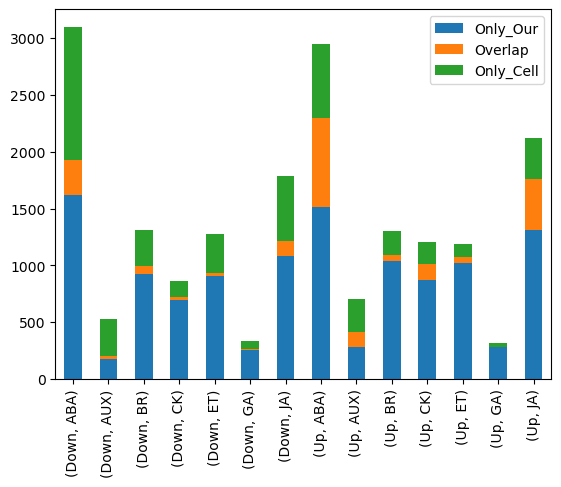

In [43]:
count_df.reindex(['Only_Our','Overlap','Only_Cell'],axis=1).plot(kind='bar',stacked=True)

## ref genome diff

In [47]:
tair10_comparedwith_tigr = pd.read_table('/public/home/lizw/data/IMPORTANT_genome/arabidopsis/tair10/CellRangerIndex/TAIR10_locushistory.txt')

In [93]:
new_gene_set = set(list(tair10_comparedwith_tigr.query('(operation == "insert") |(operation == "splitinsert")')['tair10id']))

In [97]:
obsolete_set = set(list(tair10_comparedwith_tigr.query('(operation == "obsolete") | (operation == "mergeobsolete")')['tair10id']))

In [100]:
len(new_gene_set)

8529

In [101]:
len(obsolete_set)

1868

In [102]:
araport11_comparediwith_tair = pd.read_table('/public/home/lizw/data/IMPORTANT_genome/arabidopsis/tair10/CellRangerIndex/araport11_history.tsv')

In [104]:
Araport11['Operation'].drop_duplicates()

0         obsolete
7    mergeobsolete
Name: Operation, dtype: object

In [106]:
araport11_comparediwith_tair 

,AGI,Center,Operation,Datestamp,Loci Involved （new)
0,AT1G00001,MIPS,obsolete,20011109,NaN
1,AT1G00002,MIPS,obsolete,20011109,NaN
2,AT1G00009,MIPS,obsolete,20011109,NaN
3,AT1G00089,MIPS,obsolete,20011109,NaN
4,AT1G00234,MIPS,obsolete,20011109,NaN
...,...,...,...,...,...
1264,AT5G64541,Araport,obsolete,20150917,NaN
1265,AT5G64552,Araport,obsolete,20150917,NaN
1266,AT5G65166,Araport,obsolete,20150917,NaN
1267,AT5G65533,Araport,obsolete,20150917,NaN


In [116]:
araport11_obsolete_set = set(list(araport11_comparediwith_tair['AGI']))

In [117]:
len(araport11_obsolete_set  - obsolete_set)

496

In [118]:
obsolete_all = araport11_obsolete_set | obsolete_set

In [120]:
len(obsolete_all)

2364

In [ ]:
# 参考基因组id不会变化，只有基因的增减。所以可以直接看两个基因组版本之间的并集
# 我们用的版本是2016年发布的araport11
# 之前芯片用的版本是 ATH1 GeneChip （2004 24k版本） tair现有最接近的版本是 affy25k_array_elements-2004-06-01.txt
#对应序列可以在此下载https://www.arabidopsis.org/download/index-auto.jsp?dir=%2Fdownload_files%2FMicroarrays%2FAffymetrix%2Fold
#对应基因组是TIGR2.0  
# 参考https://onlinelibrary.wiley.com/doi/full/10.1111/j.1365-313X.2004.02061.x 

In [121]:
# how many genes in TIGR covered by ATH1 GeneChip(2004)
ath1_df = pd.read_table('/public/home/lizw/home2/task/singlecell/singlecell_hormone/20240101/cpm_deg/affy25k_array_elements-2004-06-01.txt')

In [130]:
ath1_df['locus'].dropna().drop_duplicates().str.split(',').str[0]

0        AT1G01010
1        AT1G01030
2        AT1G01040
3        AT1G01050
4        AT1G01060
           ...    
22241    ATMG01350
22242    ATMG01360
22243    ATMG01370
22244    ATMG01400
22245    ATMG01410
Name: locus, Length: 21833, dtype: object

In [133]:
ath1_gene_set = set(list(ath1_df['locus'].dropna().drop_duplicates().str.split(';').str[0]))

In [137]:
len(ath1_gene_set - obsolete_all)

20975

## modiy the overlap list of the deg 

In [138]:
set_df = pd.DataFrame(columns=['Only_Our','Overlap','Only_Cell','sum'],index = celldeg_dict.keys())
count_df =  pd.DataFrame(columns=['Only_Our','Overlap','Only_Cell','sum'],index = celldeg_dict.keys())
for key in [(x,y) for x in ['Up','Down'] for y in ['AUX','CK','ABA','GA','BR','ET','JA']]:
    celldeg_filter = set(celldeg_dict[key]) - obsolete_all
    ourdeg_filter =  set(ourdeg_pass[key]) - new_gene_set 
    only_cell = celldeg_filter - ourdeg_filter
    only_our =  ourdeg_filter - celldeg_filter
    overlap = celldeg_filter & ourdeg_filter
    sum_ = celldeg_filter | ourdeg_filter
    set_df.loc[key,'Only_Cell'] = only_cell
    set_df.loc[key,'Only_Our'] = only_our
    set_df.loc[key,'Overlap'] = overlap
    set_df.loc[key,'sum'] = sum_
    count_df.loc[key,'Only_Cell'] = len(only_cell)
    count_df.loc[key,'Only_Our'] = len(only_our)
    count_df.loc[key,'Overlap'] = len(overlap)
    count_df.loc[key,'sum'] = len(sum_)

<Axes: >

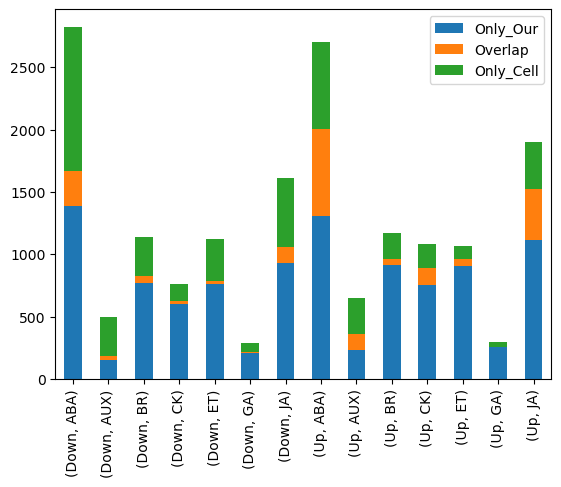

In [141]:
count_df.reindex(['Only_Our','Overlap','Only_Cell'],axis=1).plot(kind='bar',stacked=True)

## compare with the list provided by goda with twp seperated time point

In [155]:
#use ABA as example 
gene_listUP_aba_strict = pd.read_csv(
    '/public/home/lizw/home2/task/singlecell/singlecell_hormone/20240101/cpm_deg/aba_strict.csv',sep='\t')

In [165]:
up_aba_list = set(list(gene_listUP_aba_strict.query('signal_raio>1')['AGI_code'].str.split(";").str[0])) - obsolete_all

In [164]:
cell_aba = set(celldeg_dict[('Up','ABA')]) - new_gene_set 

In [169]:
len(cell_aba & up_aba_list)

297

In [170]:
len(cell_aba | up_aba_list)

1378

## IAA

## compare with rna-seq: 3d seedling 1um IAA 6h

In [2]:
import pandas as pd

In [24]:
deg_df = pd.read_table('/public/home/lizw/home2/task/singlecell/singlecell_hormone/20240101/cpm_deg/rna-seq-deg-collect/aux/3d_seedling_1um_6h_2017_scientific_report/deg_raw.tsv')

In [28]:
up_df_logfc1 = deg_df[(deg_df['log2 Fold Changes'] >= 1) & 
                      (deg_df['Benjamini Hochberg corrected p value '] < 0.05)]
down_df_logfc1 = deg_df[(deg_df['log2 Fold Changes'] <= -1) & 
                      (deg_df['Benjamini Hochberg corrected p value '] < 0.05)]

In [37]:
bulk_gene_upset = set(list(up_df_logfc1['ID ']))

In [36]:
bulk_gene_downset = set(list(down_df_logfc1['ID ']))

In [55]:
ourdeg_pass = pd.read_csv('/public/home/lizw/home2/task/singlecell/singlecell_hormone/20240101/cpm_deg/DEG_and_cpm_all_pesudobulk.csv')

In [56]:
aux_list = ['AUX_3h']

In [57]:
our_aux_up = set(list(ourdeg_pass.query('(sample in @aux_list) & (DEG == "Up")')['gene']))
our_aux_down = set(list(ourdeg_pass.query('(sample in @aux_list) & (DEG == "Down")')['gene']))

In [58]:
count_df = pd.DataFrame([],columns=['Up','Down'])
for key in ['Up','Down']:
    if key == "Up":
        bulklist = bulk_gene_upset
        ourlist = our_aux_up
    if key == "Down":
        bulklist = bulk_gene_downset
        ourlist = our_aux_down
    only_cell = bulklist - ourlist
    only_our = ourlist - bulklist 
    overlap = bulklist & ourlist
    sum_ = bulklist | ourlist
#     set_df.loc[key,'Only_Bulk'] = only_cell
#     set_df.loc[key,'Only_Our'] = only_our
#     set_df.loc[key,'Overlap'] = overlap
#     set_df.loc[key,'sum'] = sum_
    count_df.loc[key,'Only_Bulk'] = len(only_cell)
    count_df.loc[key,'Only_Our'] = len(only_our)
    count_df.loc[key,'Overlap'] = len(overlap)
    count_df.loc[key,'sum'] = len(sum_)

In [59]:
count_df

,Up,Down,Only_Bulk,Only_Our,Overlap,sum
Up,NaN,NaN,621.0,143.0,66.0,830.0
Down,NaN,NaN,548.0,86.0,13.0,647.0


In [60]:
deg_df

,ID,the mean number of reads in control,the mean number of reads after IAA treatment,Fold Changes,log2 Fold Changes,p-value,Benjamini Hochberg corrected p value
0,AT1G01020,10.97,17.67,1.612,0.688,0.38200,0.945
1,AT1G01030,0.00,1.10,inf,inf,0.75000,1.000
2,AT1G01040,46.95,79.91,1.702,0.767,0.04740,0.325
3,AT1G01050,64.17,54.83,0.854,-0.227,0.53900,1.000
4,AT1G01060,65.53,41.91,0.640,-0.645,0.09550,0.508
...,...,...,...,...,...,...,...
20418,ATMG01350,398.66,277.40,0.696,-0.523,0.00959,0.105
20419,ATMG01360,2862.12,2662.29,0.930,-0.104,0.48500,1.000
20420,ATMG01370,52.98,65.33,1.233,0.302,0.44100,0.989
20421,ATMG01400,1.27,0.85,0.671,-0.576,1.00000,1.000


In [88]:
aux_list = ['AUX_05h','AUX_3h']

In [89]:
deg_aux_our = ourdeg.query('sample in @aux_list')

In [90]:
compare_deg = pd.merge(deg_aux_our,deg_df,left_on='gene',right_on='ID ').reindex(['gene','logFC','fdr','log2 Fold Changes','Benjamini Hochberg corrected p value '],axis=1)

In [98]:
compare_deg.columns = ['gene','7d_5um_IAA_logfc','ourfdr','3d_1um_5h_IAA_logfc','scientifireport2017_fdr',]

In [103]:
compare_deg.query('(ourfdr < 0.05) or (scientifireport2017_fdr < 0.05)')

,gene,7d_5um_IAA_logfc,ourfdr,3d_1um_5h_IAA_logfc,scientifireport2017_fdr
20,AT1G01120,0.161905,0.874454,2.069,2.910000e-08
21,AT1G01120,-0.386976,0.724436,2.069,2.910000e-08
38,AT1G01220,0.021915,0.970677,-1.611,3.280000e-02
39,AT1G01220,-0.146117,0.813479,-1.611,3.280000e-02
67,AT1G01430,-0.976360,0.000057,-0.938,5.470000e-01
...,...,...,...,...,...
37943,AT5G67430,2.271184,0.001101,2.724,1.270000e-04
37966,AT5G67550,0.836084,0.604819,4.547,2.200000e-08
37967,AT5G67550,1.185700,0.520598,4.547,2.200000e-08
37982,AT5G67630,0.042981,0.921883,1.628,4.660000e-03


In [99]:
import seaborn as sns

<Axes: xlabel='7d_5um_IAA_logfc', ylabel='3d_1um_5h_IAA_logfc'>

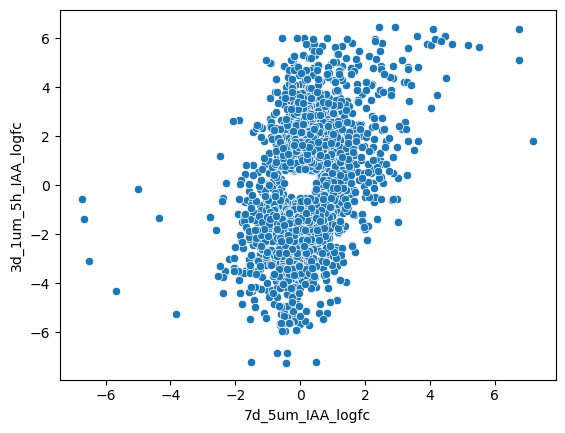

In [104]:
sns.scatterplot(compare_deg.query('(ourfdr < 0.05) or (scientifireport2017_fdr < 0.05)'),x='7d_5um_IAA_logfc',y='3d_1um_5h_IAA_logfc')

## ck

In [ ]:
#compare with the same treatment:
#https://www.nature.com/articles/s41477-018-0290-y#Sec8
#10day seedling continue light
#shoot and root RNA-seq

In [111]:
ck_shoot_deg = pd.read_table('/public/home/lizw/home2/task/singlecell/singlecell_hormone/20240101/cpm_deg/rna-seq-deg-collect/ck/shoot_45min_5um_10d_continuelight.tsv')
ck_root_deg = pd.read_table('/public/home/lizw/home2/task/singlecell/singlecell_hormone/20240101/cpm_deg/rna-seq-deg-collect/ck/root_45min_5um_10d_continuelight.tsv')

In [117]:
shoot_deg_list = set(list(ck_shoot_deg['geneId']))
root_deg_list = set(list(ck_root_deg['geneId']))

In [119]:
len(shoot_deg_list&root_deg_list)/len(shoot_deg_list|root_deg_list)

0.1384083044982699

In [120]:
shootOrroot_set = shoot_deg_list|root_deg_list

In [108]:
sample_list = ['CK_05h','CK_3h']

In [123]:
ck_our = set(list(ourdeg_pass.query('sample in @sample_list')['gene']))

In [127]:
shootAndroot_set = shoot_deg_list&root_deg_list

In [124]:
len(ck_our & shootOrroot_set) / len(ck_our | shootOrroot_set)

0.17990942774804447

In [128]:
len(ck_our & shootAndroot_set) / len(ck_our | shootAndroot_set)

0.060090702947845805

In [125]:
len(ck_our & root_deg_list) / len(ck_our | root_deg_list)

0.15160599571734476

In [126]:
len(ck_our & shoot_deg_list) / len(ck_our | shoot_deg_list)

0.10172228202368137

In [169]:
from matplotlib_venn import venn3,venn2

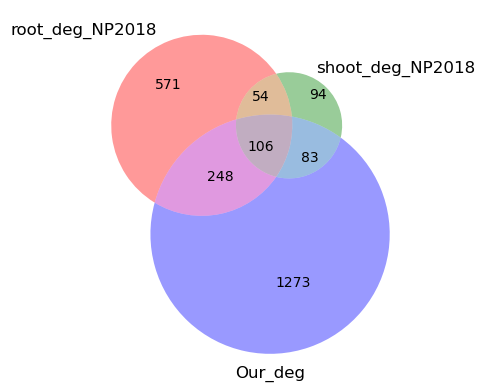

In [132]:
venn3(subsets=([root_deg_list,shoot_deg_list,ck_our]),
      set_labels=['root_deg_NP2018','shoot_deg_NP2018','Our_deg'])

In [133]:
ourdeg_pass

,Unnamed: 0,gene,sample,background,cpm,cpm_mock,logFC,logCPM,LR,PValue,fdr,DEG
0,0,AT1G01010,ABA_05h,Mock_05h,85.845964,24.496768,2.043896,5.531692,100.290472,1.316084e-23,5.712592e-21,Up
1,1,AT1G01030,ABA_05h,Mock_05h,104.316097,39.387717,1.453042,5.589216,31.933588,1.595346e-08,6.352988e-07,Up
2,2,AT1G01470,ABA_05h,Mock_05h,219.794578,123.255391,1.192139,6.494978,8.904359,2.844908e-03,1.983393e-02,Up
3,3,AT1G01480,ABA_05h,Mock_05h,9.636591,1.967457,2.341154,2.058036,46.983366,7.159174e-12,5.670641e-10,Up
4,4,AT1G01520,ABA_05h,Mock_05h,21.642177,1.967457,3.530517,2.771145,137.527499,9.245405e-32,8.360543e-29,Up
...,...,...,...,...,...,...,...,...,...,...,...,...
17311,17311,AT5G61890,SL_3h,Mock_3h,2.655593,5.040003,-1.288363,2.742105,13.303556,2.649032e-04,2.346610e-02,Down
17312,17312,AT5G63450,SL_3h,Mock_3h,12.767274,37.024638,-1.560597,5.828234,22.583172,2.012396e-06,7.607041e-04,Down
17313,17313,AT5G64190,SL_3h,Mock_3h,1.532073,2.752617,-1.492609,0.793467,11.413635,7.290704e-04,4.496483e-02,Down
17314,17314,AT5G67060,SL_3h,Mock_3h,7.609295,21.516936,-1.662554,4.246374,30.782113,2.886866e-08,4.475260e-05,Down


In [134]:
our_ck_deg = ourdeg_pass.query('sample in @sample_list')

In [135]:
our_ck_deg

,Unnamed: 0,gene,sample,background,cpm,cpm_mock,logFC,logCPM,LR,PValue,fdr,DEG
8131,8131,AT1G01010,CK_05h,Mock_05h,133.636917,24.496768,2.471174,5.531692,145.475179,1.690737e-33,3.669407e-30,Up
8132,8132,AT1G01030,CK_05h,Mock_05h,147.003600,39.387717,1.943494,5.589216,56.100391,6.886343e-14,1.868179e-11,Up
8133,8133,AT1G01480,CK_05h,Mock_05h,5.083526,1.967457,1.417350,2.058036,16.540745,4.761580e-05,1.246569e-03,Up
8134,8134,AT1G02460,CK_05h,Mock_05h,3.678080,1.427371,1.356108,1.467180,10.494219,1.197486e-03,1.520717e-02,Up
8135,8135,AT1G04197,CK_05h,Mock_05h,1.016705,0.347198,1.726874,-0.247692,8.704877,3.173598e-03,3.133603e-02,Up
...,...,...,...,...,...,...,...,...,...,...,...,...
10028,10028,AT5G57655,CK_3h,Mock_3h,74.371076,249.829076,-1.810919,6.864556,23.262258,1.413467e-06,9.556535e-05,Down
10029,10029,AT5G64190,CK_3h,Mock_3h,1.260006,2.752617,-1.129074,0.793467,8.655138,3.261403e-03,3.857343e-02,Down
10030,10030,AT5G64700,CK_3h,Mock_3h,1.690252,4.225849,-1.436295,1.636234,13.239449,2.741184e-04,6.242594e-03,Down
10031,10031,AT5G67060,CK_3h,Mock_3h,10.510293,21.516936,-1.058532,4.246374,14.310444,1.550025e-04,4.033596e-03,Down


In [137]:
ck_our_and_root = pd.merge(our_ck_deg,ck_root_deg,left_on='gene',right_on='geneId')

In [143]:
import matplotlib.pyplot as plt

(-5.0, 5.0)

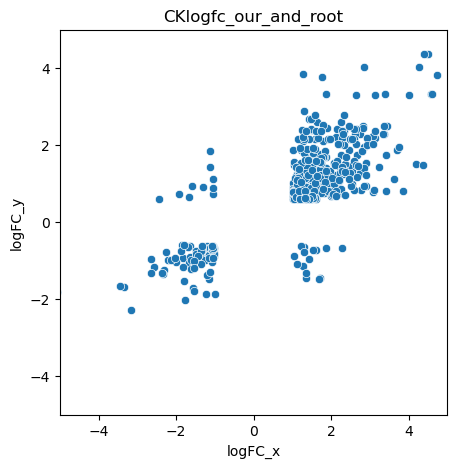

In [147]:
fig,ax = plt.subplots(1,figsize=(5,5))
sns.scatterplot(ck_our_and_root,x='logFC_x',y='logFC_y',ax=ax)
plt.title('CKlogfc_our_and_root')
plt.xlim(-5,5)
plt.ylim(-5,5)

In [138]:
ck_our_and_root

,Unnamed: 0,gene,sample,background,cpm,cpm_mock,logFC_x,logCPM_x,LR_x,PValue_x,fdr,DEG,logFC_y,logCPM_y,LR_y,PValue_y,FDR,geneId,Overlap with differential region
0,8133,AT1G01480,CK_05h,Mock_05h,5.083526,1.967457,1.417350,2.058036,16.540745,4.761580e-05,0.001247,Up,1.177801,2.373137,42.839454,5.940000e-11,5.120000e-09,AT1G01480,False
1,8134,AT1G02460,CK_05h,Mock_05h,3.678080,1.427371,1.356108,1.467180,10.494219,1.197486e-03,0.015207,Up,-1.462865,2.659295,60.107046,8.980000e-15,1.200000e-12,AT1G02460,False
2,8136,AT1G03850,CK_05h,Mock_05h,155.406368,53.159915,1.503270,6.610086,23.380953,1.328879e-06,0.000062,Up,2.388558,6.767769,136.512039,1.540000e-31,7.760000e-29,AT1G03850,True
3,9285,AT1G03850,CK_3h,Mock_3h,202.092642,81.221588,1.241701,6.610086,16.282570,5.456355e-05,0.001827,Up,2.388558,6.767769,136.512039,1.540000e-31,7.760000e-29,AT1G03850,True
4,8138,AT1G04240,CK_05h,Mock_05h,189.226765,68.745261,1.517281,6.417247,22.653076,1.940493e-06,0.000085,Up,1.716523,6.149614,209.024709,2.240000e-47,2.520000e-44,AT1G04240,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
457,9864,AT2G28120,CK_3h,Mock_3h,5.869783,14.073239,-1.329970,3.002256,15.383128,8.776851e-05,0.002609,Down,-0.612521,4.341310,16.008427,6.310000e-05,1.575869e-03,AT2G28120,False
458,9903,AT3G23550,CK_3h,Mock_3h,22.280591,62.883731,-1.540981,5.402385,26.913638,2.127523e-07,0.000021,Down,-1.194605,4.087743,19.806258,8.570000e-06,2.746330e-04,AT3G23550,False
459,9929,AT4G01026,CK_3h,Mock_3h,6.576616,13.646778,-1.049741,4.560122,10.326857,1.311083e-03,0.020095,Down,1.107137,3.544676,31.431812,2.070000e-08,1.150000e-06,AT4G01026,False
460,9985,AT5G19890,CK_3h,Mock_3h,2.458548,12.134777,-2.368898,2.026972,14.030961,1.798252e-04,0.004522,Down,-1.311669,4.068859,35.840874,2.140000e-09,1.430000e-07,AT5G19890,False


In [150]:
shootlist = ['5','2','14','25','28','1','3','4','8']
rootlist = ['6','17,0','17,1','0,0','31','32',
           '19','17,2','0,1','16','21','26','27']

In [153]:
ck_shoot = ad.uns['df_degRes'].query('(b in @sample_list) & (Cluster in @shootlist)')

In [154]:
ck_root = ad.uns['df_degRes'].query('(b in @sample_list) & (Cluster in @rootlist)')

In [157]:
ck_shoot_pass = ck_shoot.query('((fdr < 0.05) & (logFC >1))|((fdr < 0.05) & (logFC <-1))')

In [158]:
ck_root_pass = ck_root.query('((fdr < 0.05) & (logFC >1))|((fdr < 0.05) & (logFC <-1))')

In [161]:
ck_shoot_pass_set = set(list(ck_shoot_pass['index']))
ck_root_pass_set = set(list(ck_root_pass['index']))

In [199]:
cluster_count_shoot = ck_shoot_pass.groupby('index').count()['logFC']
cluster_count_root = ck_root_pass.groupby('index').count()['logFC']

In [200]:
ck_shoot_pass_set = set(list(cluster_count_shoot[cluster_count_shoot > 3].index))
ck_root_pass_set = set(list(cluster_count_root[cluster_count_root > 3].index))

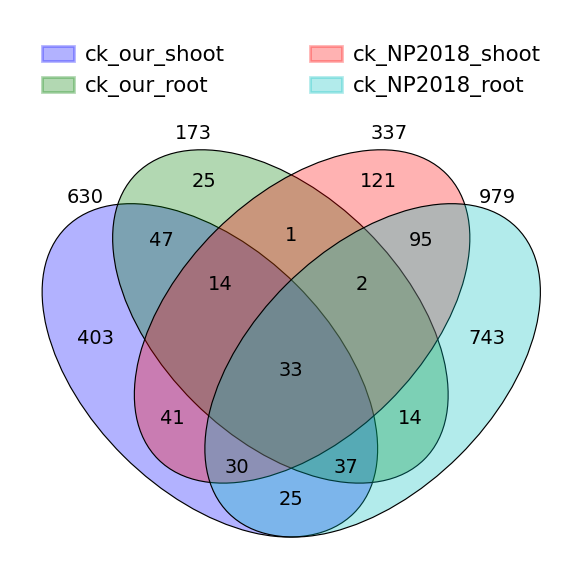

In [201]:
from venny4py.venny4py import *

#dict of sets
sets = {
    'ck_our_shoot':ck_shoot_pass_set,
    'ck_our_root':ck_root_pass_set,
    'ck_NP2018_shoot':shoot_deg_list,
    'ck_NP2018_root':root_deg_list}
    
venny4py(sets=sets)

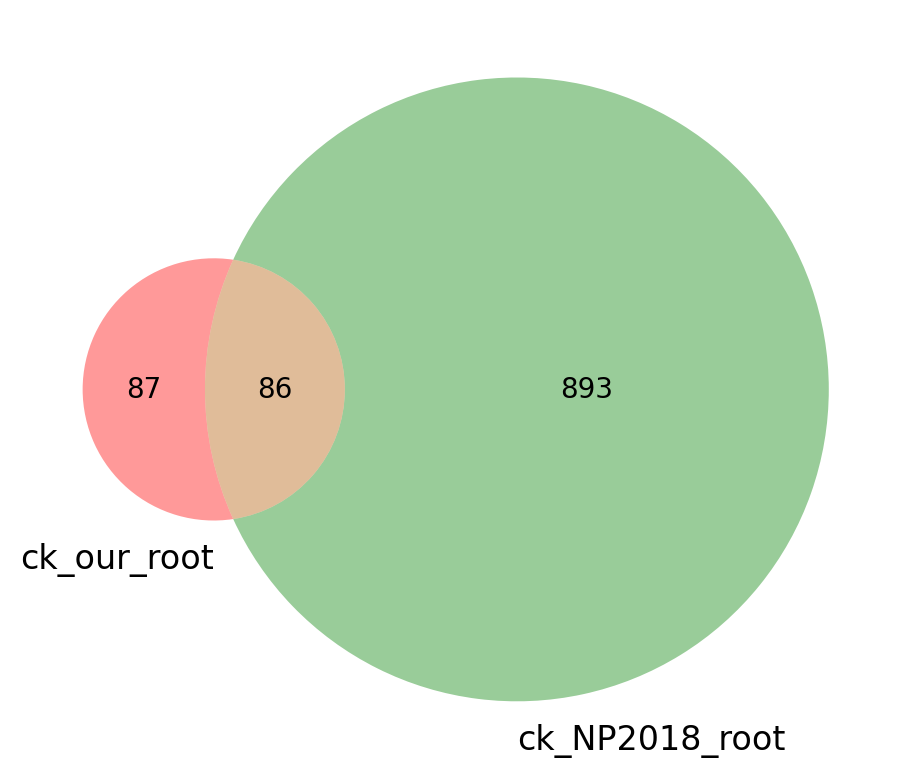

In [203]:
venn2(subsets=([ck_root_pass_set,root_deg_list]),
      set_labels=['ck_our_root','ck_NP2018_root'])

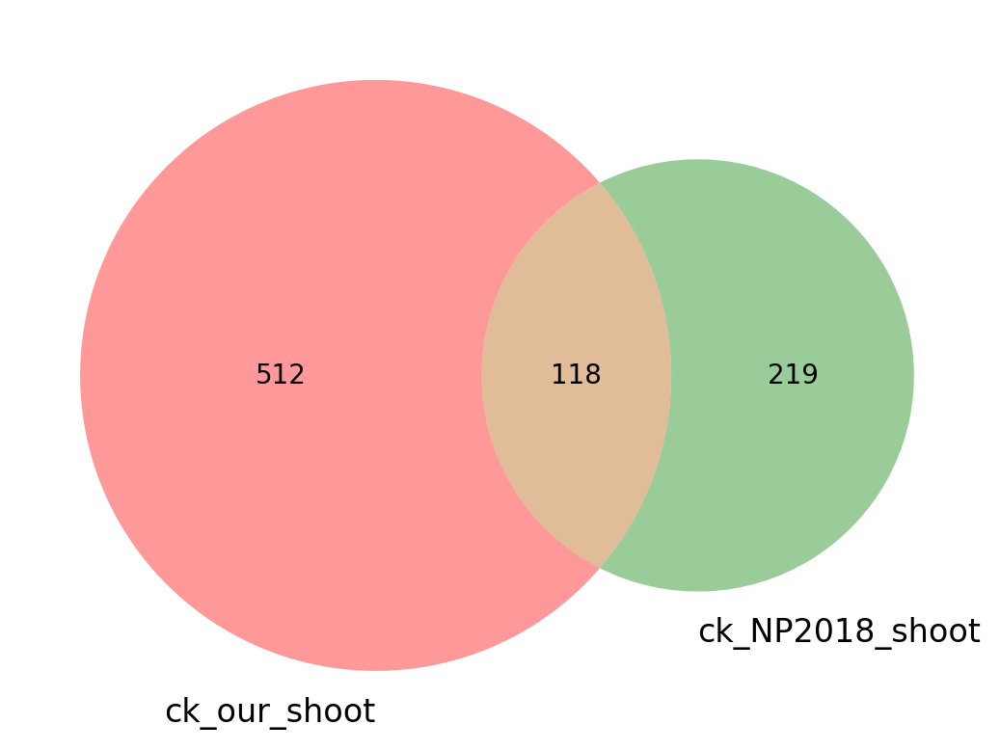

In [204]:
venn2(subsets=([ck_shoot_pass_set,shoot_deg_list]),
      set_labels=['ck_our_shoot','ck_NP2018_shoot'])

In [194]:
cluster_count_shoot = ck_shoot_pass.groupby('index').count()['logFC']
cluster_count_shoot[cluster_count_shoot > 3]

In [196]:
cluster_count_shoot[cluster_count_shoot > 3]

index
AT1G01010    9
AT1G01030    7
AT1G01240    5
AT1G01340    5
AT1G01620    5
            ..
AT5G66880    5
AT5G67060    5
AT5G67080    7
AT5G67520    5
AT5G67620    6
Name: logFC, Length: 630, dtype: int64

# libraries collection on going

In [2]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [3]:
import numpy as np

In [8]:
def comparedeg(label):
    df = pd.read_excel('/public/home/lizw/home2/task/singlecell/singlecell_hormone/20240101/cpm_deg/compare_ONGOING/hormone_deg_collected.xlsx',
                  sheet_name=label)
#     df.iloc[:,0] = df.iloc[:,0].str.upper()
#     df.iloc[:,1] = df.iloc[:,1].str.upper()
    compare_jaccard_df = pd.DataFrame(columns =df.columns ,index = df.columns)
    for i in range(len(df.columns)):
        for j in range(len(df.columns)):
            deg_set1 = set(list(df.iloc[:,i].drop_duplicates()))
            deg_set2 = set(list(df.iloc[:,j].drop_duplicates()))
            jaccard_index =  len(deg_set1& deg_set2)/len(deg_set1| deg_set2)
            compare_jaccard_df.iloc[i,j] = jaccard_index
    plt.figure(figsize=(15,12))
    plt.title(label)
    for i in range(len(df.columns)):
        compare_jaccard_df.iloc[i,i] = np.nan
    
    ax = sns.heatmap(compare_jaccard_df.astype('float'),cmap='Reds', fmt=".2%",
                 annot=compare_jaccard_df,cbar_kws = dict(use_gridspec=False,location="right"),)
    return compare_jaccard_df

In [43]:
def comparedeg_qmod(df,label,cmap):
    compare_qmod = pd.DataFrame(columns =df.columns ,index = df.columns)
    overlap_matrix = pd.DataFrame(columns =df.columns ,index = df.columns)
    for i in range(len(df.columns)):
        for j in range(len(df.columns)):
            deg_set1 = set(list(df.iloc[:,i].drop_duplicates().dropna()))
            deg_set2 = set(list(df.iloc[:,j].drop_duplicates().dropna()))
            qmod =  len(deg_set1& deg_set2)/len(deg_set2)
            overlap = len(deg_set1& deg_set2)
            compare_qmod.iloc[i,j] = qmod
            overlap_matrix.iloc[i,j] = overlap
    plt.figure(figsize=(len(df.columns)*1+2,len(df.columns)*1))
    plt.title(label,fontweight="bold",fontdict = {'fontsize': 13,'fontweight' : 'bold'})
    for i in range(len(df.columns)):
        compare_qmod.iloc[i,i] = np.nan
        
    
    ax = sns.heatmap(compare_qmod.astype('float'),cmap=cmap, fmt=".2%",
                 annot=compare_qmod,cbar_kws = dict(use_gridspec=False,location="right"),)
    plt.setp(ax.get_xticklabels(), rotation=30, ha="right", rotation_mode="anchor")
    
    return compare_qmod,overlap_matrix

In [152]:
df = pd.read_excel('/public/home/lizw/home2/task/singlecell/singlecell_hormone/20240101/cpm_deg/compare_ONGOING/hormone_deg_collected.xlsx',
                  sheet_name='ABA_up')
df.iloc[:,0] = df.iloc[:,0].str.upper()
df.iloc[:,1] = df.iloc[:,1].str.upper()

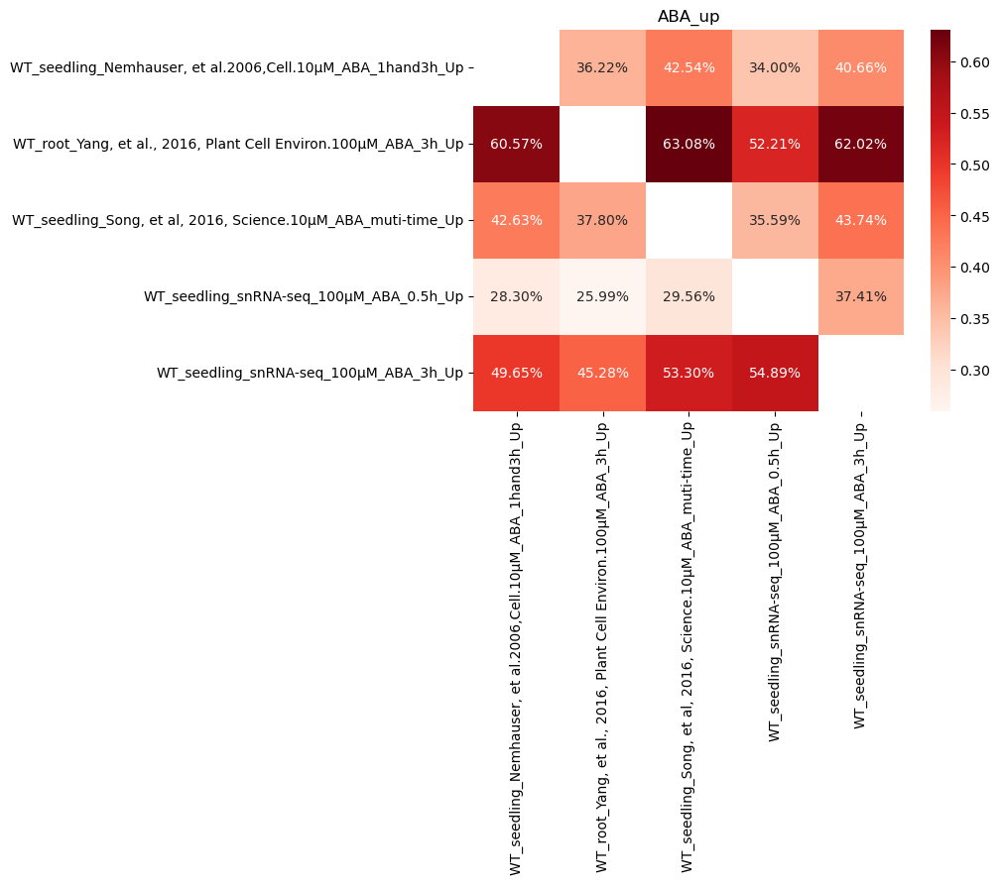

In [153]:
compare_qmod,overlap_matrix = comparedeg_qmod(df,'ABA_up')

In [154]:
df = pd.read_excel('/public/home/lizw/home2/task/singlecell/singlecell_hormone/20240101/cpm_deg/compare_ONGOING/hormone_deg_collected.xlsx',
                  sheet_name='ABA_down')
df.iloc[:,0] = df.iloc[:,0].str.upper()
df.iloc[:,1] = df.iloc[:,1].str.upper()

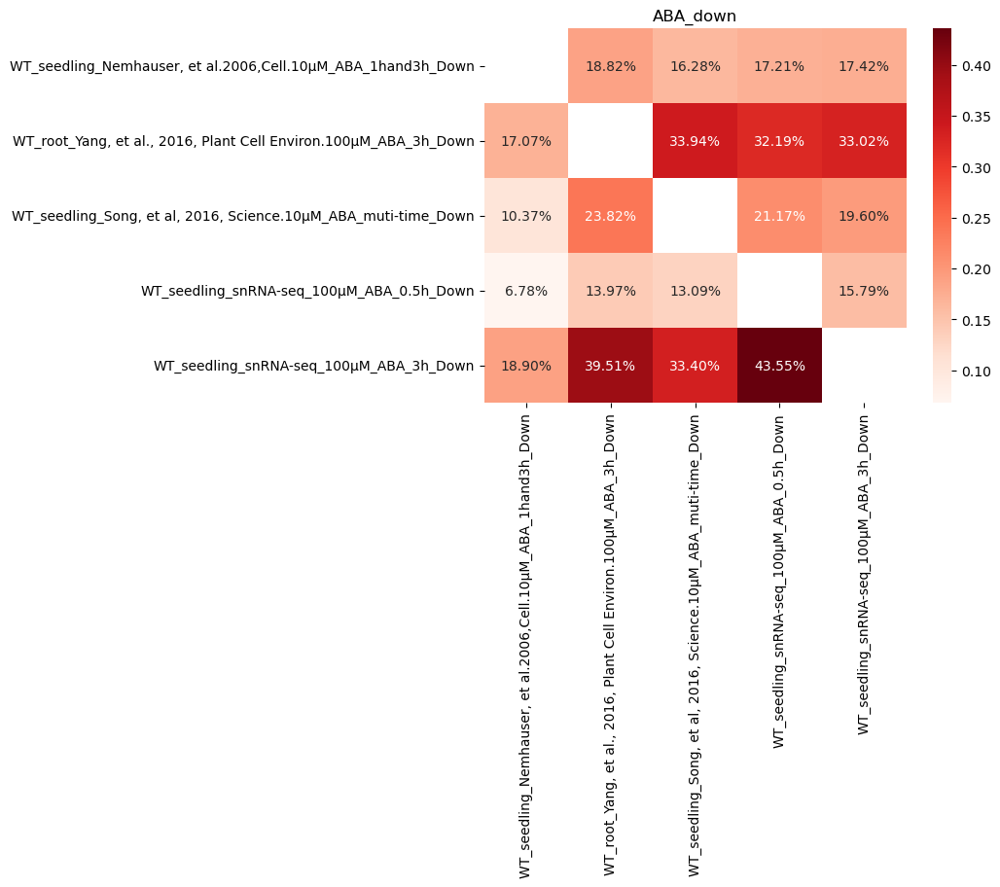

In [155]:
compare_qmod,overlap_matrix = comparedeg_qmod(df,'ABA_down')

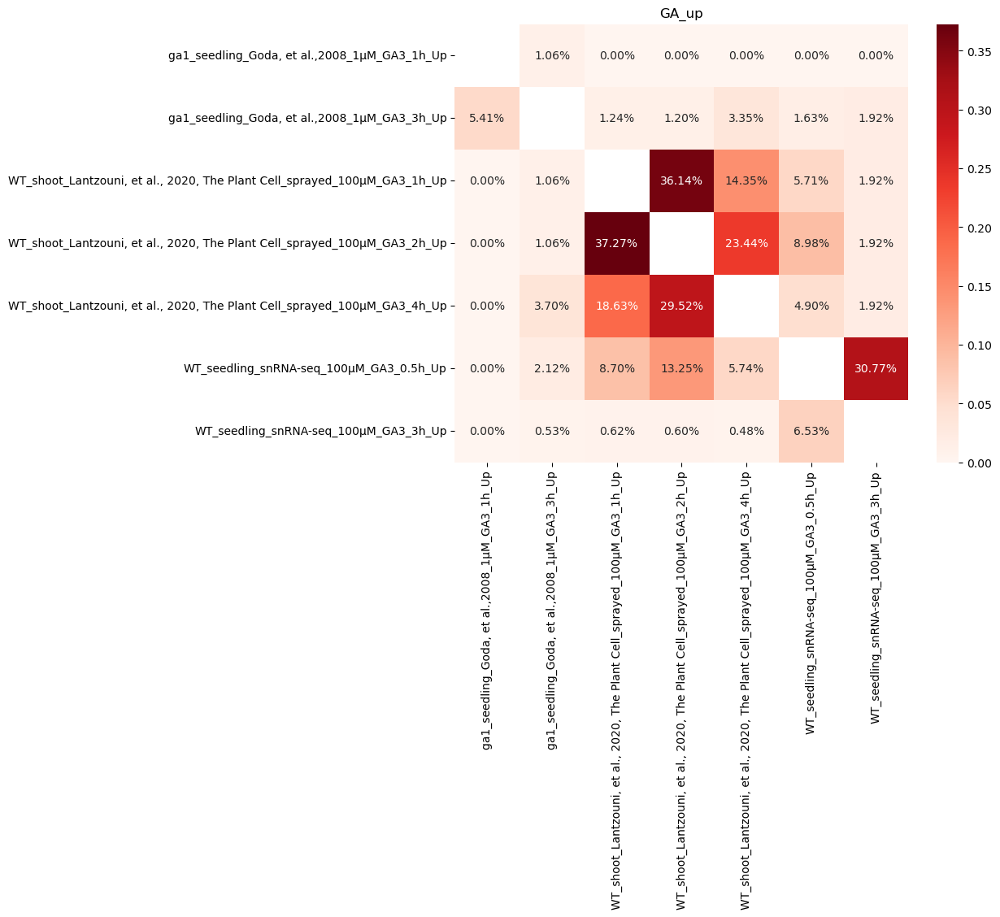

In [156]:
df = pd.read_excel('/public/home/lizw/home2/task/singlecell/singlecell_hormone/20240101/cpm_deg/compare_ONGOING/hormone_deg_collected.xlsx',
                  sheet_name='GA_up')
compare_qmod,overlap_matrix = comparedeg_qmod(df,'GA_up')

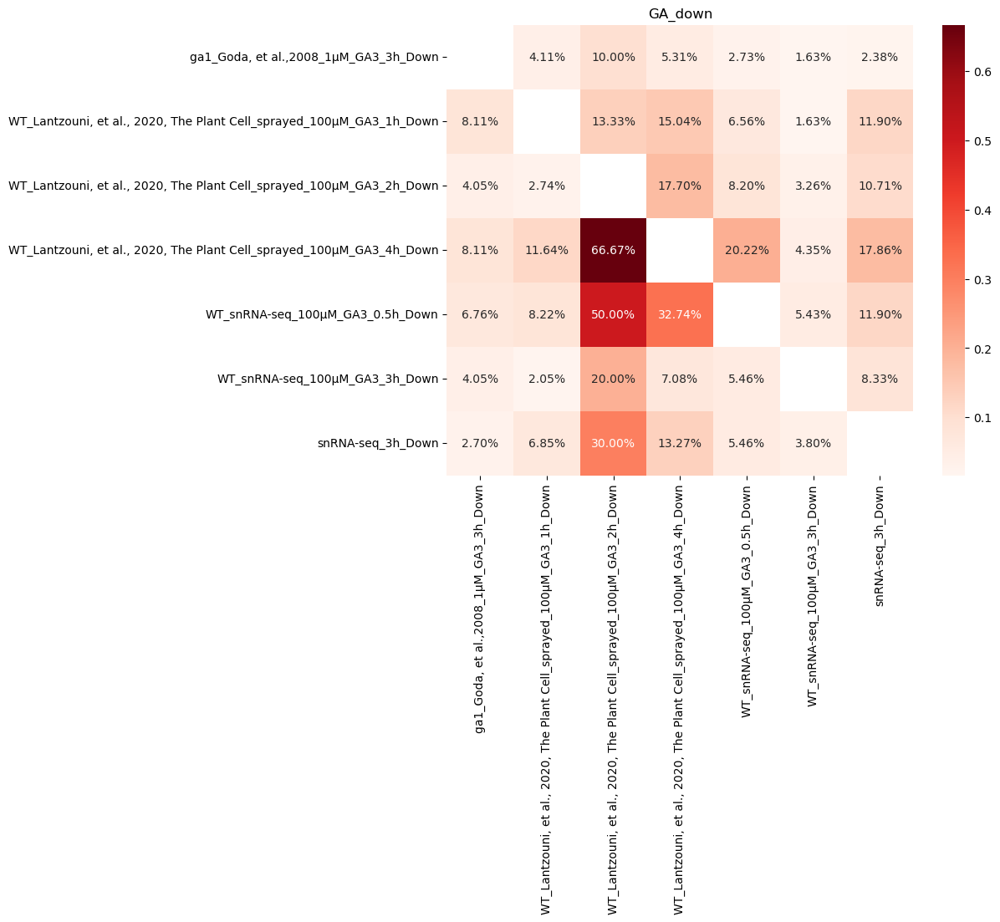

In [106]:
df = pd.read_excel('/public/home/lizw/home2/task/singlecell/singlecell_hormone/20240101/cpm_deg/compare_ONGOING/hormone_deg_collected.xlsx',
                  sheet_name='GA_down')
compare_qmod,overlap_matrix = comparedeg_qmod(df,'GA_down')

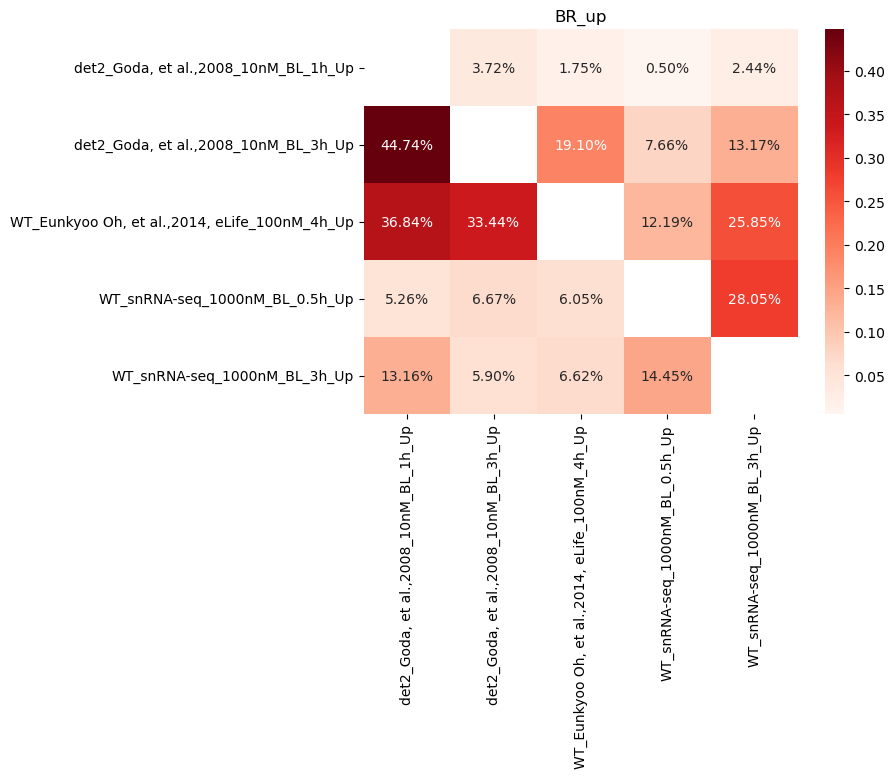

In [157]:
df = pd.read_excel('/public/home/lizw/home2/task/singlecell/singlecell_hormone/20240101/cpm_deg/compare_ONGOING/hormone_deg_collected.xlsx',
                  sheet_name='BR_up')
compare_qmod,overlap_matrix = comparedeg_qmod(df,'BR_up')

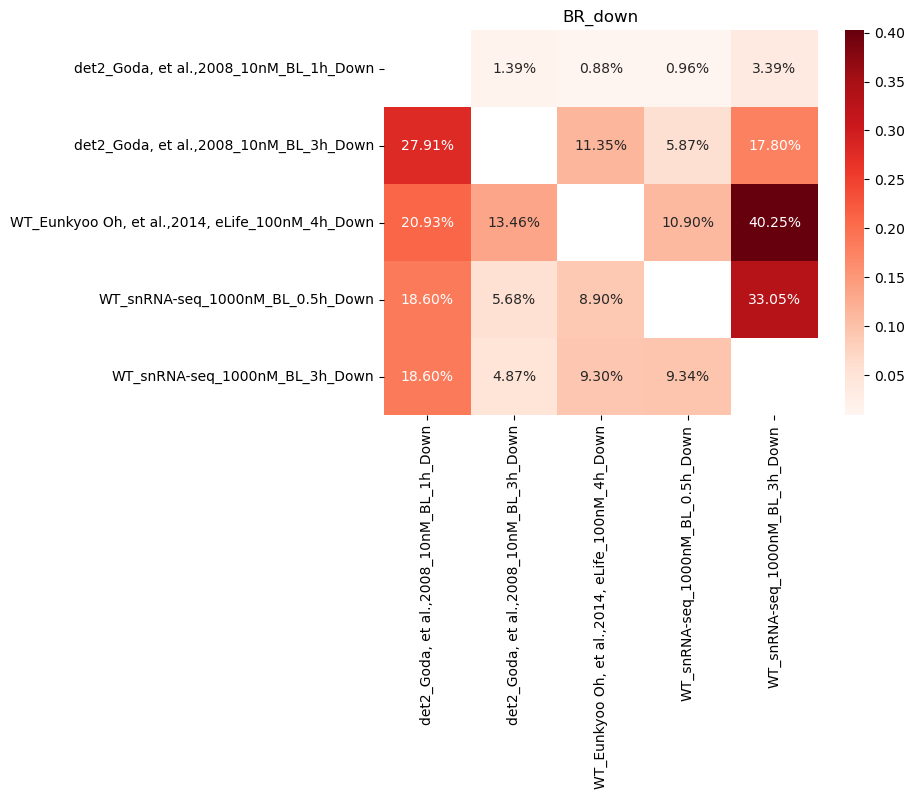

In [158]:
df = pd.read_excel('/public/home/lizw/home2/task/singlecell/singlecell_hormone/20240101/cpm_deg/compare_ONGOING/hormone_deg_collected.xlsx',
                  sheet_name='BR_down')
compare_qmod,overlap_matrix = comparedeg_qmod(df,'BR_down')

In [110]:
df

,"WT_Goda, et al.,2008_1μM_IAA_0.5h_Up","WT_Goda, et al.,2008_1μM_IAA_1h_Up","WT_Goda, et al.,2008_1μM_IAA_3h_Up","WT_Omelyanchuk NA, et al., 2017_1μM_IAA_6h_Up",Unnamed: 4,WT_snRNA-seq_5μM_IAA_0.5h_Up,WT_snRNA-seq_5μM_IAA_3h_Up
0,AT5G52900,AT2G23170,AT5G52900,AT4G27260,NaN,AT1G04240,AT1G07985
1,AT3G23030,AT3G23030,AT3G23030,AT4G37390,NaN,AT1G04250,AT1G08430
2,AT1G78100,AT1G70940,AT4G35720,AT1G30760,NaN,AT1G05700,AT1G09350
3,AT4G36110,AT1G15580,AT4G32280,AT5G54510,NaN,AT1G06160,AT1G10750
4,AT2G18010,AT5G54490,AT2G41230,AT4G30140,NaN,AT1G09090,AT1G11000
...,...,...,...,...,...,...,...
784,NaN,NaN,NaN,AT4G11140,NaN,NaN,NaN
785,NaN,NaN,NaN,AT3G28860,NaN,NaN,NaN
786,NaN,NaN,NaN,AT4G20020,NaN,NaN,NaN
787,NaN,NaN,NaN,AT3G02890,NaN,NaN,NaN


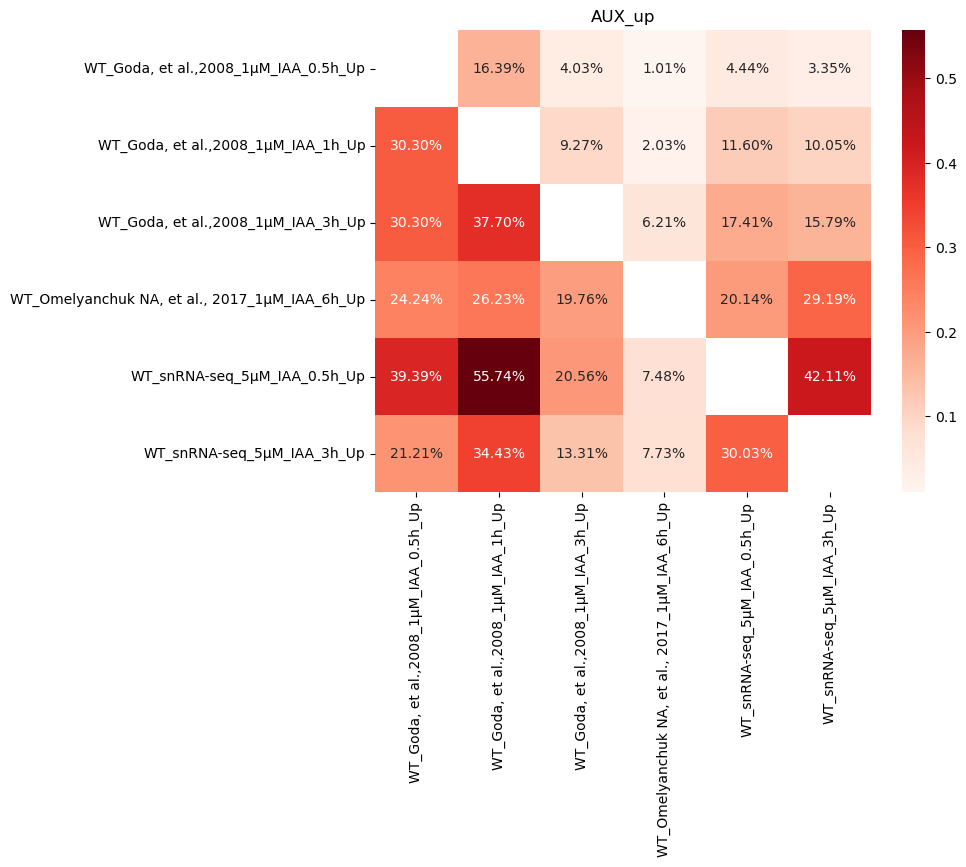

In [159]:
df = pd.read_excel('/public/home/lizw/home2/task/singlecell/singlecell_hormone/20240101/cpm_deg/compare_ONGOING/hormone_deg_collected.xlsx',
                  sheet_name='AUX_up')
compare_qmod,overlap_matrix = comparedeg_qmod(df,'AUX_up')

In [161]:
df

,"WT_Goda, et al.,2008_1μM_IAA_0.5h_Down","WT_Goda, et al.,2008_1μM_IAA_1h_Down","WT_Goda, et al.,2008_1μM_IAA_3h_Down","WT_Omelyanchuk NA, et al., 2017_1μM_IAA_6h_Down",WT_snRNA-seq_5μM_IAA_0.5h_Down,WT_snRNA-seq_5μM_IAA_3h_Down
0,AT4G38620,AT1G74840,AT5G60660,AT5G44020,AT1G07985,AT1G05660
1,AT1G78170,AT1G32980,AT4G39950,AT1G75750,AT1G08430,AT1G06160
2,AT2G04680,AT2G01950,AT4G12510,AT2G25450,AT1G09350,AT1G07440
3,AT5G14440,AT4G30000,AT3G19710,AT3G61430,AT1G10750,AT1G11700
4,AT1G67030,AT1G10480,AT1G74840,AT1G62660,AT1G11000,AT1G16400
...,...,...,...,...,...,...
654,NaN,NaN,NaN,AT4G21910,NaN,NaN
655,NaN,NaN,NaN,AT5G02230,NaN,NaN
656,NaN,NaN,NaN,AT1G11910,NaN,NaN
657,NaN,NaN,NaN,AT5G45510,NaN,NaN


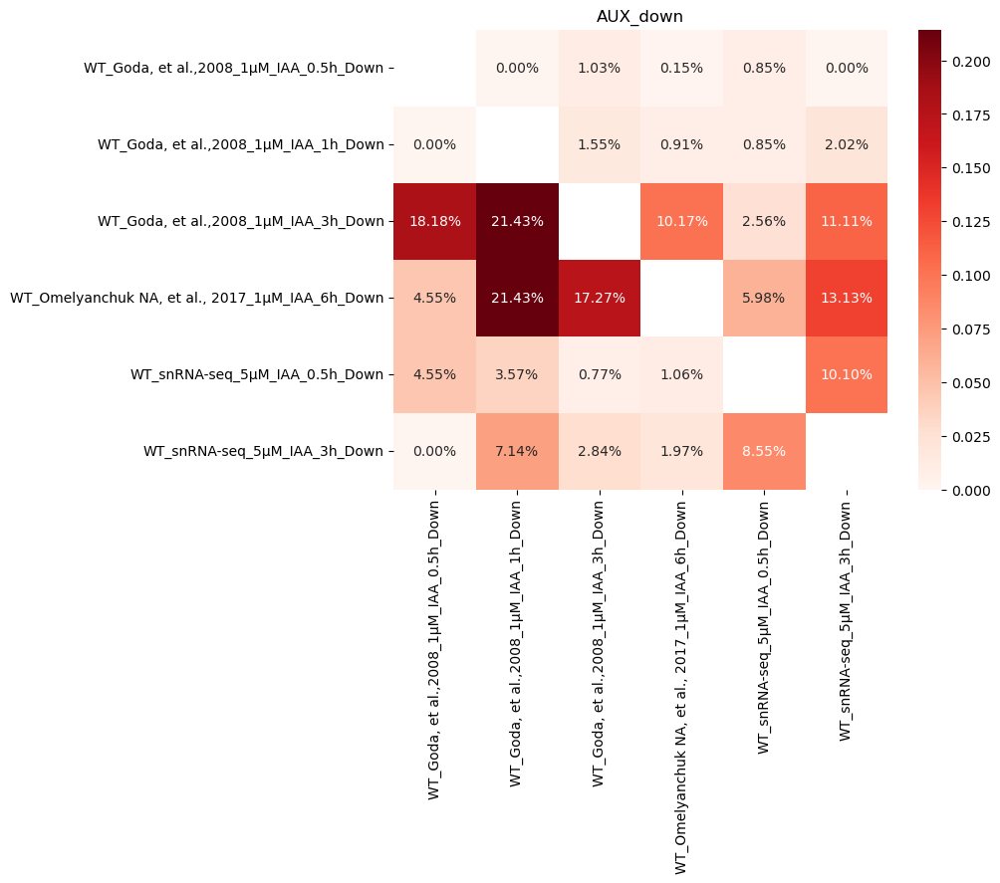

In [162]:
df = pd.read_excel('/public/home/lizw/home2/task/singlecell/singlecell_hormone/20240101/cpm_deg/compare_ONGOING/hormone_deg_collected.xlsx',
                  sheet_name='AUX_down')
compare_qmod,overlap_matrix = comparedeg_qmod(df,'AUX_down')

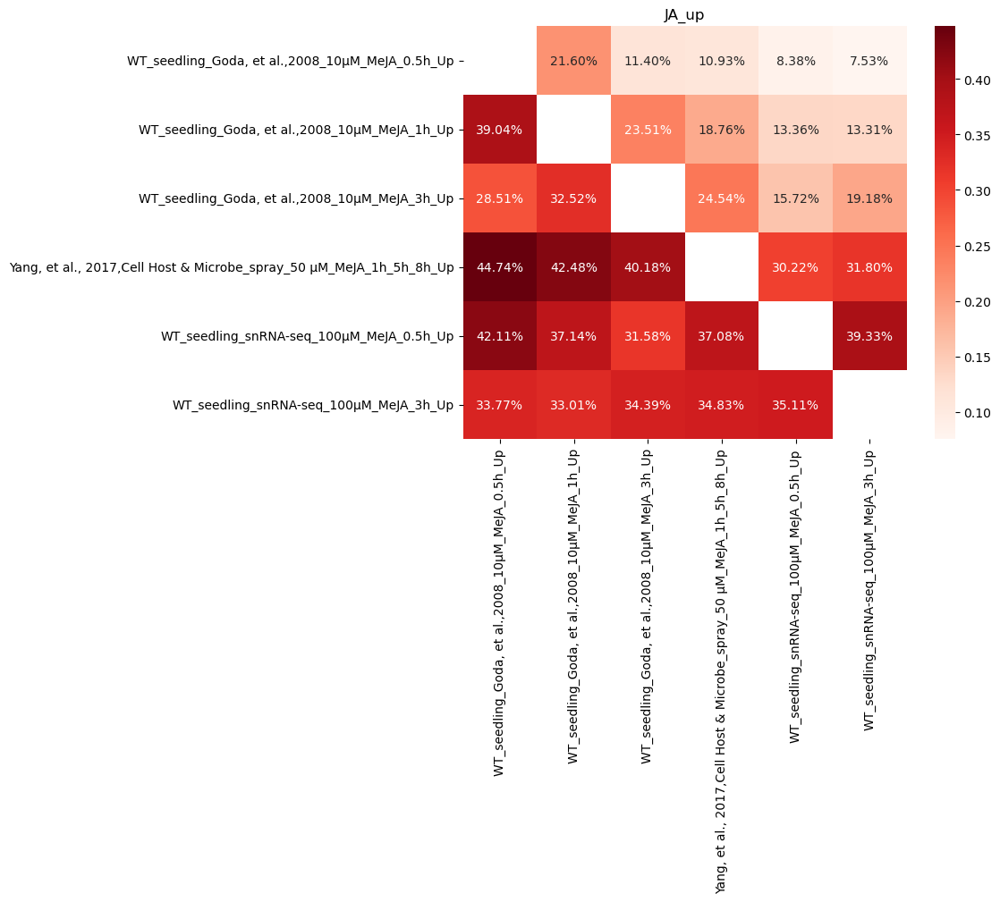

In [165]:
df = pd.read_excel('/public/home/lizw/home2/task/singlecell/singlecell_hormone/20240101/cpm_deg/compare_ONGOING/hormone_deg_collected.xlsx',
                  sheet_name='JA_up')
compare_qmod,overlap_matrix = comparedeg_qmod(df,'JA_up')

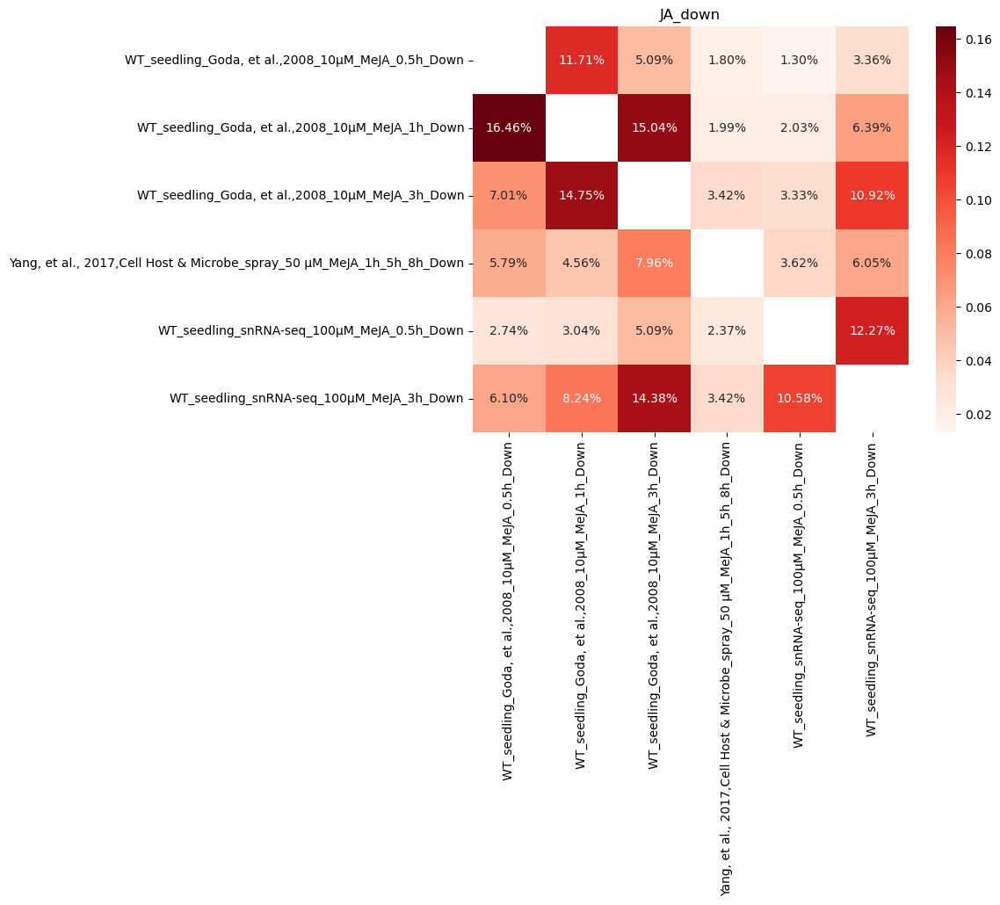

In [166]:
df = pd.read_excel('/public/home/lizw/home2/task/singlecell/singlecell_hormone/20240101/cpm_deg/compare_ONGOING/hormone_deg_collected.xlsx',
                  sheet_name='JA_down')
compare_qmod,overlap_matrix = comparedeg_qmod(df,'JA_down')

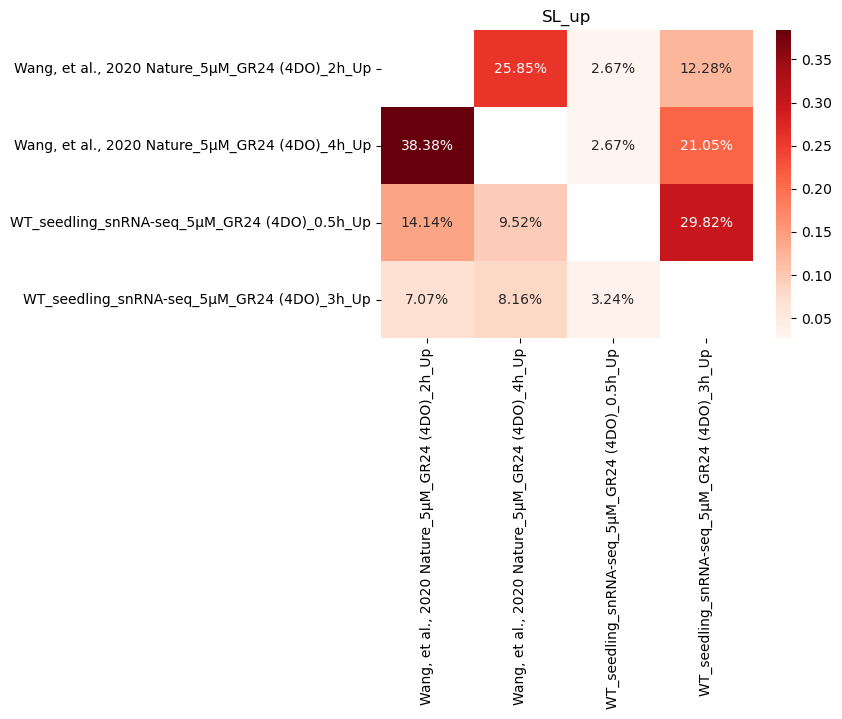

In [6]:
df = pd.read_excel('/public/home/lizw/home2/task/singlecell/singlecell_hormone/20240101/cpm_deg/compare_ONGOING/hormone_deg_collected.xlsx',
                  sheet_name='SL_up')
compare_qmod,overlap_matrix = comparedeg_qmod(df,'SL_up')

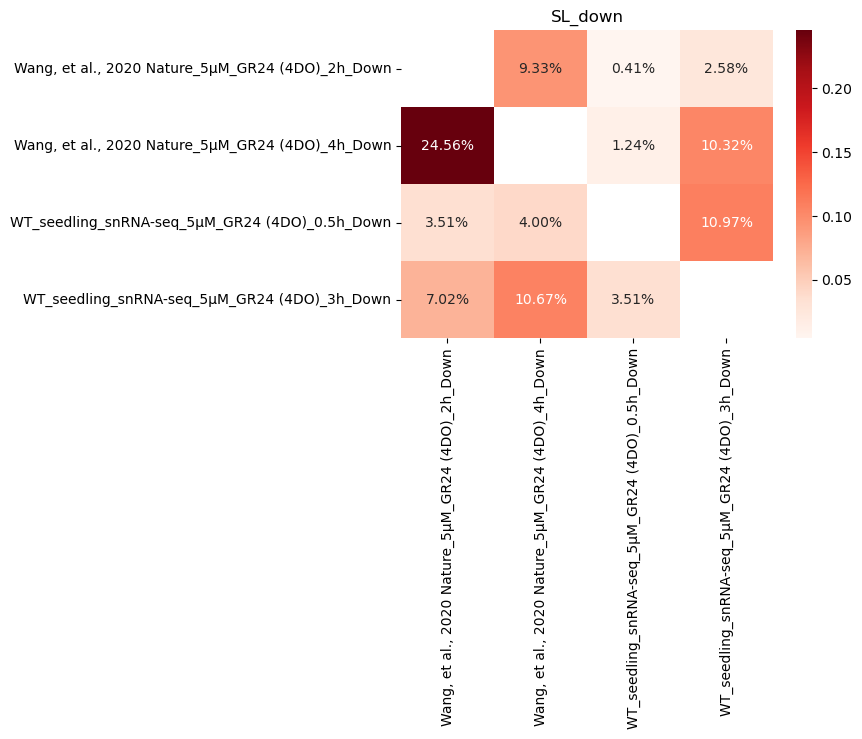

In [7]:
df = pd.read_excel('/public/home/lizw/home2/task/singlecell/singlecell_hormone/20240101/cpm_deg/compare_ONGOING/hormone_deg_collected.xlsx',
                  sheet_name='SL_down')
compare_qmod,overlap_matrix = comparedeg_qmod(df,'SL_down')

# redraw

In [ ]:
# only show the represetative ones

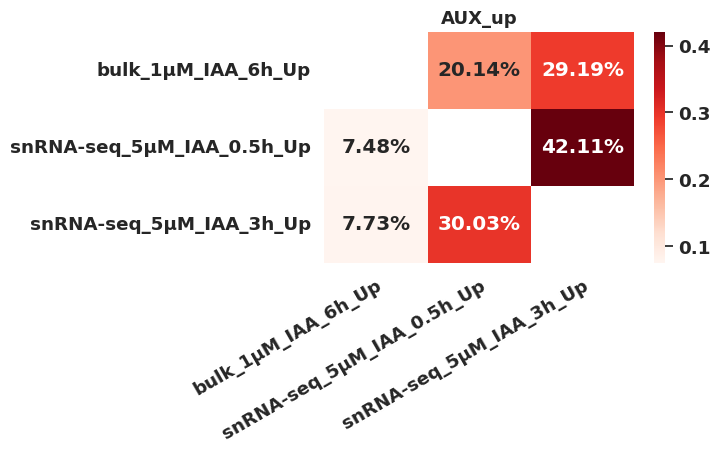

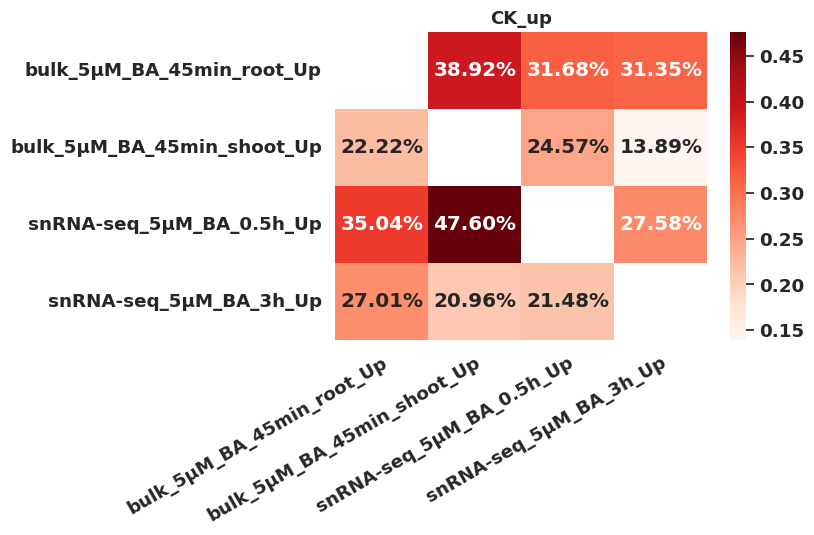

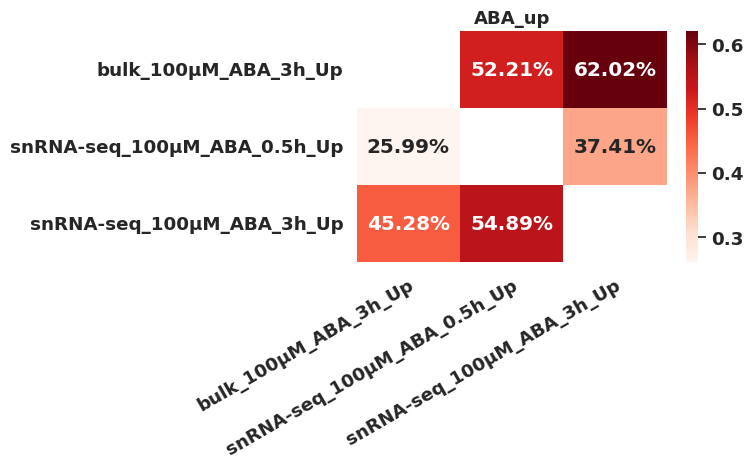

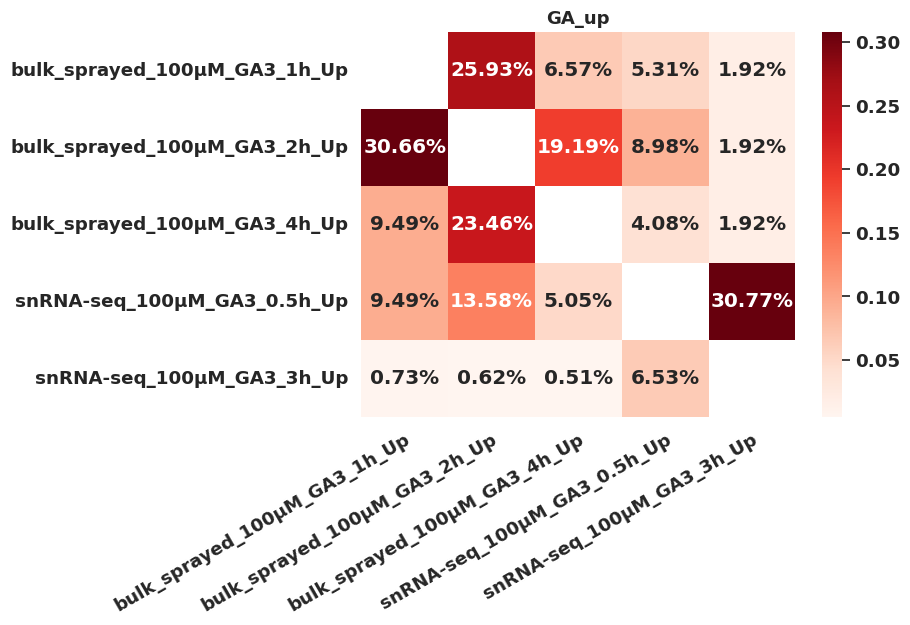

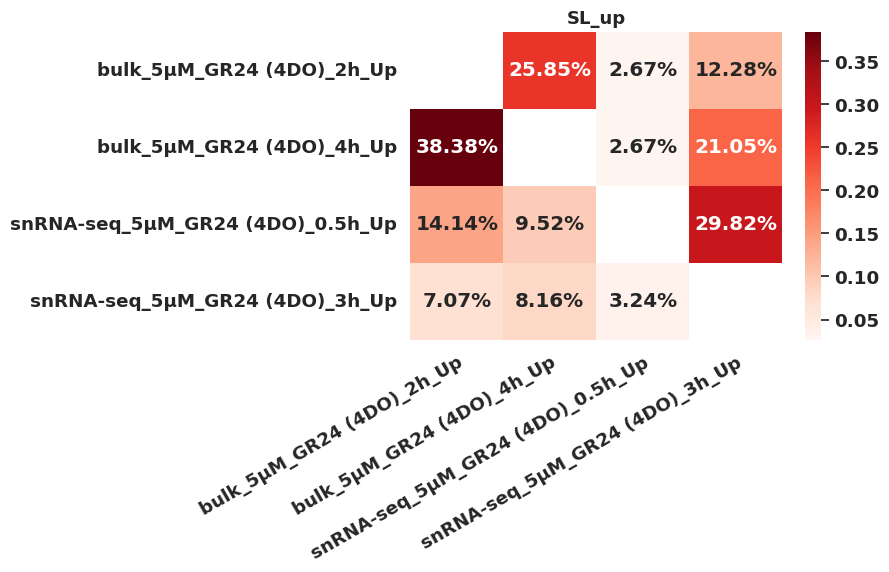

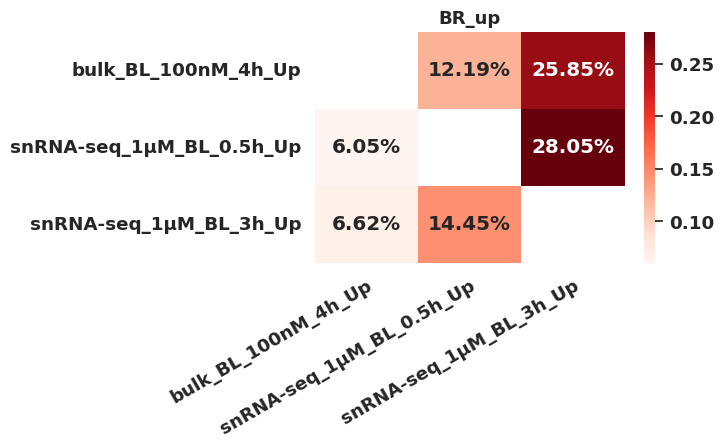

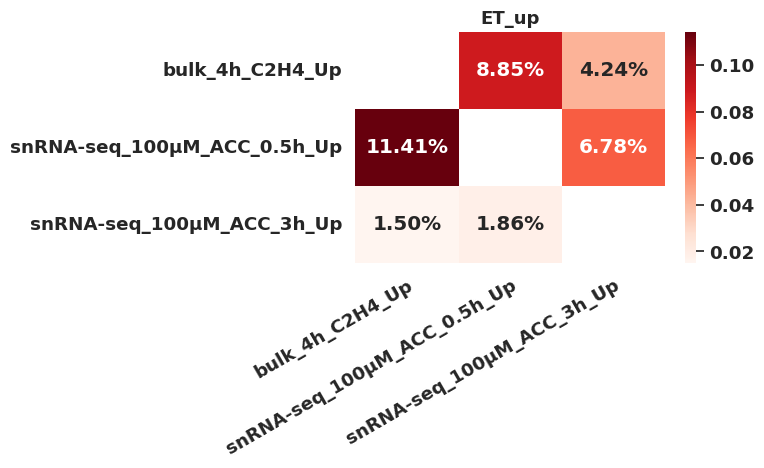

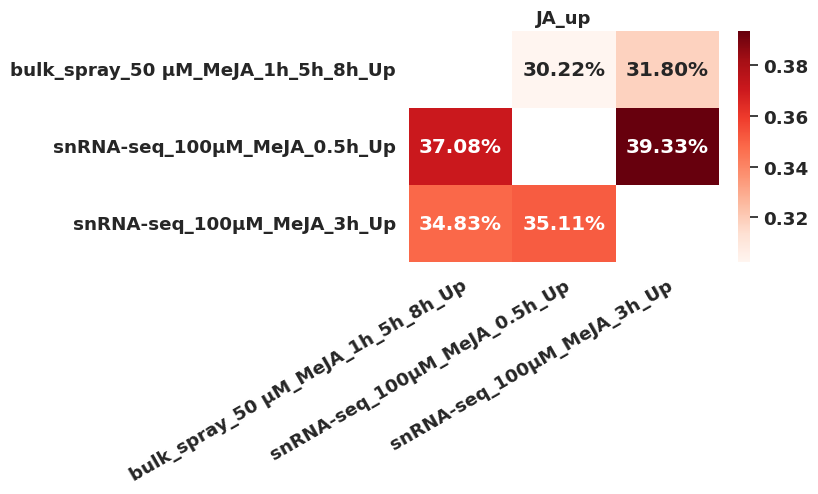

In [44]:
sns.set(font_scale=1.2,style='white',rc={'font.weight': 'bold'})
for x in ['AUX_up','CK_up','ABA_up','GA_up','SL_up','BR_up','ET_up','JA_up']:
    df = pd.read_excel('/public/home/lizw/home2/task/singlecell/singlecell_hormone/20240101/cpm_deg/compare_ONGOING/hormone_deg_collectedv2.xlsx',
                  sheet_name=x)
    compare_qmod,overlap_matrix = comparedeg_qmod(df,x,'Reds')

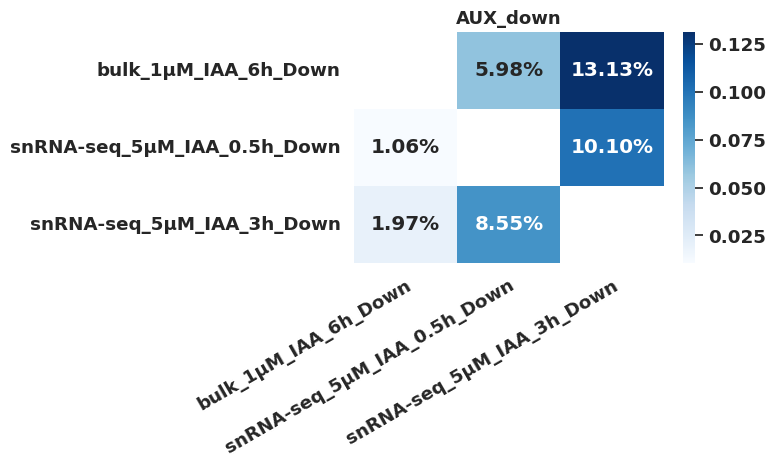

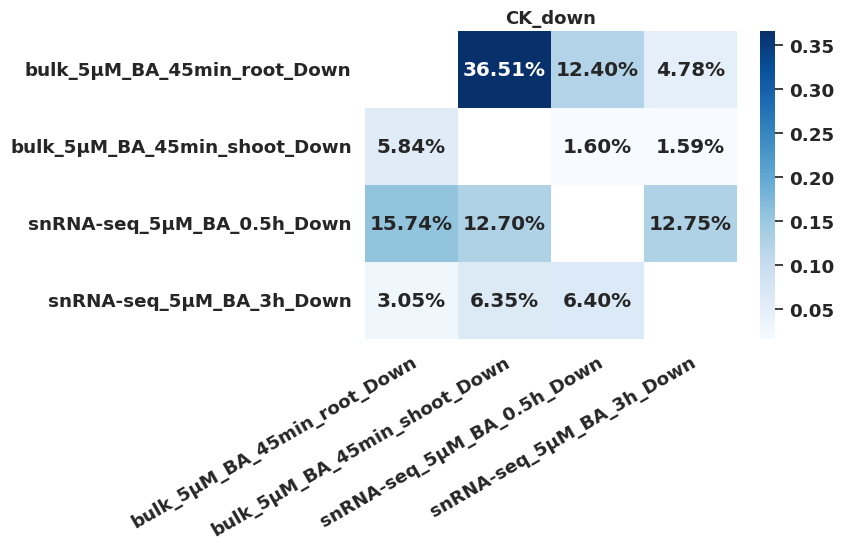

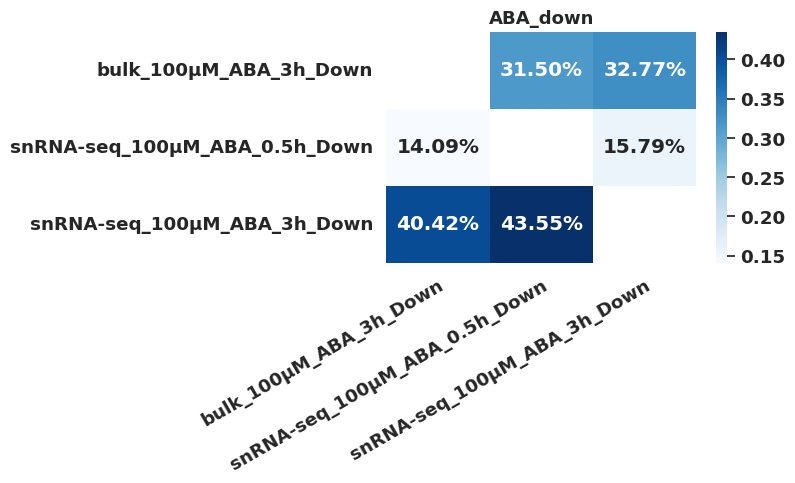

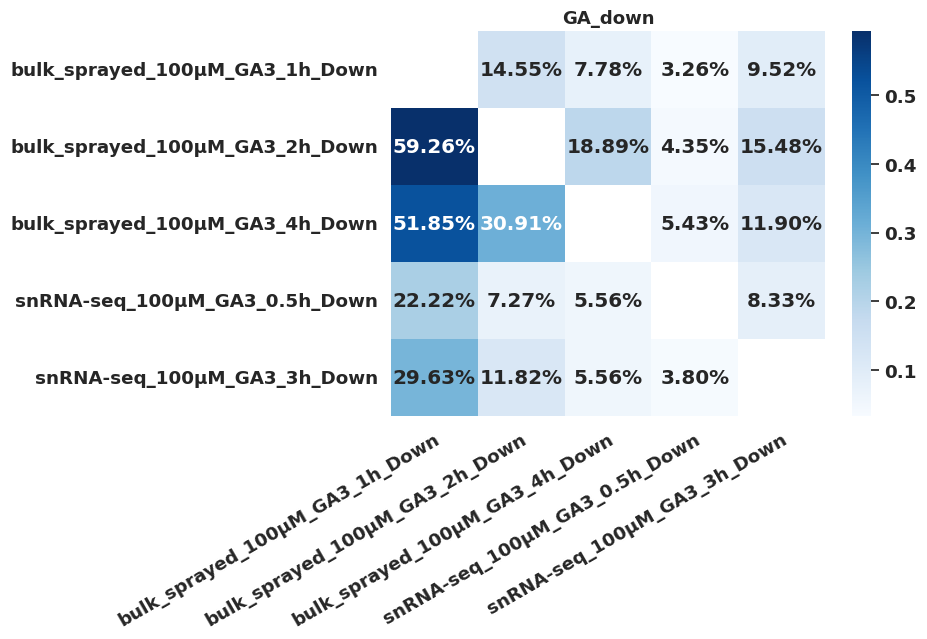

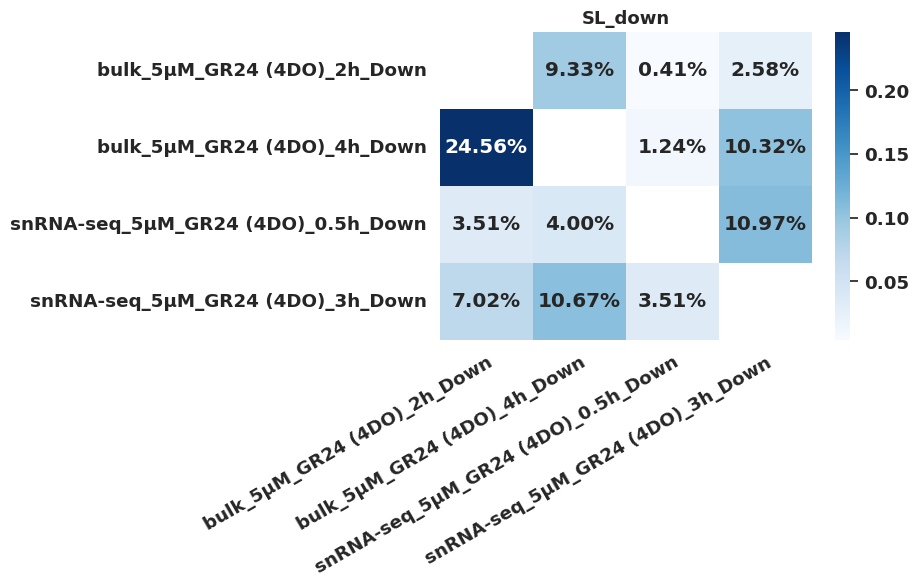

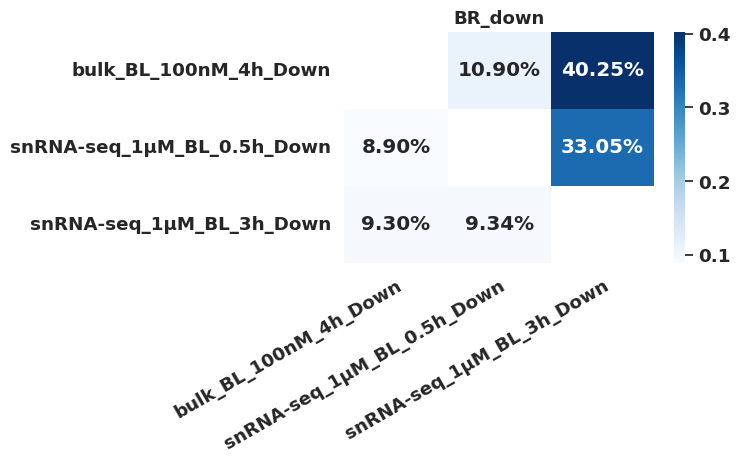

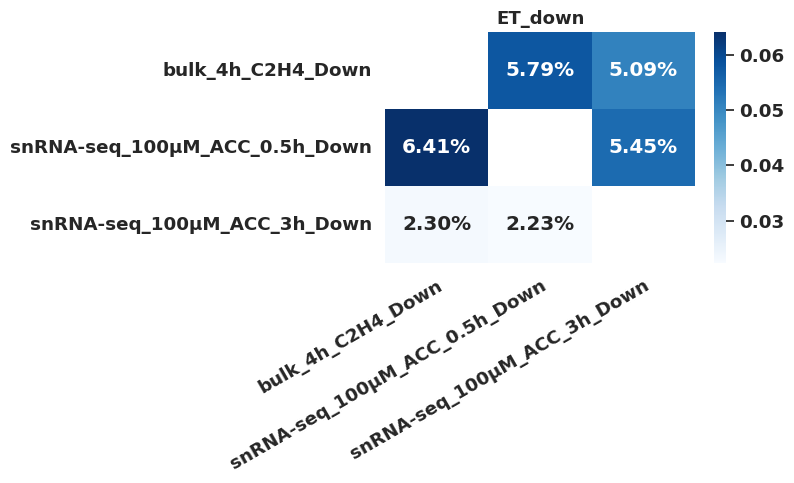

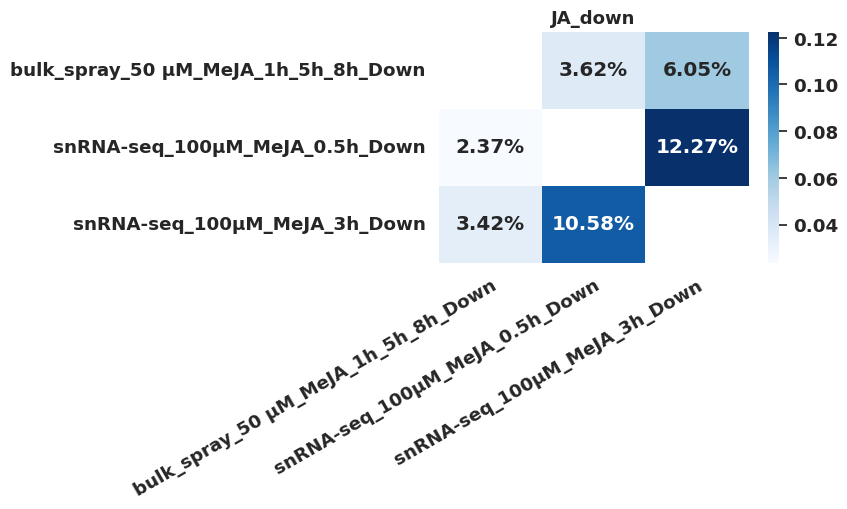

In [46]:
for x in ['AUX_down','CK_down','ABA_down','GA_down','SL_down','BR_down','ET_down','JA_down']:
    df = pd.read_excel('/public/home/lizw/home2/task/singlecell/singlecell_hormone/20240101/cpm_deg/compare_ONGOING/hormone_deg_collectedv2.xlsx',
                  sheet_name=x)
    compare_qmod,overlap_matrix = comparedeg_qmod(df,x,'Blues')

# compared with published single cell data

In [ ]:
import scanpy as sc
import pandas as pd

In [49]:
# ad = sc.read_h5ad('/public/home/lizw/home2/task/singlecell/singlecell_hormone/20240101/ad_after_sub_1227_v3.h5ad')
# ad.obs['sample_cluster'] = ad.obs['Sample'].astype('str') + '.' +ad.obs['anno_v3_cluster'].astype('str')
# ad.write_h5ad('/public/home/lizw/home2/task/singlecell/singlecell_hormone/20240101/ad_after_sub_1227_v3.h5ad')
# ourdeg = ad.uns['df_degRes']
# cluster_celltype_dict = dict(zip(ad.obs['Cluster_final'],ad.obs['anno_v3_cluster']))
# ourdeg['cluster_celltype'] = ourdeg['Cluster'].map(cluster_celltype_dict)

# condition_up = (ourdeg['logFC'] >= 1) & (ourdeg['fdr'] < 0.05)
# condition_down = (ourdeg['logFC'] <= -1) & (ourdeg['fdr'] < 0.05)
# ourdeg['DEG'] = np.where(condition_up, 'Up', np.where(condition_down, 'Down', 'Fail'))

# ourdeg.to_csv('/public/home/lizw/home2/task/singlecell/singlecell_hormone/20240101/cpm_deg/celltype_deg/raw_cluster_deg.csv')
#ourdeg.query('DEG != "Fail"').to_csv('/public/home/lizw/home2/task/singlecell/singlecell_hormone/20240101/cpm_deg/celltype_deg/filtered_cluster_deg.csv')

In [ ]:
ourdeg.

In [284]:
ourdeg['cluster_celltype']

0          0,0_Atrichoblast (Maturation)
1          0,0_Atrichoblast (Maturation)
2          0,0_Atrichoblast (Maturation)
3          0,0_Atrichoblast (Maturation)
4          0,0_Atrichoblast (Maturation)
                       ...              
4300041                       35_Unknown
4300042                       35_Unknown
4300043                       35_Unknown
4300044                       35_Unknown
4300045                       35_Unknown
Name: cluster_celltype, Length: 4300046, dtype: object

In [103]:
our_deg_br05_up = ourdeg.query('DEG != "Fail"').query('(b == "BR_05h") & (DEG == "Up")')
our_deg_br05_down = ourdeg.query('DEG != "Fail"').query('(b == "BR_05h") & (DEG == "Down")')
our_deg_br3_up = ourdeg.query('DEG != "Fail"').query('(b == "BR_3h") & (DEG == "Up")')
our_deg_br3_down = ourdeg.query('DEG != "Fail"').query('(b == "BR_3h") & (DEG == "Down")')

In [277]:
our_deg_br05_up_dict = our_deg_br05_up.groupby('cluster_celltype')['index'].apply(list).to_dict()
our_deg_br05_down_dict = our_deg_br05_down.groupby('cluster_celltype')['index'].apply(list).to_dict()
our_deg_br3_up_dict = our_deg_br3_up.groupby('cluster_celltype')['index'].apply(list).to_dict()
our_deg_br3_down_dict = our_deg_br3_down.groupby('cluster_celltype')['index'].apply(list).to_dict()

In [109]:
br_deg = pd.read_csv('/public/home/lizw/home2/task/singlecell/singlecell_hormone/20240101/cpm_deg/celltype_deg/Data_S3_BL2hour_vs_BRZ.csv')
br_deg_up = br_deg.query('up_dn_label == "Up"')
br_deg_up_dict = br_deg_up.groupby('cluster_id')['gene'].apply(list).to_dict()

In [ ]:
anno_v3 = pd.read_table('/public/home/lizw/home2/task/singlecell/singlecell_hormone/20240101/annotaion_20240101_v3.tsv')
cluster_order = list(anno_v3['Cluster']+'_'+anno_v3['Celltype'])

In [268]:
def comparedeg_jaccard(dict1,dict2,cmap,label,column_order,index_order):
    compare_jaccard = pd.DataFrame(columns = dict1.keys(),index = dict2.keys())
    overlap_matrix = pd.DataFrame(columns = dict1.keys() ,index = dict2.keys())
    for i in dict1.keys():
        for j in dict2.keys():
            deg_set1 = set(dict1[i])
            deg_set2 = set(dict2[j])
            jaccard =  len(deg_set1& deg_set2)/len(deg_set1|deg_set2)
            overlap = deg_set1& deg_set2
            compare_jaccard.loc[j,i] = jaccard
            overlap_matrix.loc[j,i] = overlap
    
    #ax = sns.heatmap(compare_qmod.astype('float'),cmap=cmap, fmt=".2%",#annot=compare_qmod,cbar_kws = dict(use_gridspec=False,location="right"),)
    compare_jaccard = compare_jaccard.reindex(index_order)
    compare_jaccard = compare_jaccard.reindex(column_order,axis=1)
    plt.figure(figsize=(len(compare_jaccard.columns)*0.5+2,len(compare_jaccard.index)*0.5))
    plt.title(label,fontweight="bold",fontdict = {'fontsize': 13,'fontweight' : 'bold'})
    ax = sns.heatmap(compare_jaccard.astype('float'),cmap=cmap,cbar_kws = dict(use_gridspec=False,location="right"),)
    plt.setp(ax.get_xticklabels(), rotation=30, ha="right", rotation_mode="anchor")
    
    return compare_jaccard,overlap_matrix

In [263]:
def comparedeg_qmod(dict1,dict2,cmap,label,column_order,index_order):
    compare_qmod = pd.DataFrame(columns = dict1.keys(),index = dict2.keys())
    overlap_matrix = pd.DataFrame(columns = dict1.keys() ,index = dict2.keys())
    for i in dict1.keys():
        for j in dict2.keys():
            deg_set1 = set(dict1[i])
            deg_set2 = set(dict2[j])
            qmod =  len(deg_set1& deg_set2)/len(deg_set2)
            overlap = deg_set1& deg_set2
            compare_qmod.loc[j,i] = qmod
            overlap_matrix.loc[j,i] = overlap
    
    #ax = sns.heatmap(compare_qmod.astype('float'),cmap=cmap, fmt=".2%",#annot=compare_qmod,cbar_kws = dict(use_gridspec=False,location="right"),)
    compare_qmod = compare_qmod.reindex(index_order)
    compare_qmod = compare_qmod.reindex(column_order,axis=1)
    plt.figure(figsize=(len(compare_qmod.columns)*0.5+2,len(compare_qmod.index)*0.5))
    plt.title(label,fontweight="bold",fontdict = {'fontsize': 13,'fontweight' : 'bold'})
    ax = sns.heatmap(compare_qmod.astype('float'),cmap=cmap,cbar_kws = dict(use_gridspec=False,location="right"),)
    plt.setp(ax.get_xticklabels(), rotation=30, ha="right", rotation_mode="anchor")
    
    return compare_qmod,overlap_matrix

In [285]:
big_celltype_dict = {'0,0_Atrichoblast (Maturation)':'Root Epidermal',
'31_Trichoblast (Maturation)':'Root Epidermal',
'32_Root Cap':'Root Cap'
'19_Root Cortex And Endodermis (Meristem)':'Cortex And Endodermis',
'17,2_Root Cortex (Elongation)':'Cortex And Endodermis',
 '0,1_Root Cortex (Maturation)':'Cortex And Endodermis',
'16_Root  Endodermis  (Suberization) (Elongation)':'Cortex And Endodermis',
 '21_Root Endodermis  (Suberization) (Maturation)':'Cortex And Endodermis',
 '26_Root Endodermis  (Suberization) (Maturation)':'Cortex And Endodermis',
 '27_Root Endodermis (Casparian Strip) (Maturation)':'Cortex And Endodermis',
'11_Phleom Pole Pericycle':'Pericycle',
'7_Xylem Pole Pericycle':'Pericycle',
'22_Procambium and Immature Phleom':'Procambium',
 '33_Phleom (Sieve Element)':'Phloem',
 '9_Phleom (Companion cell)':'Phloem',
 '24_Phleom (Companion cell)':'Phloem',
'10_Procambium and Immature Xylem':'Procambium',
'29_Xylem':'Xylem
'15_Proliferating Cell (G1 and S Phase)':'Proliferating Cell',
'18_Proliferating Cell (G2 Phase)':'Proliferating Cell',
'20_Proliferating Cell (M Phase)':'Proliferating Cell'}

SyntaxError: invalid syntax (132811088.py, line 4)

In [ ]:
big_celltype_br2h_dict = {
     'Proximal Lateral Root Cap',:'Root Cap',
    'Distal Lateral Root Cap','Root Cap',
     'Proliferation Domain_Atrichoblast':'Root Epidermal',
    'Transition Domain_Atrichoblast':'Root Epidermal',
     'Elongation_Atrichoblast':'Root Epidermal',
    'Maturation_Atrichoblast':'Root Epidermal',
      'Proliferation Domain_Trichoblast':'Root Epidermal',
    'Transition Domain_Trichoblast':'Root Epidermal',
     'Elongation_Trichoblast':'Root Epidermal',
    'Maturation_Trichoblast':'Root Epidermal',
      'Proliferation Domain_Cortex':'Cortex And Endodermis',
    'Transition Domain_Cortex':'Cortex And Endodermis',
     'Elongation_Cortex':'Cortex And Endodermis',
    'Maturation_Cortex':'Cortex And Endodermis',
       'Proliferation Domain_Endodermis':'Cortex And Endodermis',
     'Elongation_Endodermis':'Cortex And Endodermis',
    'Maturation_Endodermis':'Cortex And Endodermis',
     'Elongation_Procambium':'Procambium',
    'Maturation_Procambium':'Procambium',
      'Proliferation Domain_Pericycle':'Pericycle',
    'Transition Domain_Pericycle':'Pericycle',
     'Elongation_Pericycle':'Pericycle',
    'Maturation_Pericycle':'Pericycle',
      'Transition Domain_Phloem':'Phloem',
     'Elongation_Phloem':'Phloem',
    'Maturation_Phloem':'Phloem',
     'Elongation_Xylem':'Xylem',
    'Maturation_Xylem':'Xylem',
    }

In [271]:
cluster_order = ['5_Shoot Apical Meristem, Endodermis, Cortex',
 '2_Shoot Epidermal Cell',
 '14_Shoot Epidermal Cell',
 '25_Guard Cell',
 '28_Guard Cell',
 '1_Mesophyll Cell',
 '3_Mesophyll Cell',
 '4_Mesophyll Cell',
 '8_Mesophyll Cell',
 '6_Root Apical Meristem',
 '17,0_Root Epidermal Cell (Meristem)',
 '17,1_Root Epidermal Cell (Elongation)',
 '0,0_Atrichoblast (Maturation)',
 '31_Trichoblast (Maturation)',
 '32_Root Cap',
 '19_Root Cortex And Endodermis (Meristem)',
 '17,2_Root Cortex (Elongation)',
 '0,1_Root Cortex (Maturation)',
 '16_Root  Endodermis  (Suberization) (Elongation)',
 '21_Root Endodermis  (Suberization) (Maturation)',
 '26_Root Endodermis  (Suberization) (Maturation)',
 '27_Root Endodermis (Casparian Strip) (Maturation)',
 '11_Phleom Pole Pericycle',
 '7_Xylem Pole Pericycle',
 '22_Procambium and Immature Phleom',
 '33_Phleom (Sieve Element)',
 '9_Phleom (Companion cell)',
 '24_Phleom (Companion cell)',
 '10_Procambium and Immature Xylem',
 '29_Xylem',
 '15_Proliferating Cell (G1 and S Phase)',
 '18_Proliferating Cell (G2 Phase)',
 '20_Proliferating Cell (M Phase)',]

In [264]:
br2h_order = ['Proximal Columella','Distal Columella',
             'Proximal Lateral Root Cap','Distal Lateral Root Cap',
             'Proliferation Domain_Atrichoblast','Transition Domain_Atrichoblast',
             'Elongation_Atrichoblast','Maturation_Atrichoblast',
              'Proliferation Domain_Trichoblast','Transition Domain_Trichoblast',
             'Elongation_Trichoblast','Maturation_Trichoblast',
              'Proliferation Domain_Cortex','Transition Domain_Cortex',
             'Elongation_Cortex','Maturation_Cortex',
               'Proliferation Domain_Endodermis',
             'Elongation_Endodermis','Maturation_Endodermis',
             'Elongation_Procambium','Maturation_Procambium',
              'Proliferation Domain_Pericycle','Transition Domain_Pericycle',
             'Elongation_Pericycle','Maturation_Pericycle',
              'Transition Domain_Phloem',
             'Elongation_Phloem','Maturation_Phloem',
             'Elongation_Xylem','Maturation_Xylem',
             ]

In [ ]:
br_deg_up_dict.keys()

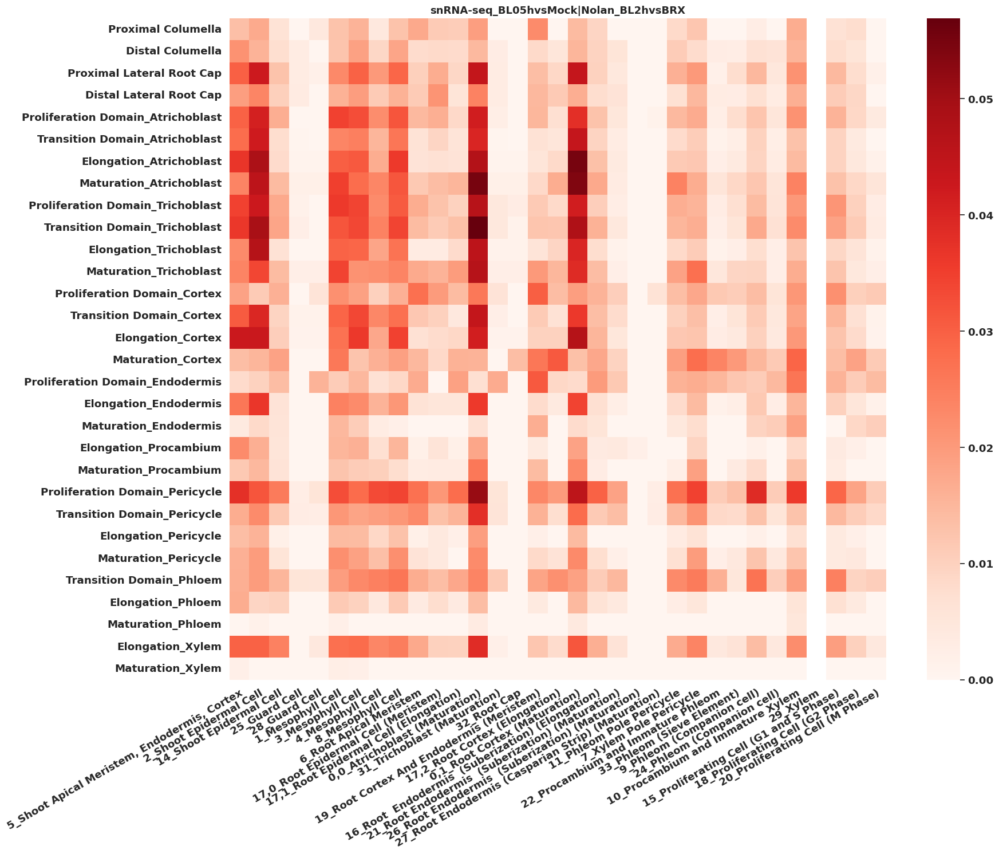

In [272]:
compare_jaccard,overlap_matrix = comparedeg_jaccard(our_deg_br05_up_dict,br_deg_up_dict,'Reds',
                                              'snRNA-seq_BL05hvsMock|Nolan_BL2hvsBRX',
                                             column_order = cluster_order,
                                             index_order = br2h_order)

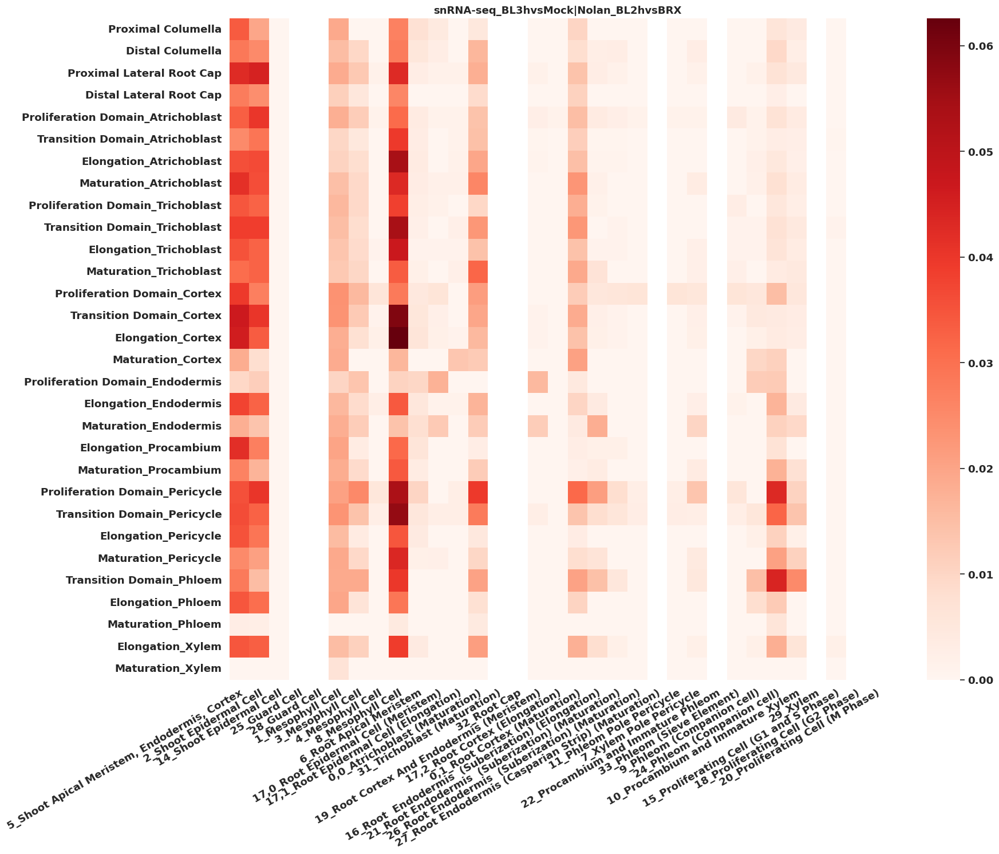

In [279]:
compare_jaccard,overlap_matrix = comparedeg_jaccard(our_deg_br3_up_dict,br_deg_up_dict,'Reds',
                                              'snRNA-seq_BL3hvsMock|Nolan_BL2hvsBRX',
                                             column_order = cluster_order,
                                             index_order = br2h_order)

In [266]:
cluster_order_root = ['6_Root Apical Meristem',
 '17,0_Root Epidermal Cell (Meristem)',
 '17,1_Root Epidermal Cell (Elongation)',
 '0,0_Atrichoblast (Maturation)',
 '31_Trichoblast (Maturation)',
 '32_Root Cap',
 '19_Root Cortex And Endodermis (Meristem)',
 '17,2_Root Cortex (Elongation)',
 '0,1_Root Cortex (Maturation)',
 '16_Root  Endodermis  (Suberization) (Elongation)',
 '21_Root Endodermis  (Suberization) (Maturation)',
 '26_Root Endodermis  (Suberization) (Maturation)',
 '27_Root Endodermis (Casparian Strip) (Maturation)',
 '11_Phleom Pole Pericycle',
 '7_Xylem Pole Pericycle',
 '22_Procambium and Immature Phleom',
 '33_Phleom (Sieve Element)',
 '9_Phleom (Companion cell)',
 '24_Phleom (Companion cell)',
 '10_Procambium and Immature Xylem',
 '29_Xylem',
 '15_Proliferating Cell (G1 and S Phase)',
 '18_Proliferating Cell (G2 Phase)',
 '20_Proliferating Cell (M Phase)',]

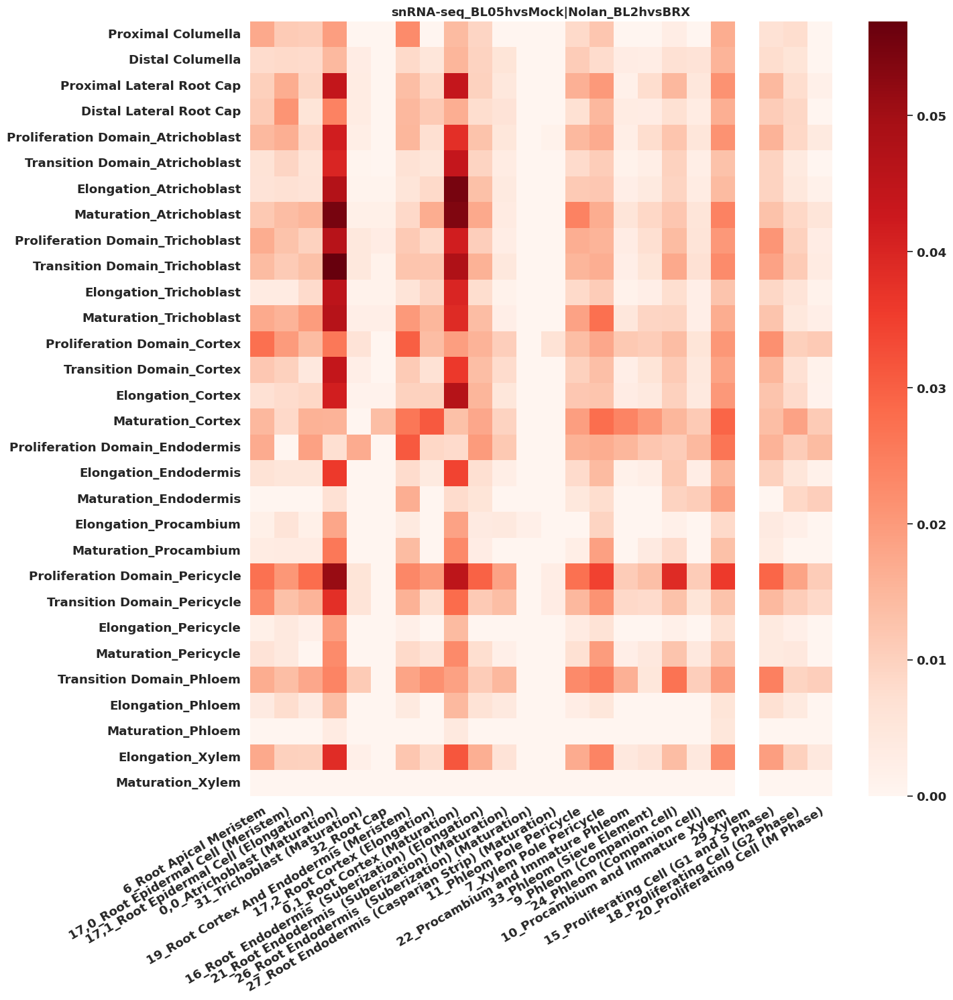

In [273]:
compare_jaccard,overlap_matrix = comparedeg_jaccard(our_deg_br05_up_dict,br_deg_up_dict,'Reds',
                                              'snRNA-seq_BL05hvsMock|Nolan_BL2hvsBRX',
                                             column_order = cluster_order_root,
                                             index_order = br2h_order)

In [184]:
anno_v3 = pd.read_table('/public/home/lizw/home2/task/singlecell/singlecell_hormone/20240101/annotaion_20240101_v3.tsv')
cluster_order = list(anno_v3['Cluster']+'_'+anno_v3['Celltype'])

# bigger celltype cluster 

#  IAA elongation epidermal response explore

In [55]:
import pandas as pd

In [56]:
ourdeg = pd.read_csv('/public/home/lizw/home2/task/singlecell/singlecell_hormone/20240101/cpm_deg/celltype_deg/filtered_cluster_deg.csv')

In [57]:
geneid_name_df = pd.read_csv('/public/home/lizw/home2/task/singlecell/singlecell_hormone/REF/gene_ID_name_v3.csv')

In [58]:
geneid_name_dict = dict(zip(geneid_name_df['GeneID'],geneid_name_df['GeneID_name']))

In [59]:
ourdeg['genename'] = ourdeg['index'].map(geneid_name_dict )

In [60]:
ourdeg = ourdeg.drop('Unnamed: 0',axis=1)

In [61]:
ourdeg = ourdeg[~ourdeg['index'].str.contains('ATC|ATM')]

In [62]:
ourdeg = ourdeg[~ourdeg['Cluster'].isin(['34','35'])]

In [63]:
ourdeg = ourdeg.rename({'index':'gene','a':'Mock','b':'Treat'},axis=1)

In [64]:
ourdeg.to_csv('/public/home/lizw/home2/task/singlecell/singlecell_hormone/20240101/cpm_deg/celltype_deg/Final_filtered_cluster_deg.csv')

In [65]:
cluster_range_dict = ourdeg.query('Treat == "AUX_05h" & (DEG == "Up")').groupby('gene')['cluster_celltype'].apply(set).to_dict()
cluster_range_df = pd.DataFrame(index = cluster_range_dict.keys(),columns=['clusterdict'])
cluster_range_df = pd.DataFrame(index = cluster_range_dict.keys(),columns=['clusterdict'])
cluster_range_df['clusterdict'] = cluster_range_dict.values()
cluster_range_df['clusterdict'] = cluster_range_df['clusterdict'].apply(lambda x: ', '.join(sorted(list(x))))

In [66]:
ourdegauxin05h = ourdeg.query('(Treat == "AUX_05h") & (DEG == "Up")')

In [67]:
ourdegauxin05h['clusterrange'] =ourdegauxin05h['gene'].map(dict(zip(cluster_range_df.index,cluster_range_df['clusterdict'])))

/tmp/ipykernel_157982/3560213458.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ourdegauxin05h['clusterrange'] =ourdegauxin05h['gene'].map(dict(zip(cluster_range_df.index,cluster_range_df['clusterdict'])))


In [68]:
ourdegauxin05h.to_csv('/public/home/lizw/home2/task/singlecell/singlecell_hormone/20240101/cpm_deg/celltype_deg/Final_auxin05hUP.csv')

In [69]:
cluster17_2 = set(list(ourdegauxin05h.query('Cluster == "17,2"')['gene']))
cluster17_1 = set(list(ourdegauxin05h.query('Cluster == "17,1"')['gene']))

In [70]:
cluster17_1_2 = cluster17_2 & cluster17_1

In [71]:
overlap_cluster_count_dist = ourdegauxin05h.query('gene in @cluster17_1_2').groupby('gene')['Cluster'].count()

In [72]:
cluster17_1_count_dist = ourdegauxin05h.query('gene in @cluster17_1').groupby('gene')['Cluster'].count()

In [73]:
len(cluster17_1_count_dist)

260

In [74]:
len(cluster17_1_count_dist[cluster17_1_count_dist>5])

31

In [75]:
len(overlap_cluster_count_dist)

60

In [76]:
len(overlap_cluster_count_dist[overlap_cluster_count_dist>5])

26

In [77]:
from matplotlib_venn import venn2, venn3

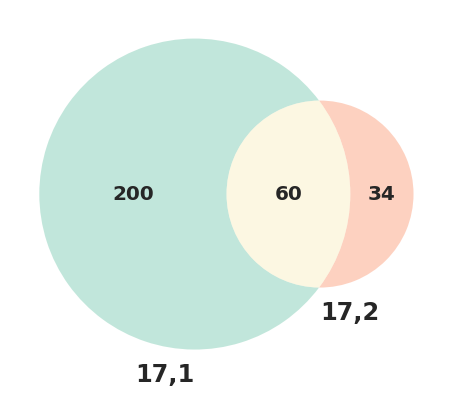

In [80]:
venn2([cluster17_1,cluster17_2],set_labels=('17,1','17,2'),set_colors=('#66c2a5','#fc8d62','#4a98c9'))

In [94]:
df_elongaton_05hauxinup = pd.DataFrame(columns=['17,1','17,2','Overlap'])

## cpm explore

In [7]:
import pandas as pd
ourdeg_05h_auxin_elongation_epi_up = pd.read_csv('/public/home/lizw/home2/task/singlecell/singlecell_hormone/20240101/iaa_explore/auxin_05h_up_cluster17,1.csv')

In [8]:
import scanpy as sc

In [9]:
cpm_df = sc.read_h5ad('/public/home/lizw/home2/task/singlecell/singlecell_hormone/20240101/cpm_deg/groupby_sample/All_leiden_mergei_cpm_sample_cluster.h5ad')

In [10]:
cpm_df.obs['sample'] = cpm_df.obs['sample_cluster'].str.split('.').str[0]

In [11]:
auxin_allcluster_05h = cpm_df[cpm_df.obs['sample'].isin(["Mock_05h","AUX_05h"])].to_df().reindex(list(ourdeg_05h_auxin_elongation_epi_up['index']),axis=1)

In [12]:
auxin_allcluster_05h = auxin_allcluster_05h.drop(['AUX_05h.34_Unknown','AUX_05h.35_Unknown','Mock_05h.34_Unknown','Mock_05h.35_Unknown'])

In [13]:
cluster17_2_iaa05_up_genelist = list(ourdeg_05h_auxin_elongation_epi_up['index'])

In [14]:
cluster_range_dict = ourdeg.query('(index in @cluster17_2_iaa05_up_genelist) & (b == "AUX_05h")').groupby('index')['cluster_celltype'].apply(set).to_dict()

In [18]:
ourdeg_05h_auxin_elongation_epi_up['clusterrange'] =ourdeg_05h_auxin_elongation_epi_up['index'].map(dict(zip(cluster_range_df.index,cluster_range_df['clusterdict'])))

In [21]:
ourdeg_05h_auxin_elongation_epi_up

,Unnamed: 0.1,Unnamed: 0,index,logFC,logCPM,LR,PValue,fdr,a,b,Cluster,Time,cluster_celltype,DEG,genename,clusterrange
0,113180,3353700,AT1G02360,2.498117,8.138193,15.655914,7.597463e-05,1.857205e-03,Mock_05h,AUX_05h,"17,1",0.5h,"17,1_Root Epidermal Cell (Elongation)",Up,AT1G02360,"17,1_Root Epidermal Cell (Elongation)"
1,113181,3353701,AT1G02400,1.853289,9.159356,16.530424,4.787570e-05,1.280103e-03,Mock_05h,AUX_05h,"17,1",0.5h,"17,1_Root Epidermal Cell (Elongation)",Up,GA2OX6,"12_Unknown , 17,1_Root Epidermal Cell (Elongat..."
2,113182,3353718,AT1G03220,4.742525,6.982372,7.720968,5.458314e-03,4.811968e-02,Mock_05h,AUX_05h,"17,1",0.5h,"17,1_Root Epidermal Cell (Elongation)",Up,AT1G03220,"17,1_Root Epidermal Cell (Elongation)"
3,113184,3353736,AT1G04240,2.997757,7.095873,13.472860,2.420391e-04,4.767667e-03,Mock_05h,AUX_05h,"17,1",0.5h,"17,1_Root Epidermal Cell (Elongation)",Up,SHY2,"0,0_Atrichoblast (Maturation), 0,1_Root Cortex..."
4,113189,3353781,AT1G07135,4.091240,7.378357,40.792867,1.692497e-10,4.572160e-08,Mock_05h,AUX_05h,"17,1",0.5h,"17,1_Root Epidermal Cell (Elongation)",Up,AT1G07135,"17,0_Root Epidermal Cell (Meristem), 17,1_Root..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
349,115887,3417068,AT5G64250,1.708670,10.064439,13.931441,1.896003e-04,8.639830e-03,Mock_05h,AUX_05h,"17,2",0.5h,"17,2_Root Cortex (Elongation)",Up,AT5G64250,"17,1_Root Epidermal Cell (Elongation), 17,2_Ro..."
350,115888,3417070,AT5G64300,2.504649,8.457824,24.094636,9.171543e-07,1.183927e-04,Mock_05h,AUX_05h,"17,2",0.5h,"17,2_Root Cortex (Elongation)",Up,RIBA1,"17,1_Root Epidermal Cell (Elongation), 17,2_Ro..."
351,115890,3417100,AT5G65670,1.987146,9.405456,24.365689,7.967521e-07,1.075253e-04,Mock_05h,AUX_05h,"17,2",0.5h,"17,2_Root Cortex (Elongation)",Up,IAA9,"0,0_Atrichoblast (Maturation), 0,1_Root Cortex..."
352,115891,3417112,AT5G66210,1.371335,8.529610,9.567754,1.980249e-03,4.522584e-02,Mock_05h,AUX_05h,"17,2",0.5h,"17,2_Root Cortex (Elongation)",Up,CPK28,"17,1_Root Epidermal Cell (Elongation), 17,2_Ro..."


In [19]:
auxin_allcluster_05h['clusterrange'] = auxin_allcluster_05h.index.map(dict(zip(cluster_range_df.index,cluster_range_df['clusterdict'])))

In [20]:
auxin_allcluster_05h

,AT1G02360,AT1G02400,AT1G03220,AT1G04240,AT1G07135,AT1G07670,AT1G09932,AT1G09940,AT1G09970,AT1G13210,...,AT5G54500,AT5G55850,AT5G57340,AT5G62280,AT5G64250,AT5G64300,AT5G65670,AT5G66210,AT5G66580,clusterrange
"AUX_05h.0,0_Atrichoblast (Maturation)",65.127705,680.967625,106.790282,137.438614,41.662576,93.381636,113.973484,140.790775,297.863476,79.494111,...,577.529505,221.721526,519.585002,155.157180,164.255904,78.057470,672.826662,252.848739,51.719060,NaN
"AUX_05h.0,1_Root Cortex (Maturation)",18.260888,846.392151,61.173974,227.348053,33.782642,66.652241,58.434841,55.695708,354.261224,44.739175,...,976.044454,182.608878,441.913485,166.174079,449.217841,93.130528,758.739889,167.087124,42.913086,NaN
AUX_05h.1_Mesophyll Cell,9.301611,191.733208,23.404054,82.514291,66.011433,55.509614,42.007276,28.804989,216.037418,69.312005,...,167.729051,198.034300,151.826296,570.998897,100.217358,147.925621,351.960960,213.937054,116.420164,NaN
AUX_05h.2_Shoot Epidermal Cell,36.744087,933.299812,47.573923,534.916552,140.787871,56.083080,48.347483,48.734263,344.620859,223.171982,...,276.547603,180.239417,171.343480,865.226556,123.382777,143.882109,408.826317,391.034443,327.602545,NaN
AUX_05h.3_Mesophyll Cell,13.964448,379.742901,27.027964,71.173640,80.633427,69.371776,40.541947,40.091481,379.742901,160.816389,...,213.070453,186.042489,95.498808,498.665945,139.194017,137.392153,332.443963,280.189898,59.461522,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Mock_05h.29_Xylem,8.382019,368.808831,25.146057,67.056151,58.674132,117.348265,67.056151,67.056151,352.044794,50.292113,...,134.112302,134.112302,108.966246,92.202208,125.730283,67.056151,150.876340,326.898737,16.764038,NaN
Mock_05h.30_Unknown,10.966716,504.468937,76.767012,10.966716,98.700444,87.733728,153.534024,65.800296,383.835061,142.567308,...,164.500740,142.567308,65.800296,109.667160,87.733728,131.600592,197.400888,416.735209,0.000000,NaN
Mock_05h.31_Trichoblast (Maturation),21.568923,355.887238,21.568923,107.844617,97.060156,172.551388,355.887238,75.491232,215.689235,118.629079,...,204.904773,140.198003,140.198003,64.706770,129.413541,118.629079,204.904773,399.025085,10.784462,NaN
Mock_05h.32_Root Cap,14.731880,383.028874,58.927519,58.927519,117.855038,117.855038,14.731880,58.927519,368.296995,88.391279,...,162.050678,162.050678,73.659399,73.659399,220.978197,117.855038,117.855038,353.565115,29.463760,NaN


In [125]:
auxin_allcluster_05h.to_csv('/public/home/lizw/home2/task/singlecell/singlecell_hormone/20240101/iaa_explore/cpm_range_kmeans_auxin_05h_up_cluster17,1.csv')

In [22]:
ourdeg_05h_auxin_elongation_epi_up = ourdeg_05h_auxin_elongation_epi_up.drop(['Unnamed: 0'],axis=1)

In [23]:
ourdeg_05h_auxin_elongation_epi_up['genename'] =  geneid_name_dict

,Unnamed: 0.1,index,logFC,logCPM,LR,PValue,fdr,a,b,Cluster,Time,cluster_celltype,DEG,genename,clusterrange
0,113180,AT1G02360,2.498117,8.138193,15.655914,7.597463e-05,1.857205e-03,Mock_05h,AUX_05h,"17,1",0.5h,"17,1_Root Epidermal Cell (Elongation)",Up,AT1G02360,"17,1_Root Epidermal Cell (Elongation)"
1,113181,AT1G02400,1.853289,9.159356,16.530424,4.787570e-05,1.280103e-03,Mock_05h,AUX_05h,"17,1",0.5h,"17,1_Root Epidermal Cell (Elongation)",Up,GA2OX6,"12_Unknown , 17,1_Root Epidermal Cell (Elongat..."
2,113182,AT1G03220,4.742525,6.982372,7.720968,5.458314e-03,4.811968e-02,Mock_05h,AUX_05h,"17,1",0.5h,"17,1_Root Epidermal Cell (Elongation)",Up,AT1G03220,"17,1_Root Epidermal Cell (Elongation)"
3,113184,AT1G04240,2.997757,7.095873,13.472860,2.420391e-04,4.767667e-03,Mock_05h,AUX_05h,"17,1",0.5h,"17,1_Root Epidermal Cell (Elongation)",Up,SHY2,"0,0_Atrichoblast (Maturation), 0,1_Root Cortex..."
4,113189,AT1G07135,4.091240,7.378357,40.792867,1.692497e-10,4.572160e-08,Mock_05h,AUX_05h,"17,1",0.5h,"17,1_Root Epidermal Cell (Elongation)",Up,AT1G07135,"17,0_Root Epidermal Cell (Meristem), 17,1_Root..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
349,115887,AT5G64250,1.708670,10.064439,13.931441,1.896003e-04,8.639830e-03,Mock_05h,AUX_05h,"17,2",0.5h,"17,2_Root Cortex (Elongation)",Up,AT5G64250,"17,1_Root Epidermal Cell (Elongation), 17,2_Ro..."
350,115888,AT5G64300,2.504649,8.457824,24.094636,9.171543e-07,1.183927e-04,Mock_05h,AUX_05h,"17,2",0.5h,"17,2_Root Cortex (Elongation)",Up,RIBA1,"17,1_Root Epidermal Cell (Elongation), 17,2_Ro..."
351,115890,AT5G65670,1.987146,9.405456,24.365689,7.967521e-07,1.075253e-04,Mock_05h,AUX_05h,"17,2",0.5h,"17,2_Root Cortex (Elongation)",Up,IAA9,"0,0_Atrichoblast (Maturation), 0,1_Root Cortex..."
352,115891,AT5G66210,1.371335,8.529610,9.567754,1.980249e-03,4.522584e-02,Mock_05h,AUX_05h,"17,2",0.5h,"17,2_Root Cortex (Elongation)",Up,CPK28,"17,1_Root Epidermal Cell (Elongation), 17,2_Ro..."


In [128]:
ourdeg_05h_auxin_elongation_epi_up.to_csv('/public/home/lizw/home2/task/singlecell/singlecell_hormone/20240101/iaa_explore/auxin_05h_up_cluster17,1.csv')

In [129]:
import seaborn as sns

In [131]:
new_column_order = []
for i in range(37):
    new_column_order.extend([auxin_allcluster_05h.T.columns[i+37],auxin_allcluster_05h.T.columns[i]])

In [132]:
new_column_order

['Mock_05h.0,0_Atrichoblast (Maturation)',
 'AUX_05h.0,0_Atrichoblast (Maturation)',
 'Mock_05h.0,1_Root Cortex (Maturation)',
 'AUX_05h.0,1_Root Cortex (Maturation)',
 'Mock_05h.1_Mesophyll Cell',
 'AUX_05h.1_Mesophyll Cell',
 'Mock_05h.2_Shoot Epidermal Cell',
 'AUX_05h.2_Shoot Epidermal Cell',
 'Mock_05h.3_Mesophyll Cell',
 'AUX_05h.3_Mesophyll Cell',
 'Mock_05h.4_Mesophyll Cell',
 'AUX_05h.4_Mesophyll Cell',
 'Mock_05h.5_Shoot Apical Meristem, Endodermis, Cortex',
 'AUX_05h.5_Shoot Apical Meristem, Endodermis, Cortex',
 'Mock_05h.6_Root Apical Meristem',
 'AUX_05h.6_Root Apical Meristem',
 'Mock_05h.7_Xylem Pole Pericycle',
 'AUX_05h.7_Xylem Pole Pericycle',
 'Mock_05h.8_Mesophyll Cell',
 'AUX_05h.8_Mesophyll Cell',
 'Mock_05h.9_Phleom (Companion cell)',
 'AUX_05h.9_Phleom (Companion cell)',
 'Mock_05h.10_Procambium and Immature Xylem',
 'AUX_05h.10_Procambium and Immature Xylem',
 'Mock_05h.11_Phleom Pole Pericycle',
 'AUX_05h.11_Phleom Pole Pericycle',
 'Mock_05h.12_Unknown ',
 '

In [133]:
new_order = ['Mock_05h.5_Shoot Apical Meristem, Endodermis, Cortex',
'AUX_05h.5_Shoot Apical Meristem, Endodermis, Cortex',
'Mock_05h.2_Shoot Epidermal Cell',
'AUX_05h.2_Shoot Epidermal Cell',
'Mock_05h.14_Shoot Epidermal Cell',
'AUX_05h.14_Shoot Epidermal Cell',
'Mock_05h.25_Guard Cell',
'AUX_05h.25_Guard Cell',
'Mock_05h.28_Guard Cell',
'AUX_05h.28_Guard Cell',
'Mock_05h.1_Mesophyll Cell',
 'AUX_05h.1_Mesophyll Cell',
'Mock_05h.3_Mesophyll Cell',
 'AUX_05h.3_Mesophyll Cell',
 'Mock_05h.4_Mesophyll Cell',
 'AUX_05h.4_Mesophyll Cell',
'Mock_05h.8_Mesophyll Cell',
 'AUX_05h.8_Mesophyll Cell',
    'Mock_05h.6_Root Apical Meristem',
 'AUX_05h.6_Root Apical Meristem',
 'Mock_05h.17,0_Root Epidermal Cell (Meristem)',
 'AUX_05h.17,0_Root Epidermal Cell (Meristem)',
 'Mock_05h.17,1_Root Epidermal Cell (Elongation)',
 'AUX_05h.17,1_Root Epidermal Cell (Elongation)',
'Mock_05h.0,0_Atrichoblast (Maturation)',
 'AUX_05h.0,0_Atrichoblast (Maturation)',
    'Mock_05h.31_Trichoblast (Maturation)',
 'AUX_05h.31_Trichoblast (Maturation)',
'Mock_05h.19_Root Cortex And Endodermis (Meristem)',
 'AUX_05h.19_Root Cortex And Endodermis (Meristem)',
    'Mock_05h.17,2_Root Cortex (Elongation)',
 'AUX_05h.17,2_Root Cortex (Elongation)',
'Mock_05h.0,1_Root Cortex (Maturation)',
 'AUX_05h.0,1_Root Cortex (Maturation)',
    'Mock_05h.16_Root  Endodermis  (Suberization) (Elongation)',
 'AUX_05h.16_Root  Endodermis  (Suberization) (Elongation)',
'Mock_05h.21_Root Endodermis  (Suberization) (Maturation)',
 'AUX_05h.21_Root Endodermis  (Suberization) (Maturation)',
    'Mock_05h.26_Root Endodermis  (Suberization) (Maturation)',
 'AUX_05h.26_Root Endodermis  (Suberization) (Maturation)',
 'Mock_05h.27_Root Endodermis (Casparian Strip) (Maturation)',
 'AUX_05h.27_Root Endodermis (Casparian Strip) (Maturation)',
'Mock_05h.11_Phleom Pole Pericycle',
 'AUX_05h.11_Phleom Pole Pericycle',
     'Mock_05h.7_Xylem Pole Pericycle',
 'AUX_05h.7_Xylem Pole Pericycle',
'Mock_05h.22_Procambium and Immature Phleom',
 'AUX_05h.22_Procambium and Immature Phleom',
    'Mock_05h.33_Phleom (Sieve Element)',
 'AUX_05h.33_Phleom (Sieve Element)',
'Mock_05h.9_Phleom (Companion cell)',
 'AUX_05h.9_Phleom (Companion cell)',
     'Mock_05h.24_Phleom (Companion cell)',
 'AUX_05h.24_Phleom (Companion cell)',
 'Mock_05h.10_Procambium and Immature Xylem',
 'AUX_05h.10_Procambium and Immature Xylem',
'Mock_05h.29_Xylem',
 'AUX_05h.29_Xylem',
'Mock_05h.15_Proliferating Cell (G1 and S Phase)',
 'AUX_05h.15_Proliferating Cell (G1 and S Phase)',
'Mock_05h.20_Proliferating Cell (M Phase)',
 'AUX_05h.20_Proliferating Cell (M Phase)',]

In [140]:
auxin_allcluster_05h_draw = auxin_allcluster_05h.T.reindex(new_order,axis=1)

In [141]:
auxin_allcluster_05h_draw = auxin_allcluster_05h_draw.drop('clusterrange')

/public/home/lizw/anaconda3/envs/sc_py_0127/lib/python3.8/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


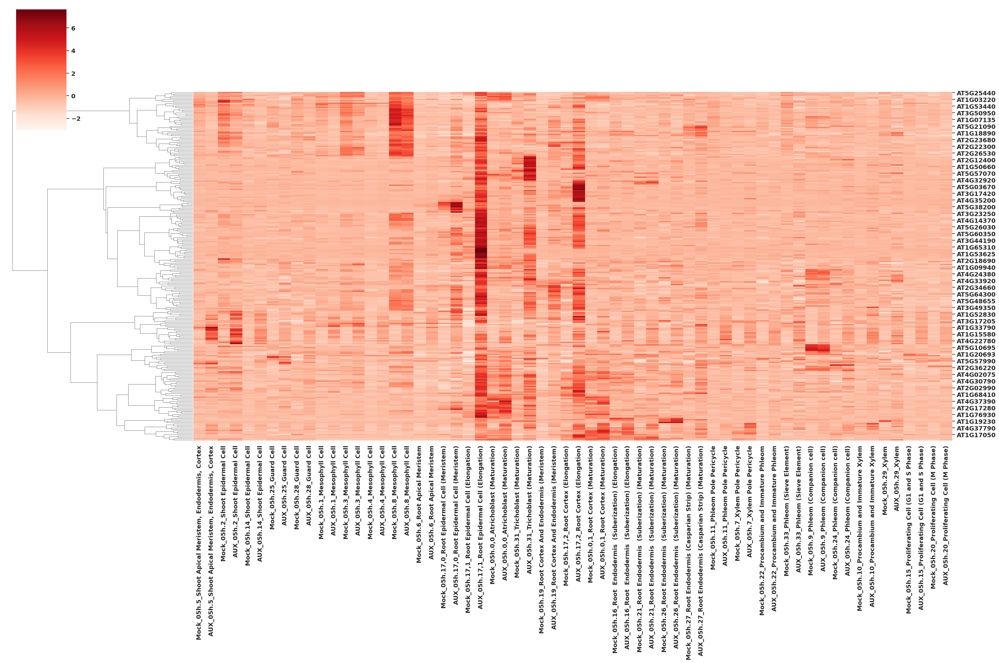

In [142]:
sns.set(font_scale=1.2,style='white',rc={'font.weight': 'bold'})
sns.clustermap(auxin_allcluster_05h_draw,cmap='Reds',method='ward', z_score=0,col_cluster=False,figsize=(30,20))

/public/home/lizw/anaconda3/envs/sc_py_0127/lib/python3.8/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


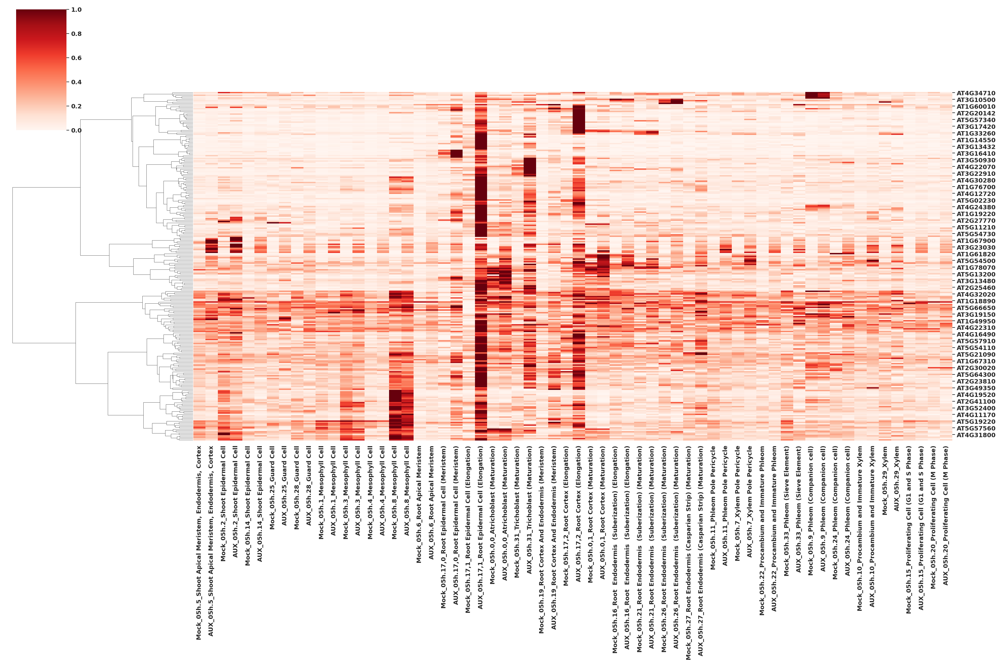

In [143]:
sns.set(font_scale=1.2,style='white',rc={'font.weight': 'bold'})
sns.clustermap(auxin_allcluster_05h_draw,cmap='Reds',method='ward', standard_scale=0,col_cluster=False,figsize=(30,20))

In [164]:
auxin_allcluster_05h_draw_log2 = auxin_allcluster_05h_draw.apply(np.log2).replace([np.inf, -np.inf], 0)

/public/home/lizw/anaconda3/envs/sc_py_0127/lib/python3.8/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


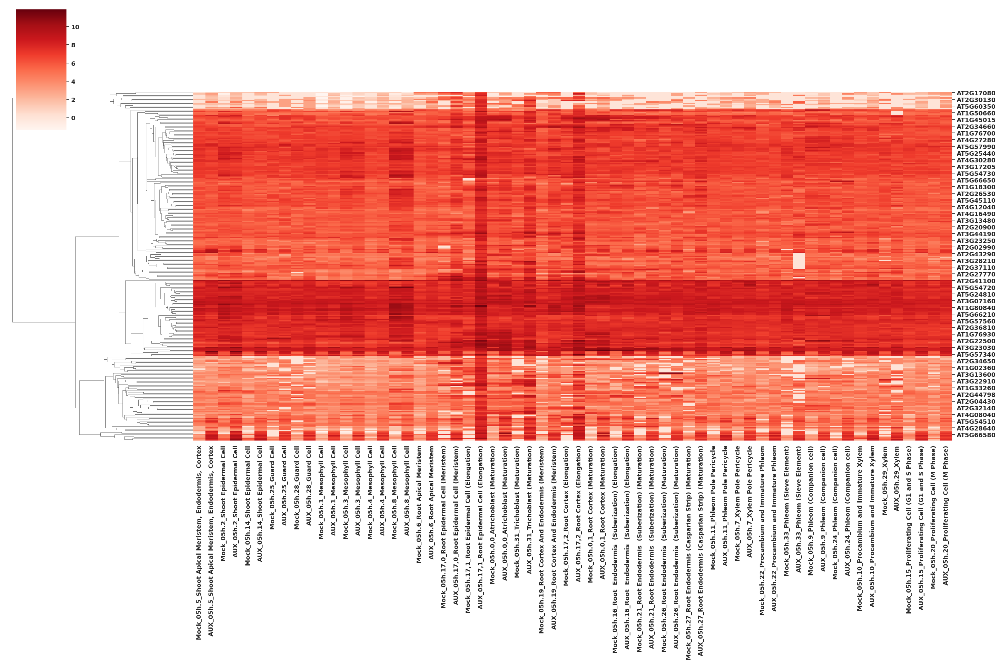

In [165]:
sns.set(font_scale=1.2,style='white',rc={'font.weight': 'bold'})
sns.clustermap(auxin_allcluster_05h_draw_log2,cmap='Reds',col_cluster=False,figsize=(30,20))

In [166]:
auxin_allcluster_05h_draw_log2

,"Mock_05h.5_Shoot Apical Meristem, Endodermis, Cortex","AUX_05h.5_Shoot Apical Meristem, Endodermis, Cortex",Mock_05h.2_Shoot Epidermal Cell,AUX_05h.2_Shoot Epidermal Cell,Mock_05h.14_Shoot Epidermal Cell,AUX_05h.14_Shoot Epidermal Cell,Mock_05h.25_Guard Cell,AUX_05h.25_Guard Cell,Mock_05h.28_Guard Cell,AUX_05h.28_Guard Cell,...,Mock_05h.24_Phleom (Companion cell),AUX_05h.24_Phleom (Companion cell),Mock_05h.10_Procambium and Immature Xylem,AUX_05h.10_Procambium and Immature Xylem,Mock_05h.29_Xylem,AUX_05h.29_Xylem,Mock_05h.15_Proliferating Cell (G1 and S Phase),AUX_05h.15_Proliferating Cell (G1 and S Phase),Mock_05h.20_Proliferating Cell (M Phase),AUX_05h.20_Proliferating Cell (M Phase)
AT1G02360,2.714425,3.635896,5.420405,5.199440,4.169580,3.982843,2.684466,3.024889,4.016028,2.910762,...,0.000000,2.651088,2.816235,3.001001,3.067298,0.000000,1.130504,3.439862,3.588406,4.433540
AT1G02400,7.794798,8.190484,9.720770,9.866197,8.154473,8.208911,7.854391,7.609852,8.373580,8.465351,...,8.187810,8.509069,7.924760,8.116478,8.526729,7.910473,7.522822,7.942362,7.495297,8.058031
AT1G03220,5.801888,4.561895,6.270162,5.572099,6.491508,4.982843,3.684466,3.024889,6.185953,4.910762,...,4.761546,5.236050,5.138163,3.875470,4.652260,0.000000,5.378432,4.662254,4.003443,5.018503
AT1G04240,7.699318,9.426407,7.609578,9.063170,6.169580,7.634920,5.854391,7.484321,6.016028,5.910762,...,7.083474,7.821013,7.101638,8.123397,6.067298,6.325510,4.830944,6.942362,5.462875,7.403166
AT1G07135,6.787674,6.000468,8.324121,7.137379,6.976935,6.033469,6.491821,6.346817,7.408345,5.910762,...,6.346508,5.458443,6.173787,5.970627,5.874653,5.588545,6.802930,5.899293,6.173368,5.549017
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
AT5G65670,7.348631,8.823742,7.534662,8.675344,7.832545,8.550527,7.439354,8.484321,7.600990,8.611202,...,7.970999,8.990938,8.849658,9.647259,7.237223,9.251510,7.488056,8.409488,7.647300,8.448490
AT5G66070,6.358281,5.756911,7.220950,6.848753,5.754543,5.497416,6.684466,6.725329,6.716467,4.910762,...,6.346508,7.110519,5.945518,5.970627,6.652260,5.003582,5.715467,5.899293,5.810798,5.308009
AT5G66210,8.613278,7.675911,9.802875,8.611152,8.813436,7.683283,9.208028,8.024889,9.145311,8.337027,...,8.668436,7.780371,8.393664,7.816918,8.352700,8.091045,8.470354,7.712880,8.446387,7.576498
AT5G66580,4.036353,8.302652,4.497573,8.355803,5.672081,7.833699,0.000000,6.346817,3.016028,6.718117,...,0.000000,6.899015,0.816235,6.274019,4.067298,7.003582,4.300429,7.004646,4.810798,6.706559


In [38]:
# unfilter deg 
df = pd.read_csv('/public/home/lizw/home2/task/singlecell/singlecell_hormone/20240101/cpm_deg/celltype_deg/raw_cluster_deg.csv')

/tmp/ipykernel_84190/2914593089.py:2: DtypeWarning: Columns (9) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('/public/home/lizw/home2/task/singlecell/singlecell_hormone/20240101/cpm_deg/celltype_deg/raw_cluster_deg.csv')


In [41]:
df.query('(logFC >= 0.66) &(fdr <0.05) & (b=="AUX_05h")').to_csv('/public/home/lizw/home2/task/singlecell/singlecell_hormone/20240101/iaa_explore/auxin_1.5fc_deg.csv')

## compare with other cortex and epidermal genes?

In [9]:
epiandcortex_list = ['17,0_Root Epidermal Cell (Meristem)',
                    '17,1_Root Epidermal Cell (Elongation)',
                    '0,0_Atrichoblast (Maturation)',
                    '19_Root Cortex And Endodermis (Meristem)',
                    '17,2_Root Cortex (Elongation)',
                    '0,1_Root Cortex (Maturation)',
                    '31_Trichoblast (Maturation)']

In [10]:
compare_clusters = ourdeg.query('(b == "AUX_05h") & (cluster_celltype in @epiandcortex_list) & (DEG == "Up")')

In [11]:
compare_clusters_pivot = compare_clusters.pivot(index='index',columns='Cluster',values='DEG').fillna(False).replace({'Up':True})

In [28]:
compare_clusters_pivot.columns

Index(['0,0', '0,1', '17,0', '17,1', '17,2', '19', '31'], dtype='object', name='Cluster')

In [36]:
compare_clusters_pivot.value_counts()

0,0    0,1    17,0   17,1   17,2   19     31   
False  False  False  True   False  False  False    170
                     False  False  True   False     46
True   False  False  False  False  False  False     41
False  True   False  False  False  False  False     38
       False  False  False  True   False  False     22
True   True   False  False  False  False  False     21
False  False  False  True   True   False  False     15
                            False  True   False     14
True   True   False  True   True   True   False      9
                                   False  False      9
False  False  True   False  False  False  False      8
              False  True   True   True   False      8
              True   True   False  False  False      4
True   True   False  False  False  True   False      4
False  False  False  False  True   True   False      4
True   True   False  False  True   False  False      3
              True   True   True   True   False      3
       False  Fal

In [13]:
from upsetplot import generate_counts

{'matrix': <Axes: >,
 'shading': <Axes: >,
 'totals': <Axes: >,
 'intersections': <Axes: ylabel='Intersection size'>}

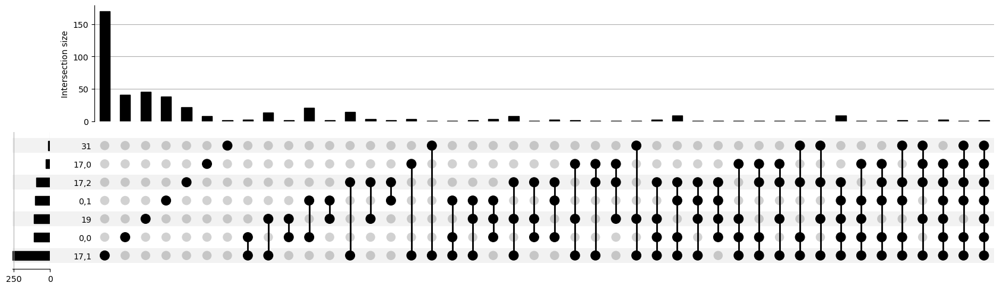

In [37]:
from upsetplot import plot
plot(compare_clusters_pivot.value_counts()) 

In [180]:
compare_clusters_dict = compare_clusters.groupby('Cluster')['index'].apply(set).to_dict()

In [181]:
compare_clusters_dict 

{'0,0': {'AT1G04240',
  'AT1G06983',
  'AT1G09932',
  'AT1G11100',
  'AT1G11670',
  'AT1G13580',
  'AT1G15580',
  'AT1G15670',
  'AT1G18400',
  'AT1G18460',
  'AT1G19220',
  'AT1G21980',
  'AT1G26945',
  'AT1G29440',
  'AT1G29465',
  'AT1G30135',
  'AT1G36640',
  'AT1G48500',
  'AT1G53990',
  'AT1G54000',
  'AT1G57560',
  'AT1G57570',
  'AT1G60010',
  'AT1G61820',
  'AT1G65920',
  'AT1G67340',
  'AT1G67900',
  'AT1G72416',
  'AT1G72450',
  'AT1G72790',
  'AT1G78000',
  'AT1G78100',
  'AT1G80240',
  'AT1G80550',
  'AT2G01430',
  'AT2G22800',
  'AT2G22810',
  'AT2G23060',
  'AT2G23170',
  'AT2G26480',
  'AT2G27000',
  'AT2G27790',
  'AT2G28690',
  'AT2G33310',
  'AT2G33480',
  'AT2G34650',
  'AT2G35270',
  'AT2G35930',
  'AT2G42280',
  'AT2G42430',
  'AT2G44600',
  'AT2G45400',
  'AT3G02620',
  'AT3G06370',
  'AT3G09940',
  'AT3G11370',
  'AT3G13690',
  'AT3G15540',
  'AT3G17090',
  'AT3G23030',
  'AT3G23510',
  'AT3G25900',
  'AT3G25930',
  'AT3G52360',
  'AT3G54040',
  'AT3G58120',
  '

In [153]:
import matplotlib.pyplot as plt
from kneed import KneeLocator
from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler

In [154]:
import scipy
import numpy as np
import string

In [155]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

In [160]:
def kmeans_zscore_cpmdf(cpm_old,kmeans_count,zscore):
    #imput df columns for sample rows for gene
    if zscore == True:
        cpm_new = scipy.stats.zscore(cpm_old,axis=1)
        cpm_new_np = np.array(cpm_new)
    else:
        cpm_new = cpm_old
        cpm_new_np = np.array(cpm_old)
    kmeans = KMeans(
    init="random",
    n_clusters=kmeans_count,
    n_init=10,
    max_iter=300,
    random_state=42
)
    kmeans.fit(cpm_new_np)
    
    cpm_new.insert(0,'kmeans_label',kmeans.labels_)
    cpm_new = cpm_new.sort_values(by='kmeans_label')
    sns.set(font_scale=1.2,style='white',rc={'font.weight': 'bold'})
    color_map = [
    "#66c2a5",
    "#fc8d62",
    "#8da0cb",
    "#e78ac3",
    "#a6d854",
    "#ffd92f",
    "#e5c494",
    "#b3b3b3"
]
    sns.set(font_scale=1.2,style='white',rc={'font.weight': 'bold'})
    row_colors = [color_map[i] for i in cpm_new['kmeans_label']]
    kmean_map = dict(zip(cpm_new.index,cpm_new['kmeans_label']))
    cpm_new = cpm_new.drop('kmeans_label',axis=1)
    g = sns.clustermap(cpm_new,row_cluster=False, col_cluster=False,figsize=(30,20),cmap='Reds',row_colors=row_colors)
    ax = g.ax_heatmap
    ax.set_yticklabels([])
    ax.set_ylabel('DEGs')
    ax.tick_params(right=False, bottom=False)
    ax.set_yticklabels([])
    
    
    #cpmdf
    cpmdf = cpm_old
    cpmdf['kmeans'] = cpmdf.index.map(kmean_map)
    letters = string.ascii_uppercase
    genetype_map = {x:letters[x] for x in range(kmeans_count)}
    cpmdf['genetype'] = cpmdf['kmeans'].map(genetype_map)
    geneIDName_df = pd.read_csv('/public/home/lizw/home2/task/singlecell/singlecell_hormone/REF/gene_ID_name_v3.csv')
    genename = cpmdf.index.map(dict(zip(geneIDName_df['GeneID'],geneIDName_df['GeneID_name'])))
    cpmdf.insert(0,'genename',genename)
    
    return cpmdf, cpm_new
    

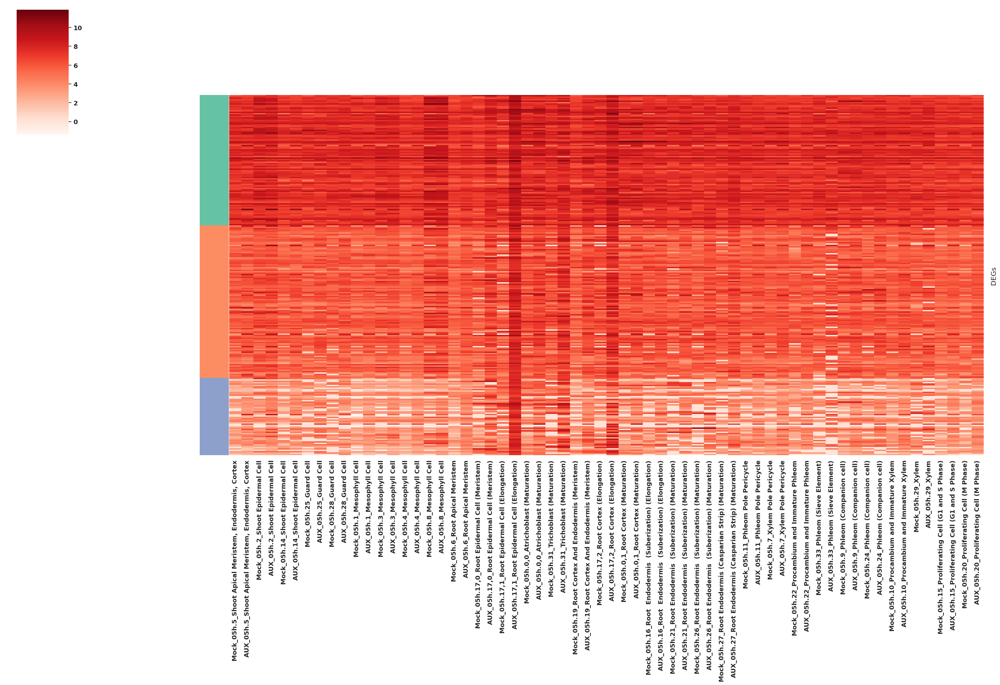

In [167]:
auxin_allcluster_05h_draw_new, auxin_allcluster_05h_draw_zscore = kmeans_zscore_cpmdf(auxin_allcluster_05h_draw_log2,3,zscore=False)

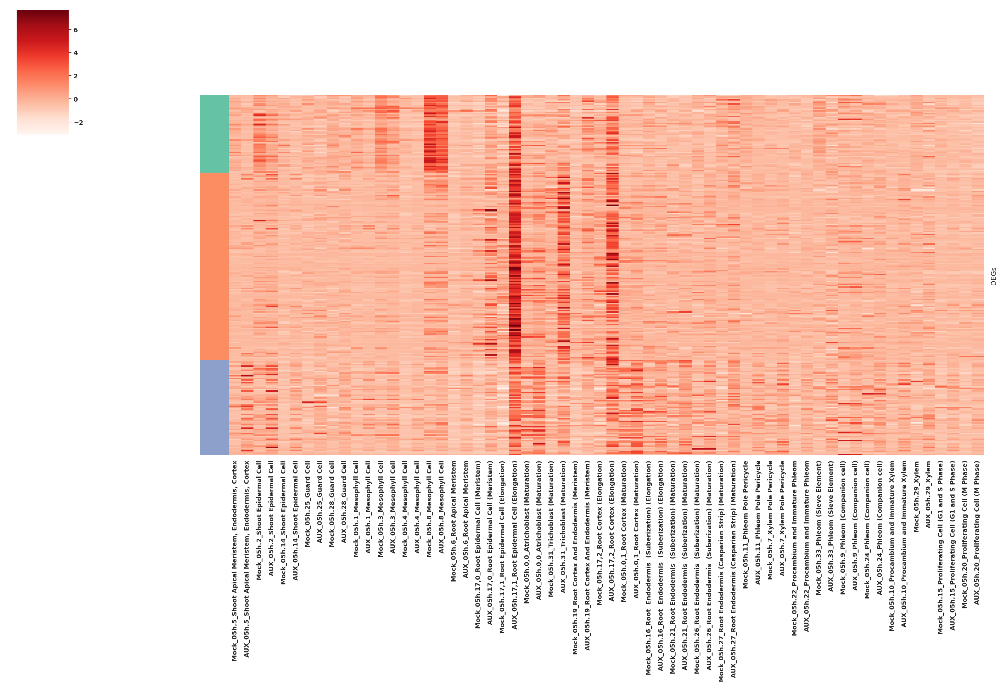

In [31]:
auxin_allcluster_05h_draw_new, auxin_allcluster_05h_draw_zscore = kmeans_zscore_cpmdf(auxin_allcluster_05h_draw,3)

In [32]:
auxin_allcluster_05h_draw_new.to_csv('/public/home/lizw/home2/task/singlecell/singlecell_hormone/20240101/auxin_allcluster_05h_draw_new.csv')

In [87]:
auxin_allcluster_05h_draw_zscore = scipy.stats.zscore(auxin_allcluster_05h_draw,axis=1)
auxin_allcluster_05h_draw_zscore_np = np.array(auxin_allcluster_05h_draw_zscore)

In [88]:
kmeans_kwargs = {
    "init": "random",
    "n_init": 20,
    "max_iter": 300,
    "random_state": 42,
}

# A list holds the SSE values for each k
sse = []
for k in range(1, 21):
    kmeans = KMeans(n_clusters=k, **kmeans_kwargs)
    kmeans.fit(auxin_allcluster_05h_draw_zscore_np)
    sse.append(kmeans.inertia_)

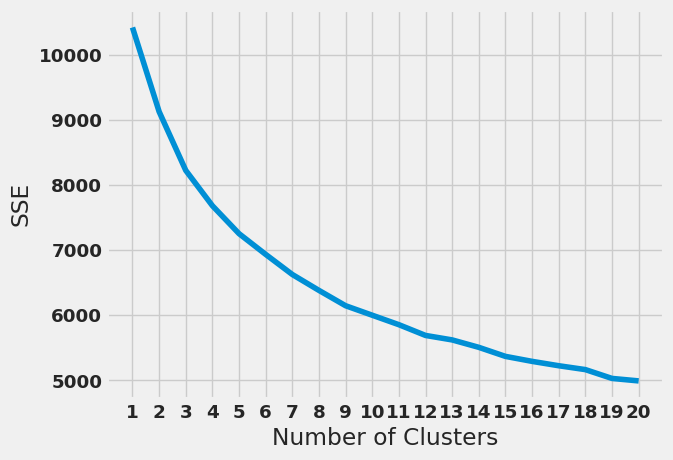

In [89]:
plt.style.use("fivethirtyeight")
plt.plot(range(1, 21), sse)
plt.xticks(range(1, 21))
plt.xlabel("Number of Clusters")
plt.ylabel("SSE")
plt.show()
#用SSE则选择拐点

In [90]:
#拐点判断
kl = KneeLocator(
    range(1, 21), sse, curve="convex", direction="decreasing"
)

kl.elbow

7

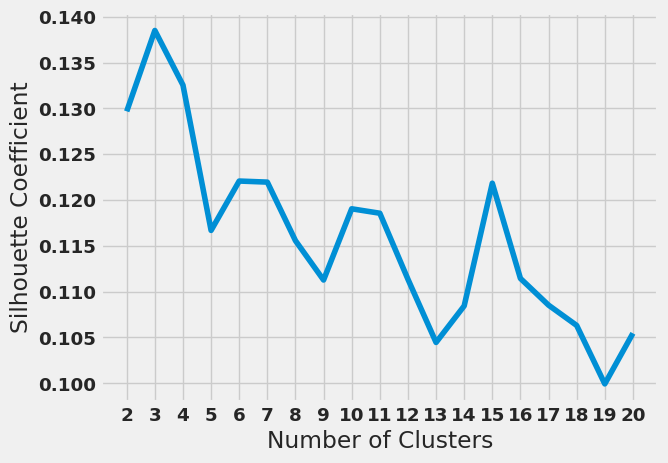

In [92]:
# A list holds the silhouette coefficients for each k
silhouette_coefficients = []

# Notice you start at 2 clusters for silhouette coefficient
for k in range(2, 21):
    kmeans = KMeans(n_clusters=k, **kmeans_kwargs)
    kmeans.fit(auxin_allcluster_05h_draw_zscore_np)
    score = silhouette_score(auxin_allcluster_05h_draw_zscore_np, kmeans.labels_)
    silhouette_coefficients.append(score)
plt.style.use("fivethirtyeight")
plt.plot(range(2, 21), silhouette_coefficients)
plt.xticks(range(2, 21))
plt.xlabel("Number of Clusters")
plt.ylabel("Silhouette Coefficient")
plt.show()

# IAA crosstalk explore

# gene clustercount distribution

In [6]:
import pandas as pd
import seaborn as sns

In [18]:
ourdeg = pd.read_csv('/public/home/lizw/home2/task/singlecell/singlecell_hormone/20240101/cpm_deg/celltype_deg/filtered_cluster_deg.csv')

In [19]:
ourdeg = ourdeg[~ourdeg['index'].str.contains('^ATC|^ATM')]

In [20]:
 cluster_order = ['5','2','14','25','28','1','3','4','8','6','17,0','17,1',
                    '0,0','31','32','19','17,2','0,1','16','21','26',
                    '27','11','7','22','33','9','24','10','29',
                    '15','18','20','30','13','12','23']

In [21]:
# remove cluster 34 35
ourdeg = ourdeg[ourdeg['Cluster'].isin(cluster_order)]

In [23]:
ourdeg['Hormone'] = ourdeg['b'].str.split('_').str[0]

In [24]:
ourdeg

,Unnamed: 0,index,logFC,logCPM,LR,PValue,fdr,a,b,Cluster,Time,cluster_celltype,DEG,Hormone
0,184,AT1G04240,1.730986,5.675642,30.345686,3.615100e-08,0.000015,Mock_05h,AUX_05h,"0,0",0.5h,"0,0_Atrichoblast (Maturation)",Up,AUX
1,416,AT1G08230,-1.370972,5.475824,17.159073,3.437635e-05,0.005580,Mock_05h,AUX_05h,"0,0",0.5h,"0,0_Atrichoblast (Maturation)",Down,AUX
2,525,AT1G09932,1.244900,5.293784,15.703812,7.407474e-05,0.010381,Mock_05h,AUX_05h,"0,0",0.5h,"0,0_Atrichoblast (Maturation)",Up,AUX
3,595,AT1G11100,1.310920,6.251779,14.294075,1.563563e-04,0.018512,Mock_05h,AUX_05h,"0,0",0.5h,"0,0_Atrichoblast (Maturation)",Up,AUX
4,625,AT1G11670,1.189101,9.822378,15.406074,8.670913e-05,0.011909,Mock_05h,AUX_05h,"0,0",0.5h,"0,0_Atrichoblast (Maturation)",Up,AUX
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
129687,4299496,AT5G49360,-5.901031,9.374768,9.228158,2.383213e-03,0.049190,Mock_3h,JA_3h,33,3h,33_Phleom (Sieve Element),Down,JA
129688,4299524,AT5G56870,-7.300766,9.648705,24.452516,7.616400e-07,0.000393,Mock_3h,JA_3h,33,3h,33_Phleom (Sieve Element),Down,JA
129689,4299554,AT5G64100,-3.667257,9.342643,12.231879,4.697987e-04,0.017315,Mock_3h,JA_3h,33,3h,33_Phleom (Sieve Element),Down,JA
129690,4299555,AT5G64250,2.170266,9.768643,16.278719,5.467455e-05,0.004760,Mock_3h,JA_3h,33,3h,33_Phleom (Sieve Element),Up,JA


In [11]:
cluster_count_df_up = ourdeg.query('DEG == "Up"').groupby(['b','index']).count()['Cluster'].reset_index()
cluster_count_df_up = cluster_count_df_up.rename({'Cluster':'Cluster Count'},axis=1)
cluster_count_df_down = ourdeg.query('DEG == "Down"').groupby(['b','index']).count()['Cluster'].reset_index()
cluster_count_df_down = cluster_count_df_down.rename({'Cluster':'Cluster Count'},axis=1)

In [30]:
import matplotlib.pyplot as plt

In [44]:
def clustercount_bin_barplot(df_gene_clustercount,groupby,groupby_order,bins,binlabels,cmap):
    #df_gene_clustercount is a table with col1 for sample name, col2 for geneid and col3 for clustercount
    CUT_clustercount_dict_df = pd.DataFrame([])
    for sample, _df in df_gene_clustercount.groupby(groupby):
        segments = pd.cut(_df['Cluster Count'],bins,right=False,ordered=False,labels=binlabels).value_counts()
        segments.name = sample
        CUT_clustercount_dict_df = CUT_clustercount_dict_df.append(segments)
    df_ratio = CUT_clustercount_dict_df.T/CUT_clustercount_dict_df.sum(axis=1)
    df_ratio = df_ratio.reindex(groupby_order,axis=1,level=0)
    df_ratio_T = df_ratio.reindex(binlabels).T
    sns.set(font_scale=1.2,style='white',rc={'font.weight': 'bold'})
    fig,ax = plt.subplots(1,figsize=(8,6))
    ax.spines[['right', 'top']].set_visible(False)
    df_ratio_T.plot(kind='bar',stacked=True,cmap=cmap,ax=ax,width=0.9,)
    sns.move_legend(ax,'upper left',bbox_to_anchor=(1, 1))
    return df_ratio_T

In [45]:
sample_list_order = ['AUX_05h','AUX_3h','CK_05h','CK_3h','ABA_05h','ABA_3h',
                    'GA_05h','GA_3h','SL_05h','SL_3h','BR_05h','BR_3h',
                    'ET_05h','ET_3h','JA_05h','JA_3h']

/tmp/ipykernel_52960/2376954182.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  CUT_clustercount_dict_df = CUT_clustercount_dict_df.append(segments)
/tmp/ipykernel_52960/2376954182.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  CUT_clustercount_dict_df = CUT_clustercount_dict_df.append(segments)
/tmp/ipykernel_52960/2376954182.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  CUT_clustercount_dict_df = CUT_clustercount_dict_df.append(segments)
/tmp/ipykernel_52960/2376954182.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  CUT_clustercount_dict_df = CUT_clustercount_dict_df.append(segments)
/tmp/ipykernel_52960/2376954182.

,1,2-4,5-9,10-14,15-19,>=20
AUX_05h,0.651365,0.245658,0.060794,0.013648,0.011166,0.017370
AUX_3h,0.681388,0.211356,0.066246,0.025237,0.006309,0.009464
CK_05h,0.504323,0.268732,0.130403,0.050432,0.021614,0.024496
CK_3h,0.556984,0.329906,0.082262,0.020566,0.003428,0.006855
ABA_05h,0.450518,0.298137,0.137888,0.046377,0.026915,0.040166
ABA_3h,0.412756,0.294224,0.160951,0.057461,0.031889,0.042720
GA_05h,0.608635,0.267409,0.083565,0.026462,0.006964,0.006964
GA_3h,0.763780,0.228346,0.007874,0.000000,0.000000,0.000000
SL_05h,0.681818,0.284689,0.029506,0.003987,0.000000,0.000000
SL_3h,0.774390,0.204268,0.018293,0.003049,0.000000,0.000000


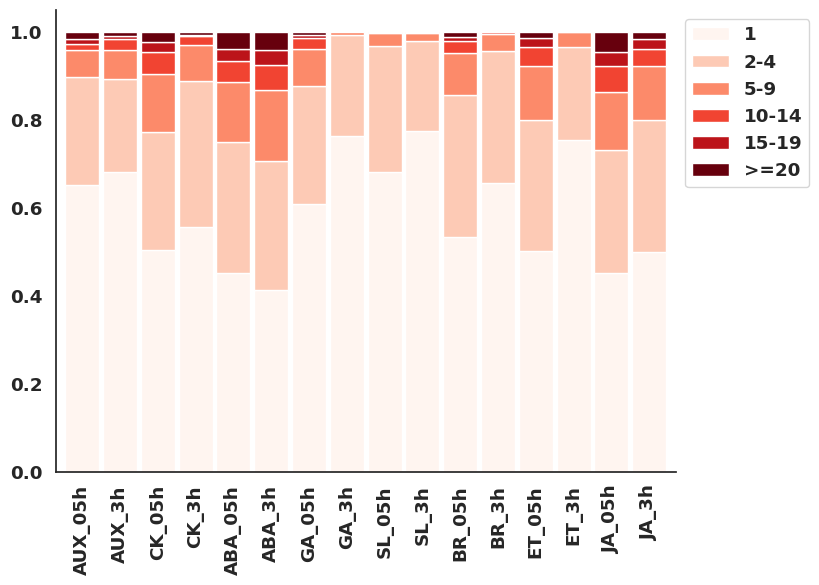

In [46]:
clustercount_bin_barplot(cluster_count_df_up,
                         groupby='b',
                         groupby_order=sample_list_order,
                         bins=[1,2,5,10,15,20,37],
                         binlabels = ['1','2-4','5-9','10-14','15-19','>=20'],
                         cmap='Reds')

/tmp/ipykernel_52960/2376954182.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  CUT_clustercount_dict_df = CUT_clustercount_dict_df.append(segments)
/tmp/ipykernel_52960/2376954182.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  CUT_clustercount_dict_df = CUT_clustercount_dict_df.append(segments)
/tmp/ipykernel_52960/2376954182.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  CUT_clustercount_dict_df = CUT_clustercount_dict_df.append(segments)
/tmp/ipykernel_52960/2376954182.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  CUT_clustercount_dict_df = CUT_clustercount_dict_df.append(segments)
/tmp/ipykernel_52960/2376954182.

,1,2-4,5-9,10-14,15-19,>=20
AUX_05h,0.755144,0.218107,0.022634,0.000000,0.004115,0.000000
AUX_3h,0.837321,0.153110,0.009569,0.000000,0.000000,0.000000
CK_05h,0.600906,0.314360,0.071151,0.009056,0.004528,0.000000
CK_3h,0.603499,0.279883,0.077259,0.021866,0.008746,0.008746
ABA_05h,0.595435,0.288004,0.078193,0.019427,0.010685,0.008256
ABA_3h,0.508160,0.304011,0.107054,0.036238,0.017704,0.026833
GA_05h,0.728276,0.233103,0.033103,0.001379,0.001379,0.002759
GA_3h,0.765027,0.180328,0.032787,0.010929,0.005464,0.005464
SL_05h,0.698826,0.254195,0.038591,0.007550,0.000839,0.000000
SL_3h,0.611898,0.235127,0.121813,0.025496,0.005666,0.000000


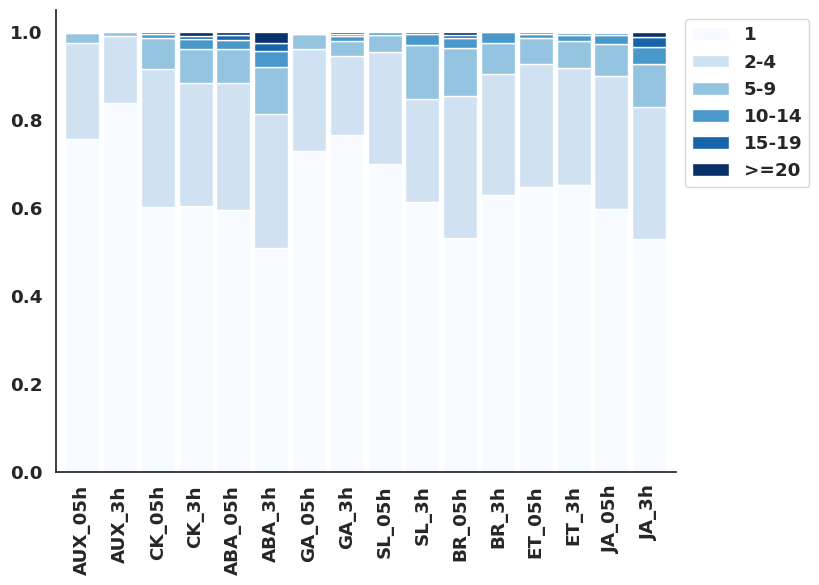

In [47]:
clustercount_bin_barplot(cluster_count_df_down,
                         groupby='b',
                         groupby_order=sample_list_order,
                         bins=[1,2,5,10,15,20,37],
                         binlabels = ['1','2-4','5-9','10-14','15-19','>=20'],
                         cmap='Blues')

# two time plot compare

In [48]:
ourdeg['Hormone'] = ourdeg['b'].str.split('_').str[0]

In [49]:
def deg_test(df,clustername,direction,hormone,clusterorder):
    up_05 = df.query('(DEG == @direction) & (Time == "0.5h") & (Hormone == @hormone)').groupby(clustername)['index'].apply(list).to_dict()
    up_3 = df.query('(DEG == @direction) & (Time == "3h") & (Hormone == @hormone)').groupby(clustername)['index'].apply(list).to_dict()
    set_up_df = pd.DataFrame(columns=['Only_05h','Overlap','Only_3h','sum'],index = up_05.keys())
    count_up_df =  pd.DataFrame(columns=['Only_05h','Overlap','Only_3h','sum'],index = up_05.keys())
    for cluster in list(df['Cluster'].drop_duplicates()):
        if cluster not in up_05:
            up_05[cluster] = []
        if cluster not in up_3:
            up_3[cluster] = []
        only_05 = set(up_05[cluster]) - set(up_3[cluster])
        only_3 = set(up_3[cluster]) - set(up_05[cluster])
        overlap = set(up_05[cluster]) & set(up_3[cluster])
        sum_ = set(up_05[cluster]) | set(up_3[cluster])
        set_up_df.loc[cluster,'Only_05h'] = only_05
        set_up_df.loc[cluster,'Only_3h'] = only_3
        set_up_df.loc[cluster,'Overlap'] = overlap
        set_up_df.loc[cluster,'sum'] = sum_

        count_up_df.loc[cluster,'Only_05h'] = len(only_05)
        count_up_df.loc[cluster,'Only_3h'] = len(only_3)
        count_up_df.loc[cluster,'Overlap'] = len(overlap)
        count_up_df.loc[cluster,'sum'] = len(sum_)
    
    #perce_up_df = (count_up_df.T/count_up_df['sum']).reindex(['Only_WCS417','Overlap','Only_GMI1000']).T
    
    #smod
    def sMod(N, m, n1, n2):
        import math

        p = 0
        denominator = math.comb(N, n1) * math.comb(N, n2)
        for i in range(m, min(n1, n2) + 1):
            numerator = (
                math.comb(N, i) * math.comb(N - i, n1 - i) * math.comb(N - n1, n2 - i)
            )
            p += numerator / denominator
        smod = -np.log10(p)
        return smod
    smod_up_df = count_up_df.apply(lambda x:sMod(x['sum'],x['Overlap'],x['Only_05h'],x['Only_3h']),axis=1)
    
    
    hormone_list = ['AUX','CK','ABA','GA','SL','BR','ET','JA']
    cluster_order = ['5','2','14','25','28','1','3','4','8','6','17,0','17,1',
                    '0,0','31','32','19','17,2','0,1','16','21','26',
                    '27','11','7','22','33','9','24','10','29',
                    '15','18','20','30','13','12','23']
    color_dict = {'#9ffb9f':['5'],
                 '#30cc30':['2','14'],
                 '#006200':['25','28'],
                 '#7dffd3':['1','3','4','8'],
                 '#f07f7f':['6'],
                 '#a42828':['17,0','17,1','0,0','31'],
                 '#7f007f':['32'],
                 '#da6fd5':['0,1','17,2','19'],
                 '#dc123a':['16','21','26','27'],
                 '#ffa502':['11','7','22','33','9','24','10','29'],
                 '#b48002':['15','18','20'],
                 '#6f7f8f':['30','13','12','23']}
    color_dict_reverse = {x:y for x in cluster_order for y in color_dict if x in color_dict[y]}
    
    sns.set(font_scale=1.2,style='white',rc={'font.weight': 'bold'})
    fig,ax = plt.subplots(1,figsize=(12,6))
    ax.spines[['right', 'top']].set_visible(False)
    count_up_df.reindex(clusterorder).reindex(
        ['Only_05h','Overlap','Only_3h'],axis=1).plot(kind='bar',ax=ax,width=0.9,stacked=True,
        color=['steelblue','darkorange','green'])
    ax.legend(bbox_to_anchor=(0.18, 1.2))
    
    plt.title(hormone, weight='bold').set_fontsize('18')
    for label in ax.get_xticklabels():
        if label.get_text() in color_dict_reverse:
            print(type(label.get_text()))
            label.set_color(color_dict_reverse[label.get_text()])

    plt.show()
    
    fig,ax = plt.subplots(1,figsize=(12,6))
    ax.spines[['right', 'top']].set_visible(False)
    count_up_df['sum'] = count_up_df['sum'].replace({0:np.nan})
    count_up_df_ratio = (count_up_df.T/count_up_df['sum']).T
    count_up_df_ratio.reindex(clusterorder).reindex(
        ['Only_05h','Only_3h','Overlap'],axis=1).plot(kind='bar',ax=ax,width=0.9,stacked=True,
        color=['steelblue','green','darkorange'])
    ax.legend(bbox_to_anchor=(0.18, 1.2))
    plt.title(hormone, weight='bold').set_fontsize('18')
    for label in ax.get_xticklabels():
        if label.get_text() in color_dict_reverse:
            print(type(label.get_text()))
            label.set_color(color_dict_reverse[label.get_text()])

    plt.show()
    
    return count_up_df

In [51]:
hormone_list = ['AUX','CK','ABA','GA','SL','BR','ET','JA']

In [53]:
import numpy as np

/tmp/ipykernel_52960/1123565187.py:38: RuntimeWarning: divide by zero encountered in log10
  smod = -np.log10(p)


<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>


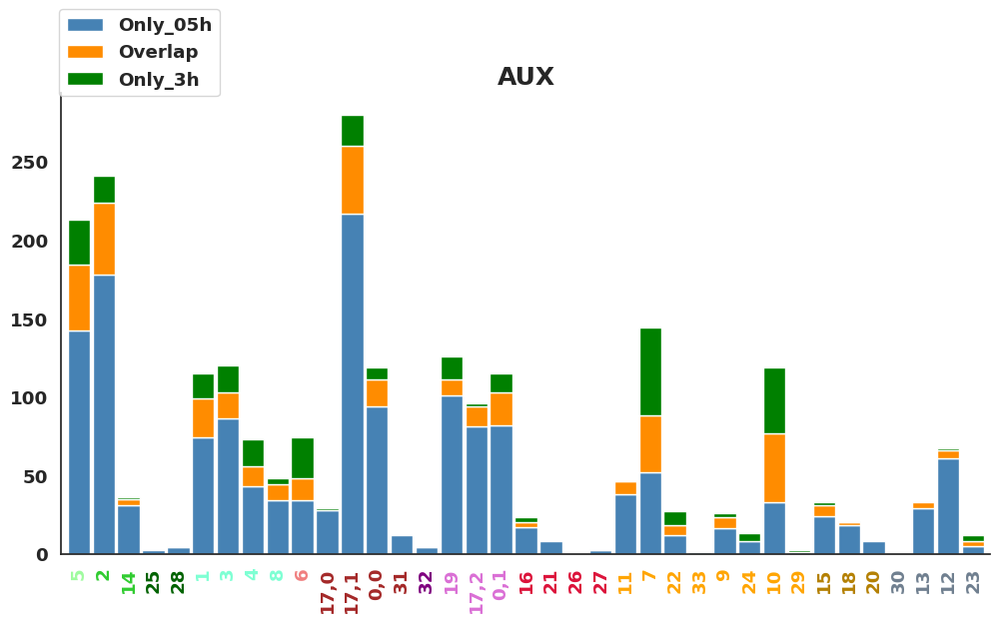

<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>


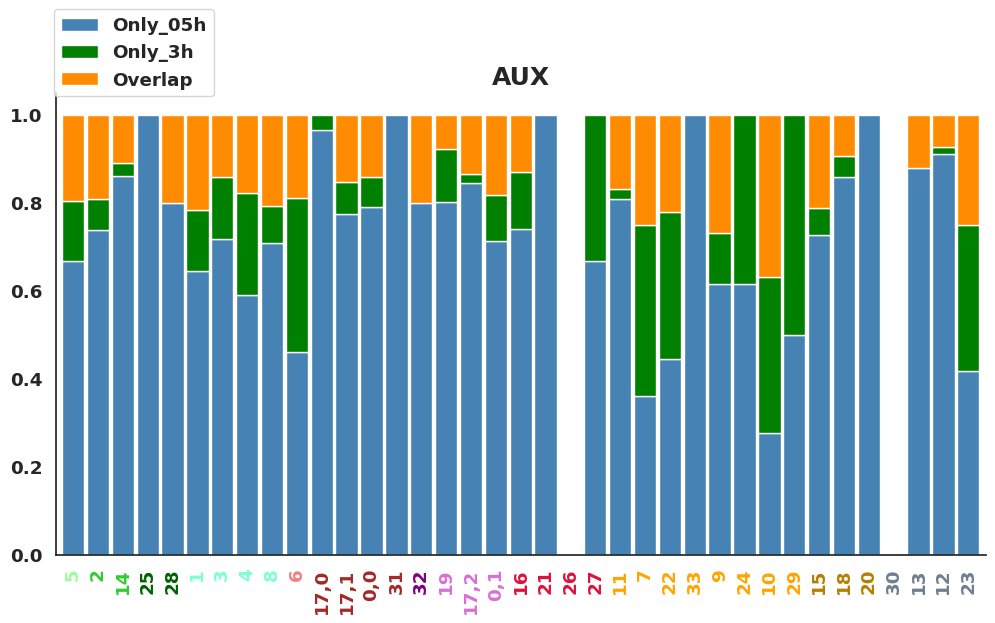

/tmp/ipykernel_52960/1123565187.py:38: RuntimeWarning: divide by zero encountered in log10
  smod = -np.log10(p)


<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>


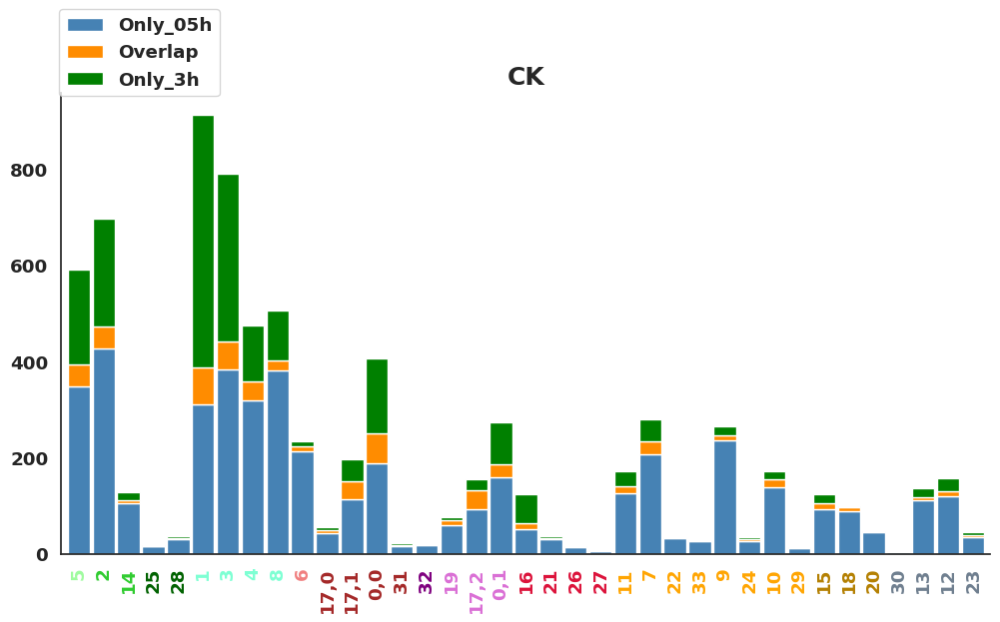

<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>


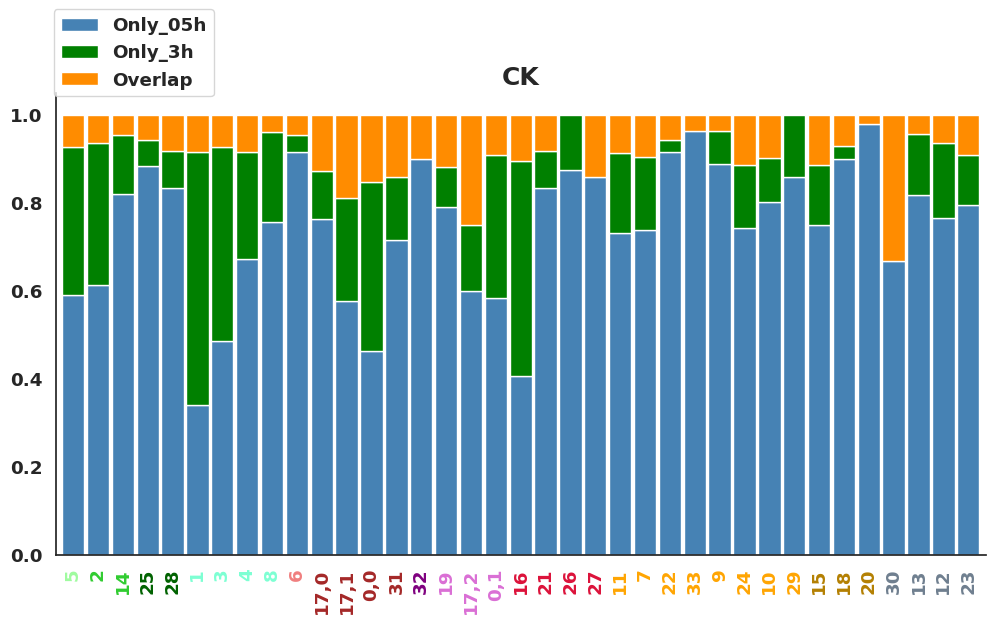

/tmp/ipykernel_52960/1123565187.py:38: RuntimeWarning: divide by zero encountered in log10
  smod = -np.log10(p)


<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>


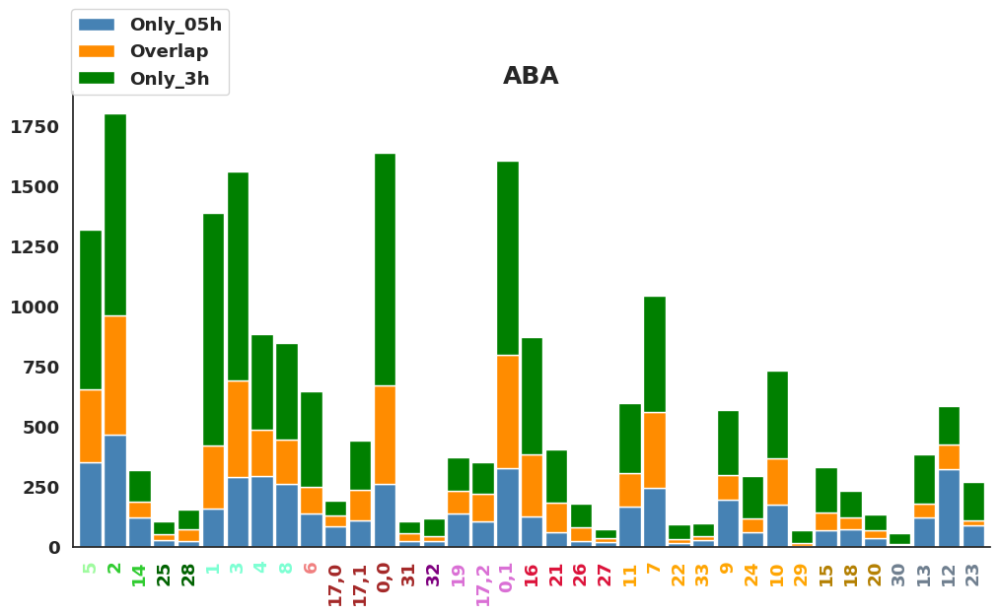

<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>


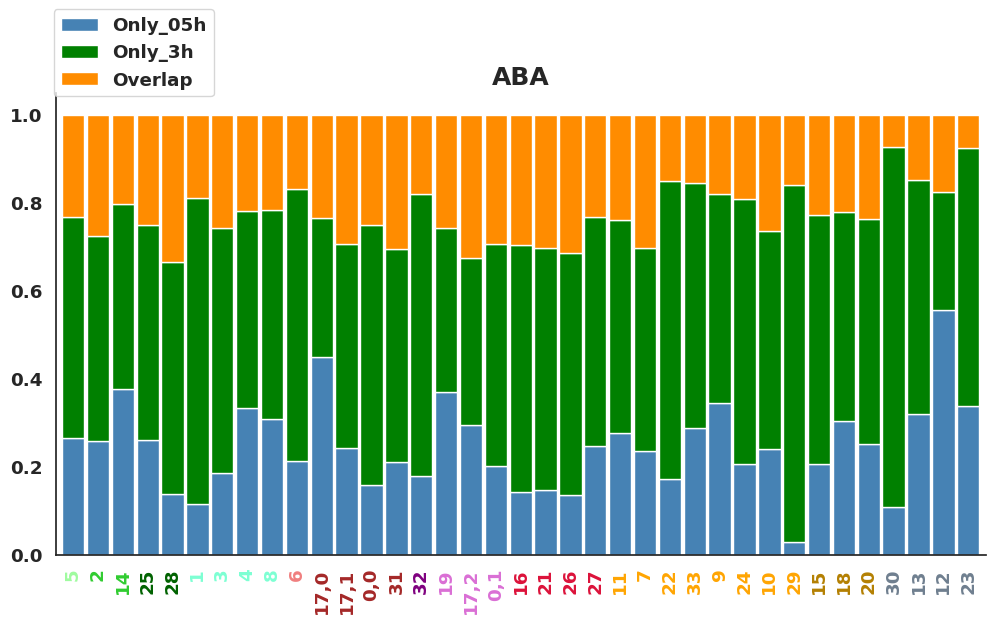

<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>


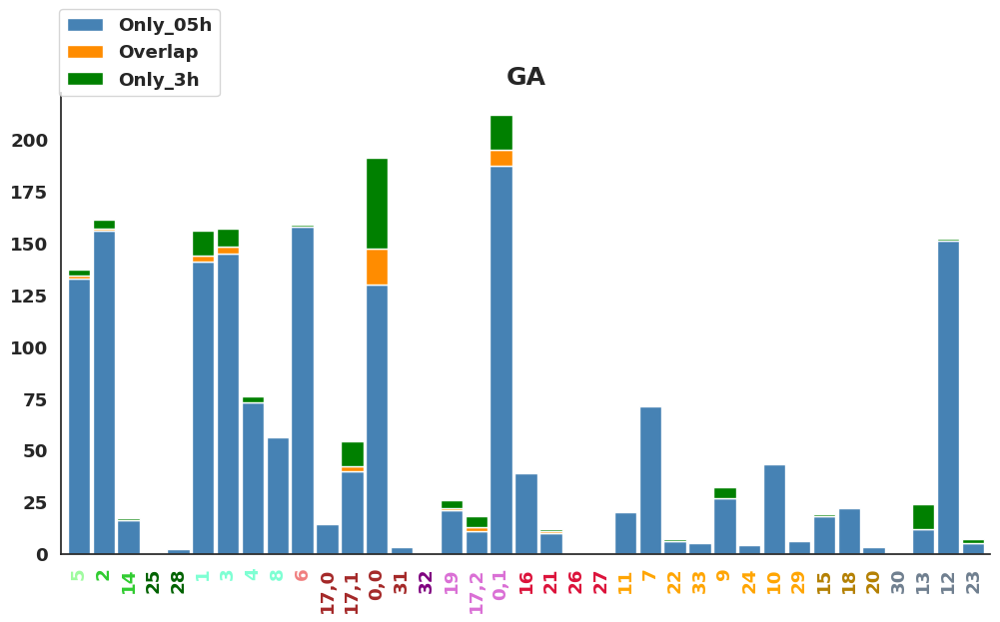

<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>


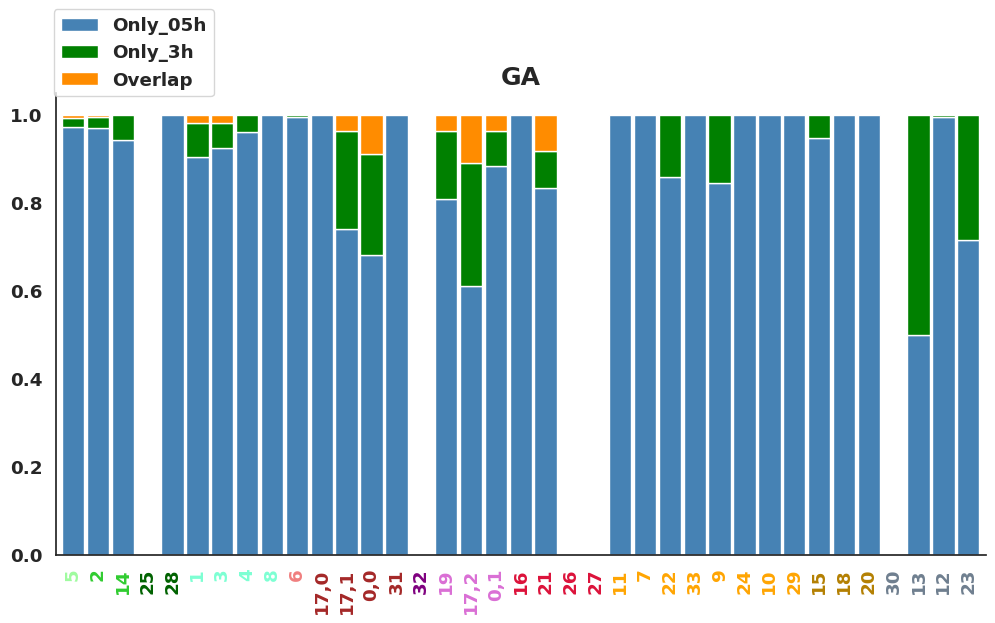

<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>


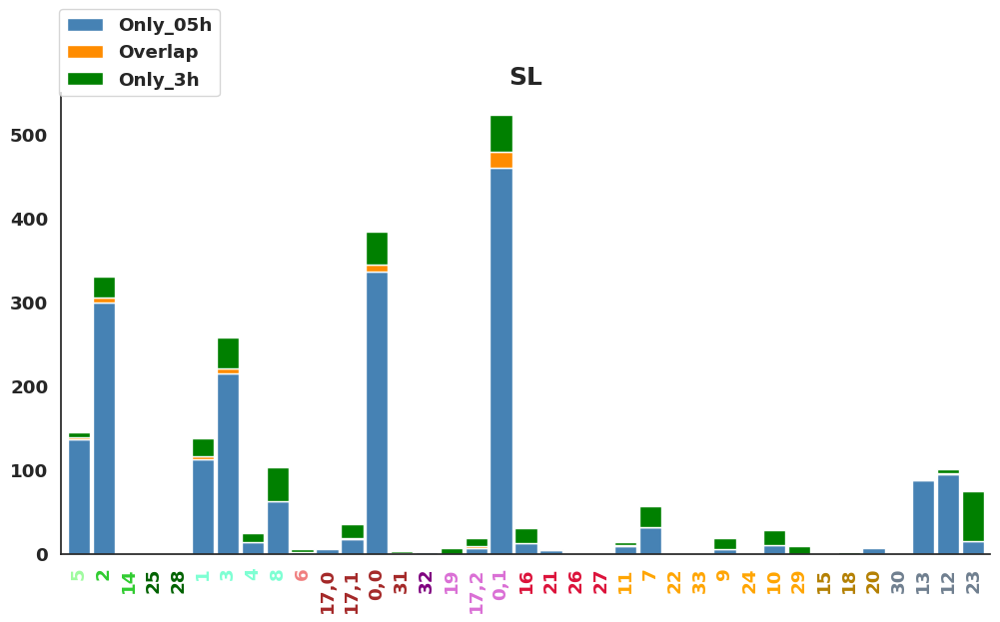

<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>


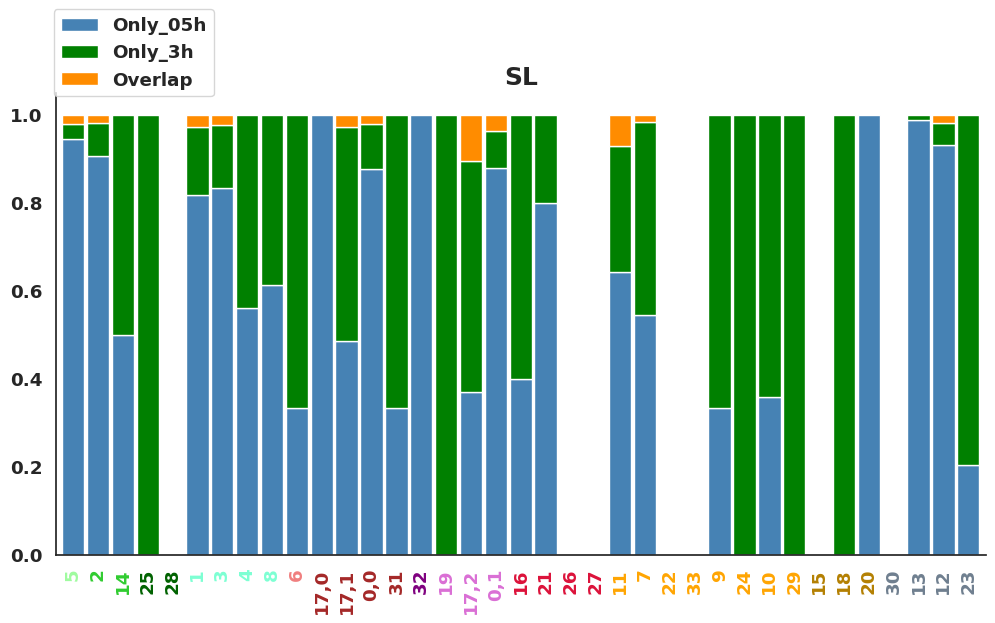

/tmp/ipykernel_52960/1123565187.py:38: RuntimeWarning: divide by zero encountered in log10
  smod = -np.log10(p)


<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>


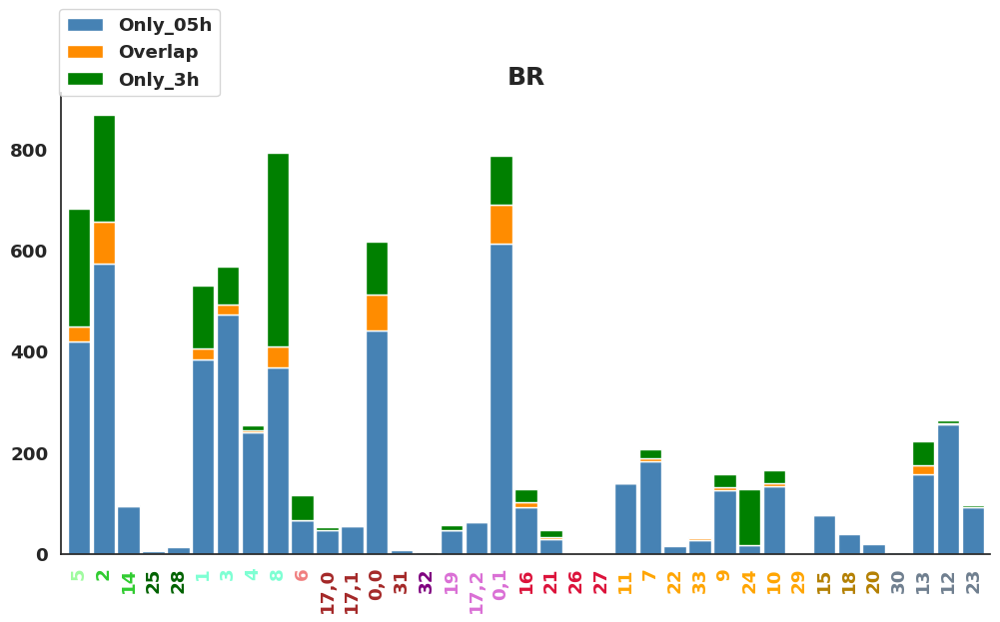

<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>


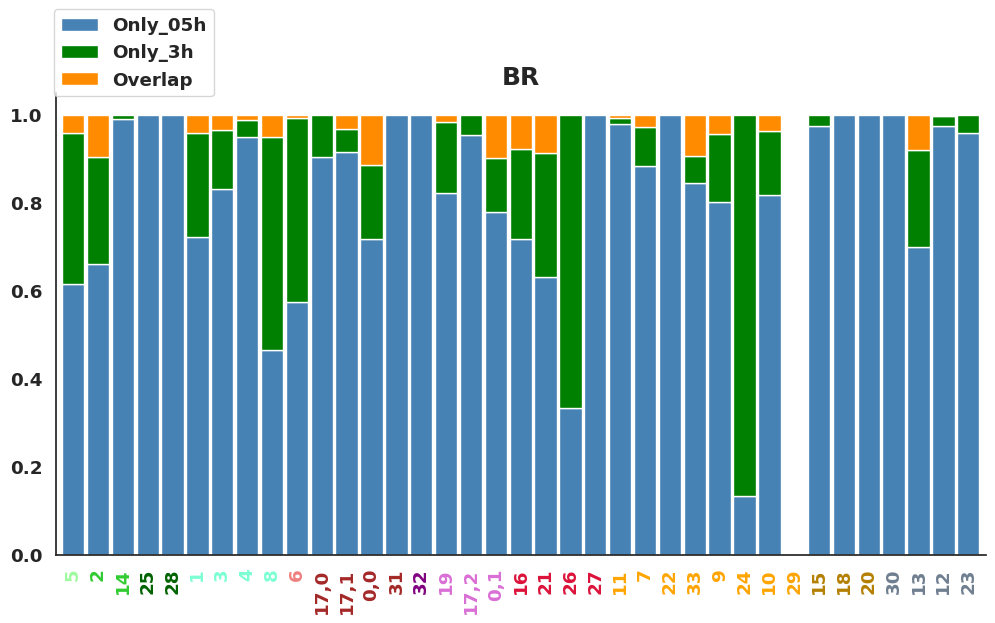

<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>


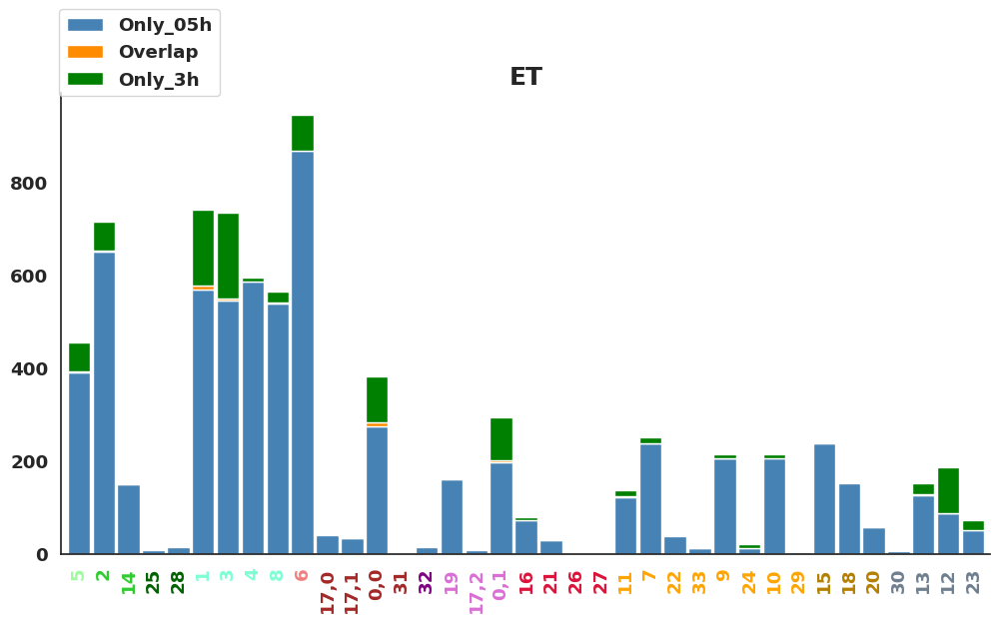

<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>


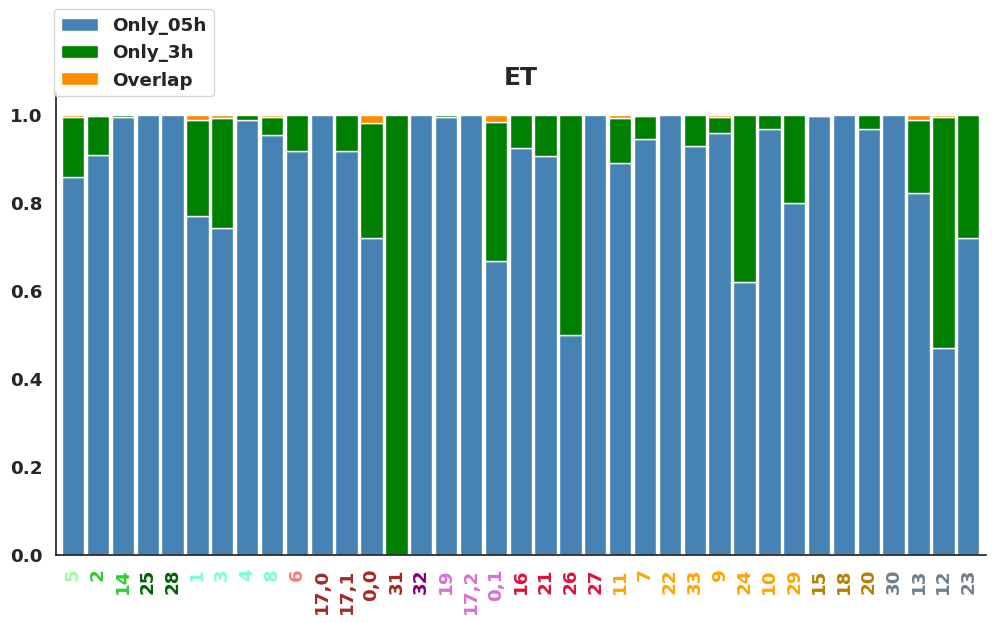

/tmp/ipykernel_52960/1123565187.py:38: RuntimeWarning: divide by zero encountered in log10
  smod = -np.log10(p)


<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>


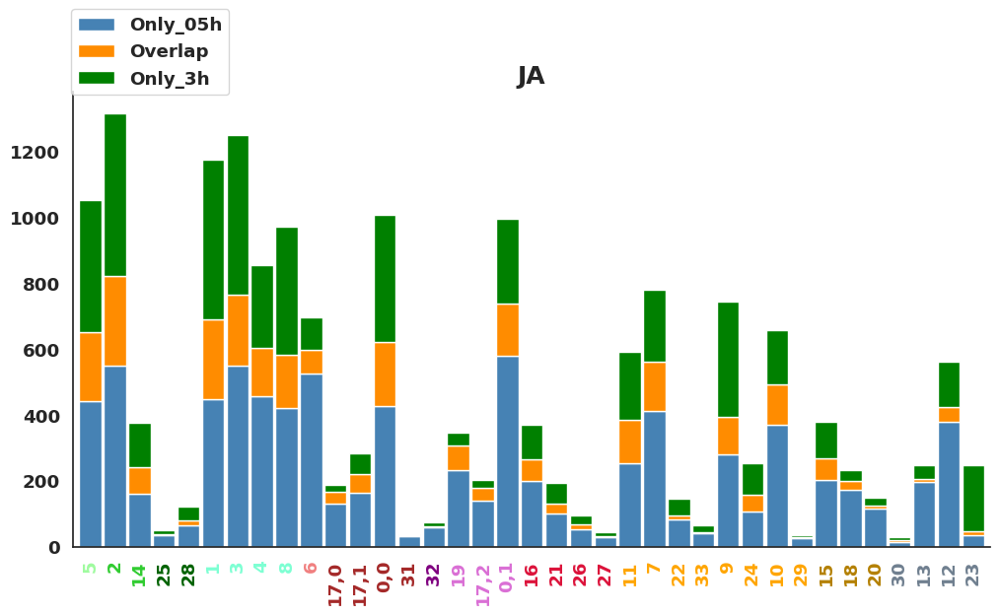

<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>


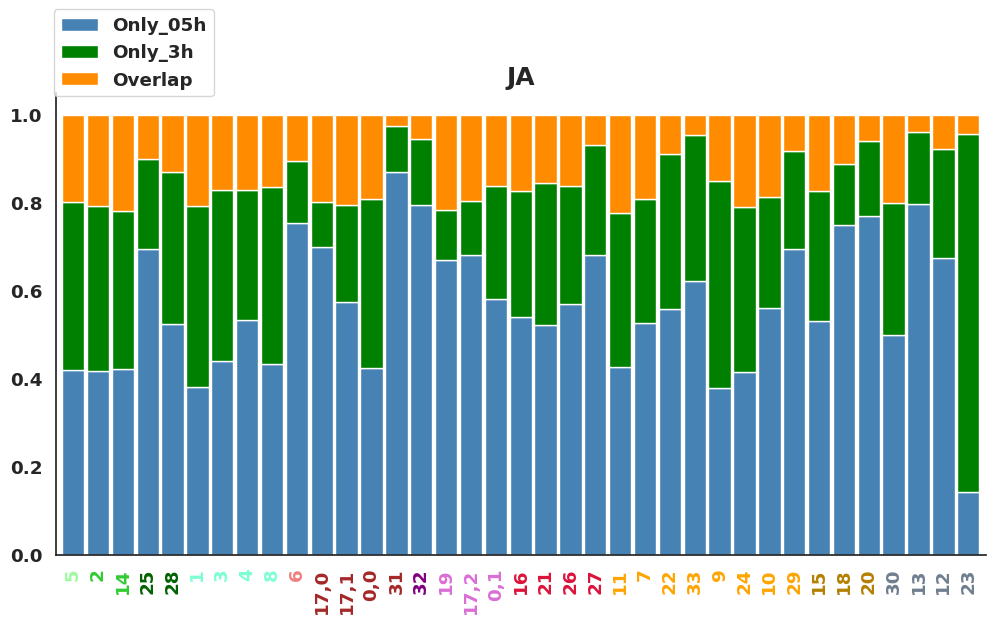

In [54]:
for i in hormone_list:
    count_up_df = deg_test(ourdeg,'Cluster','Up',i,cluster_order)

<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>


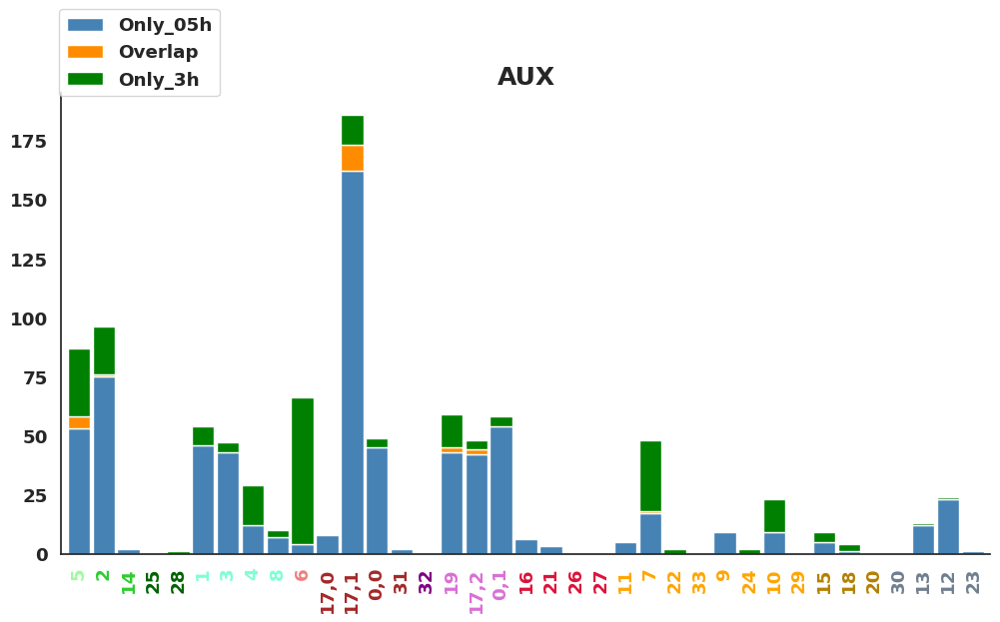

<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>


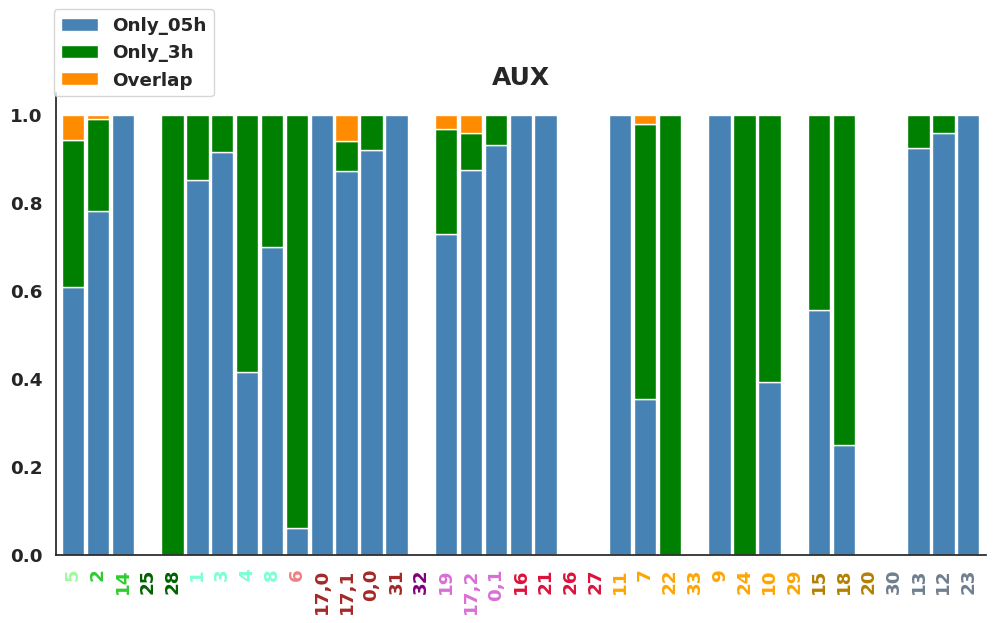

<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>


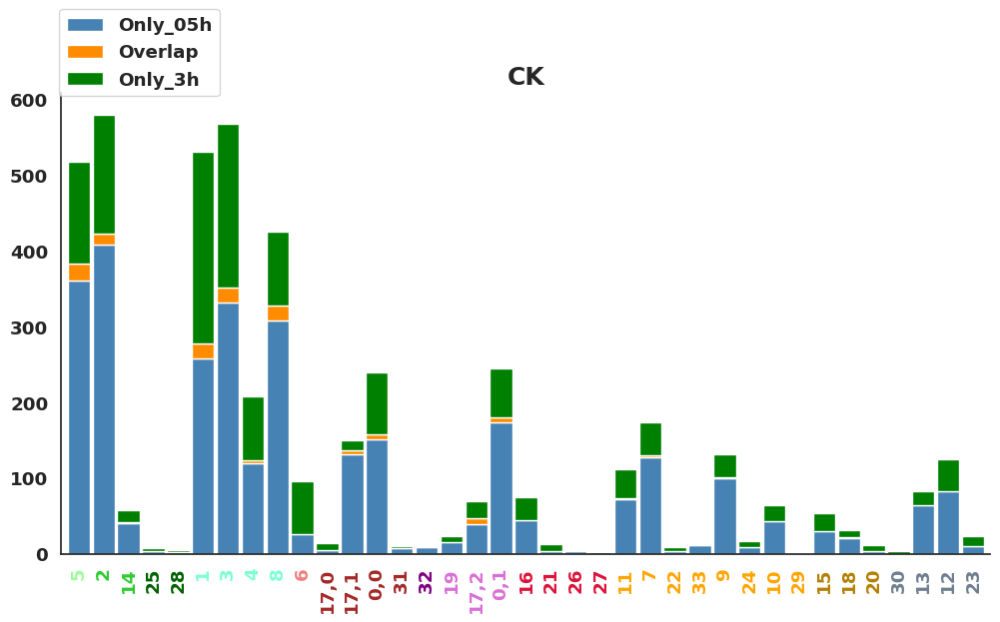

<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>


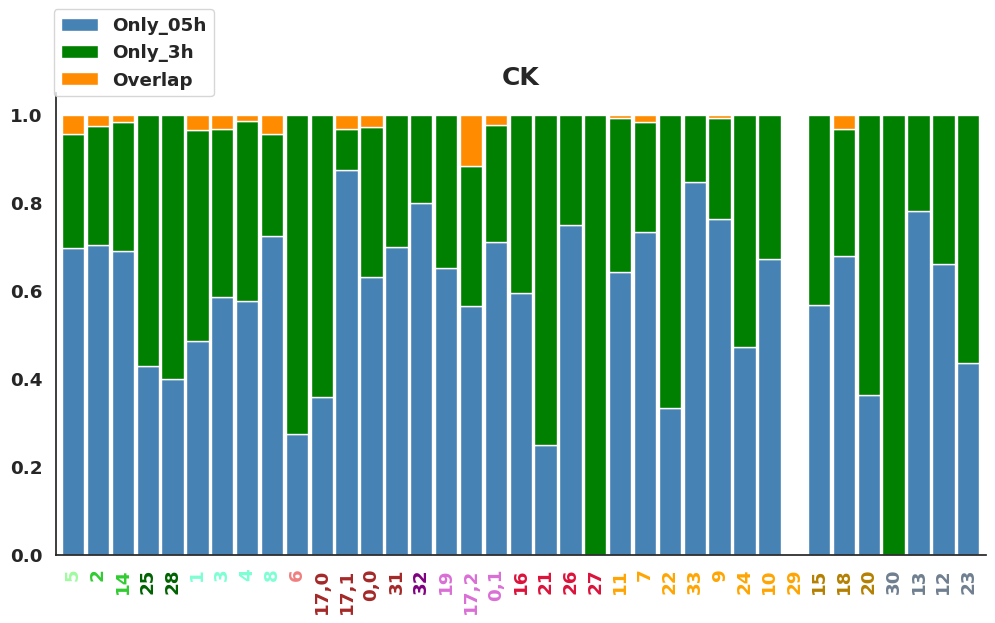

/tmp/ipykernel_52960/1123565187.py:38: RuntimeWarning: divide by zero encountered in log10
  smod = -np.log10(p)


<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>


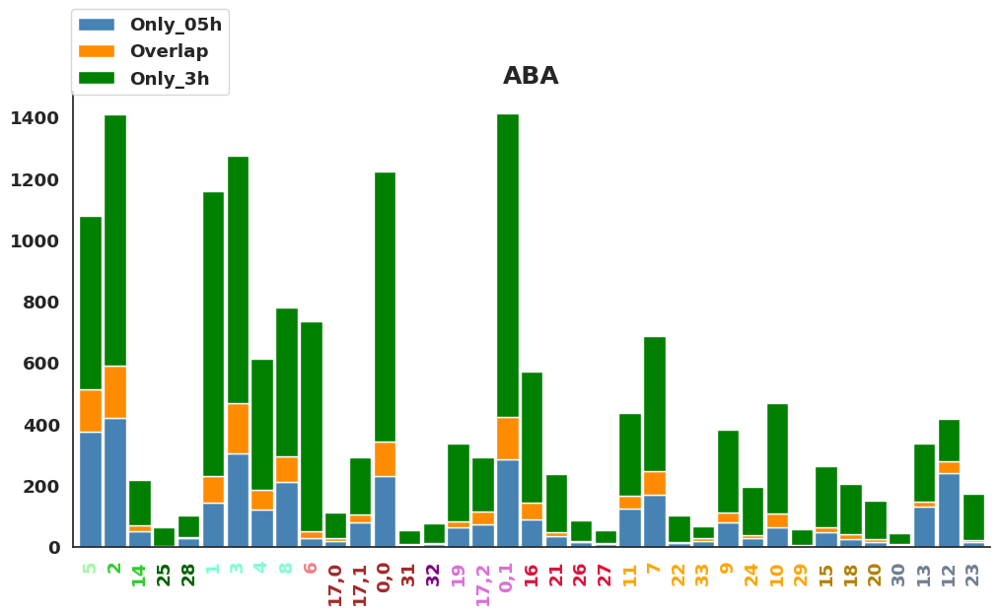

<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>


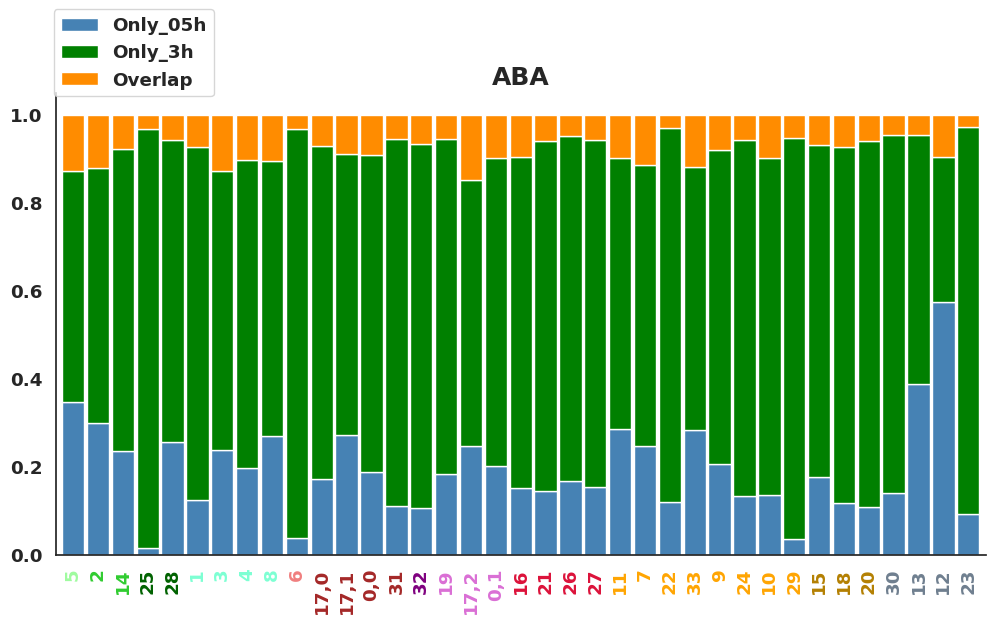

<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>


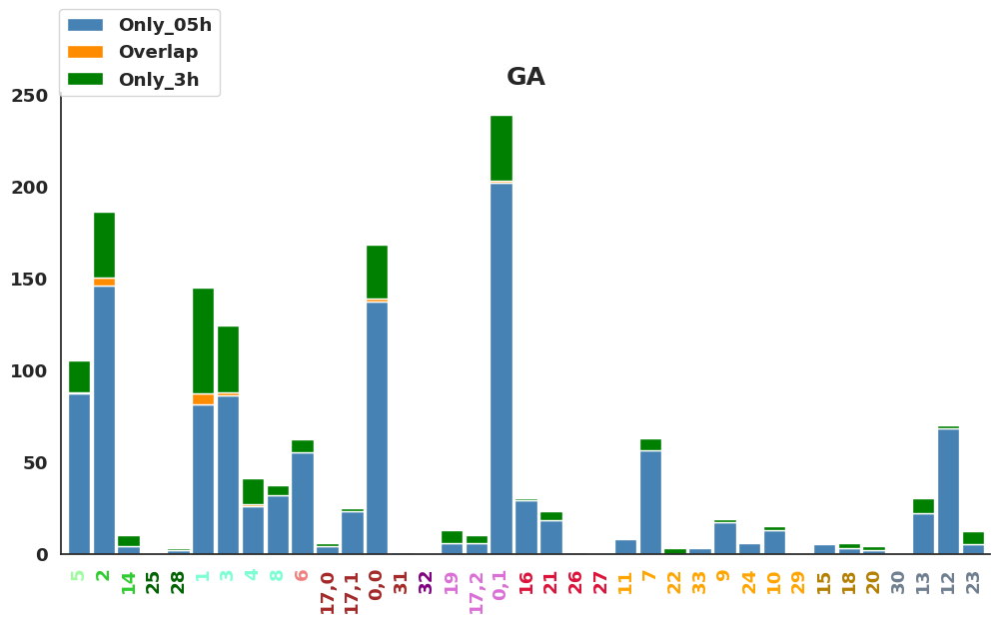

<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>


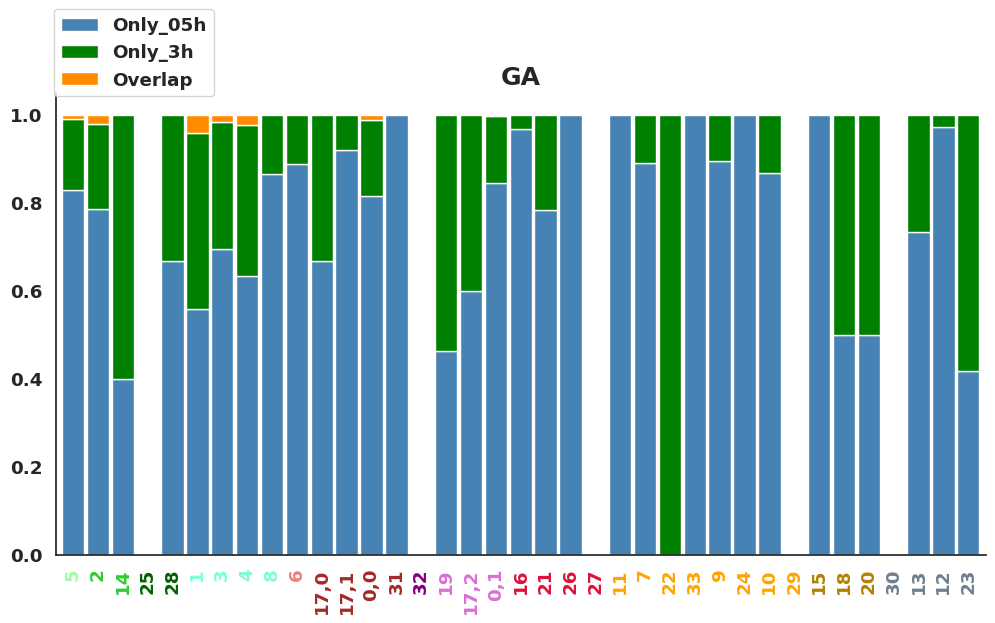

<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>


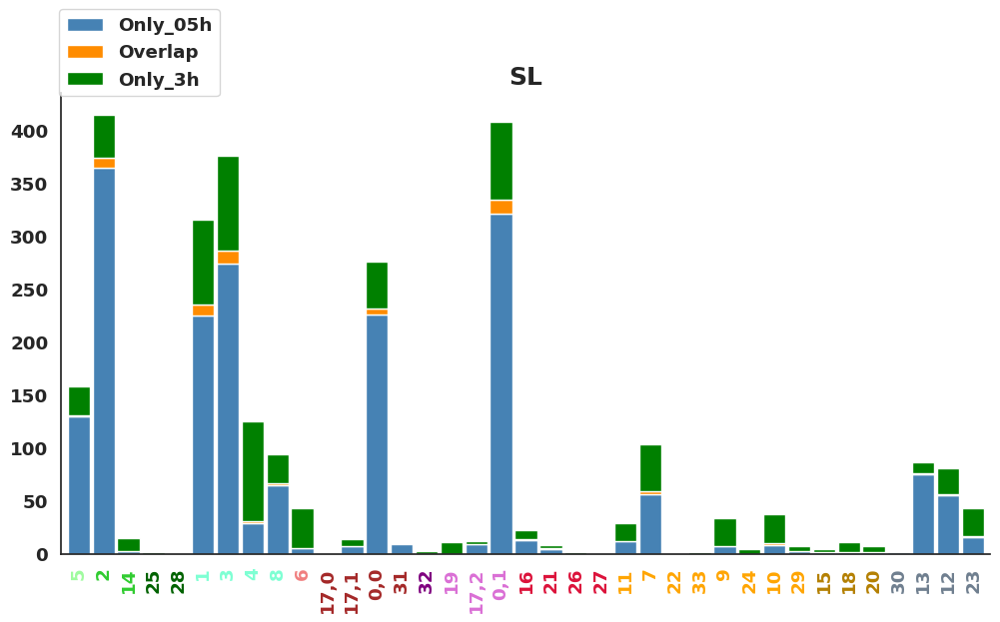

<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>


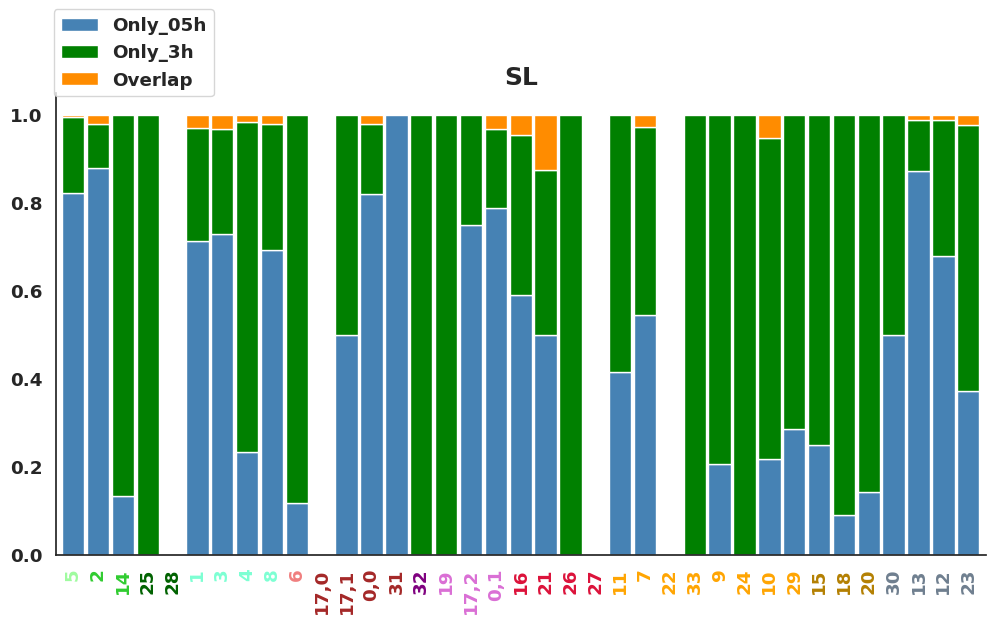

<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>


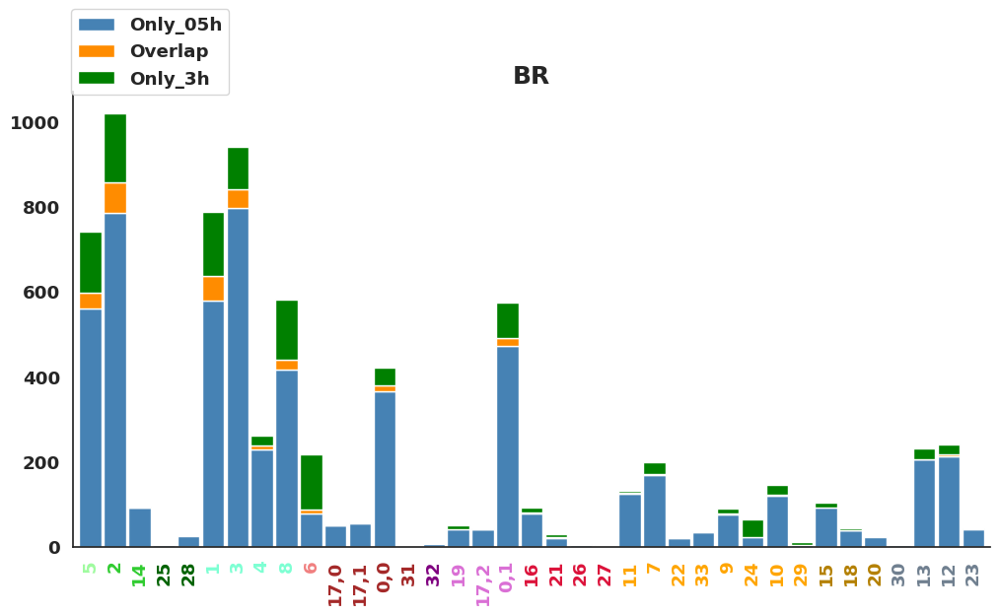

<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>


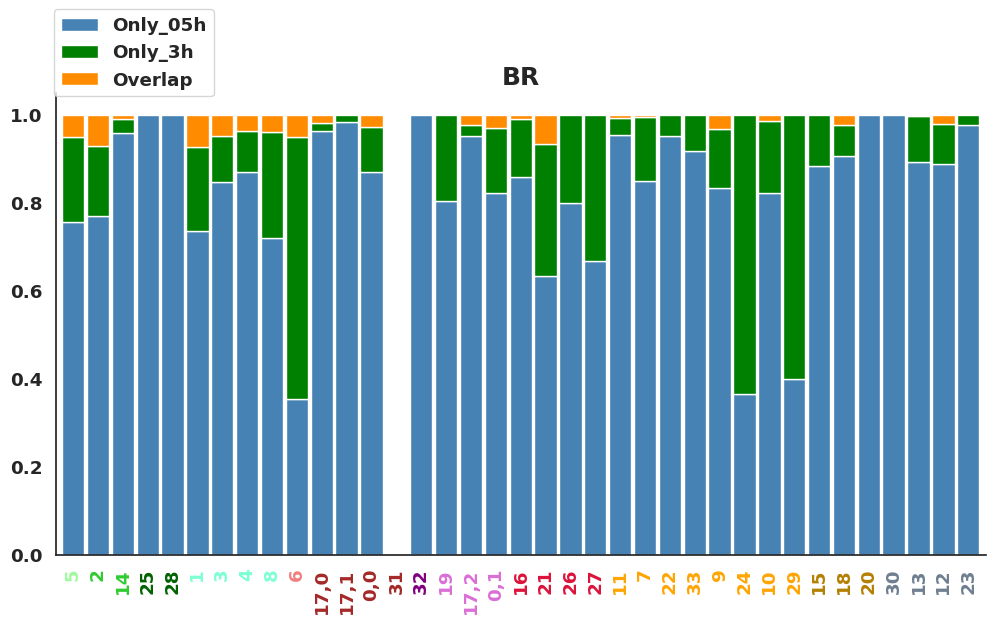

<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>


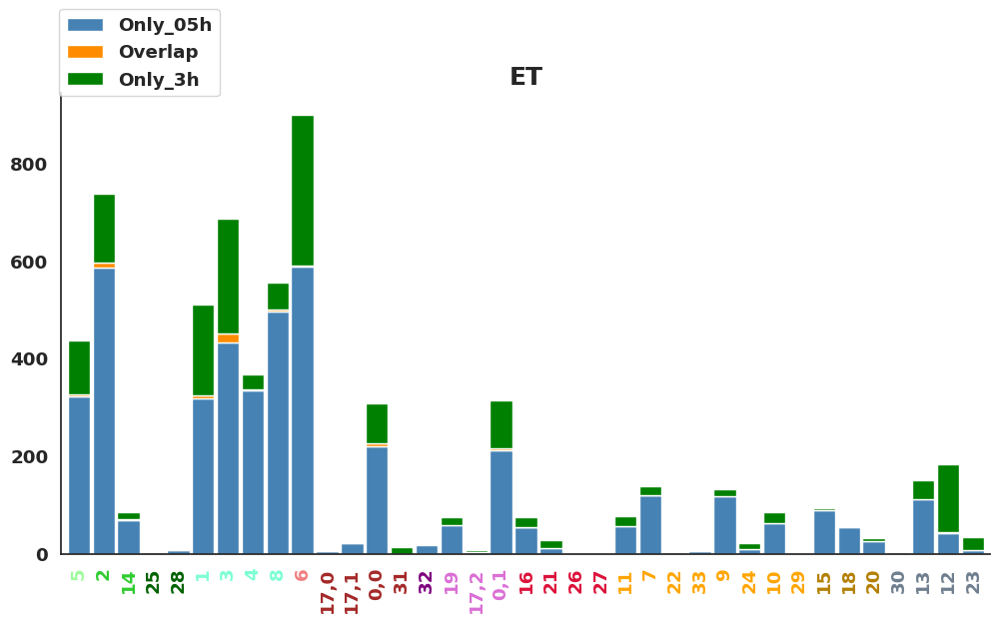

<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>


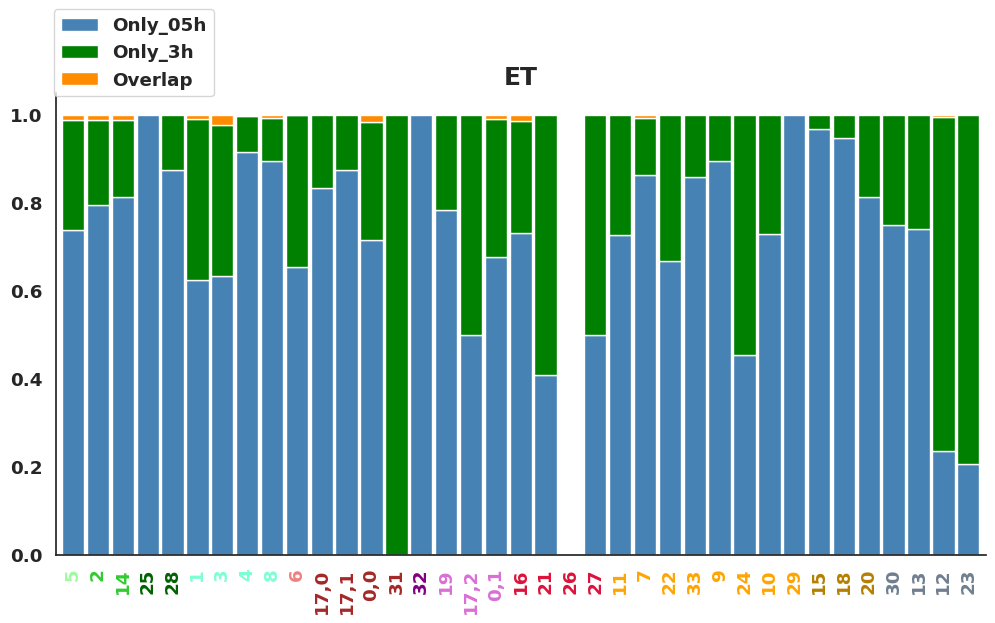

<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>


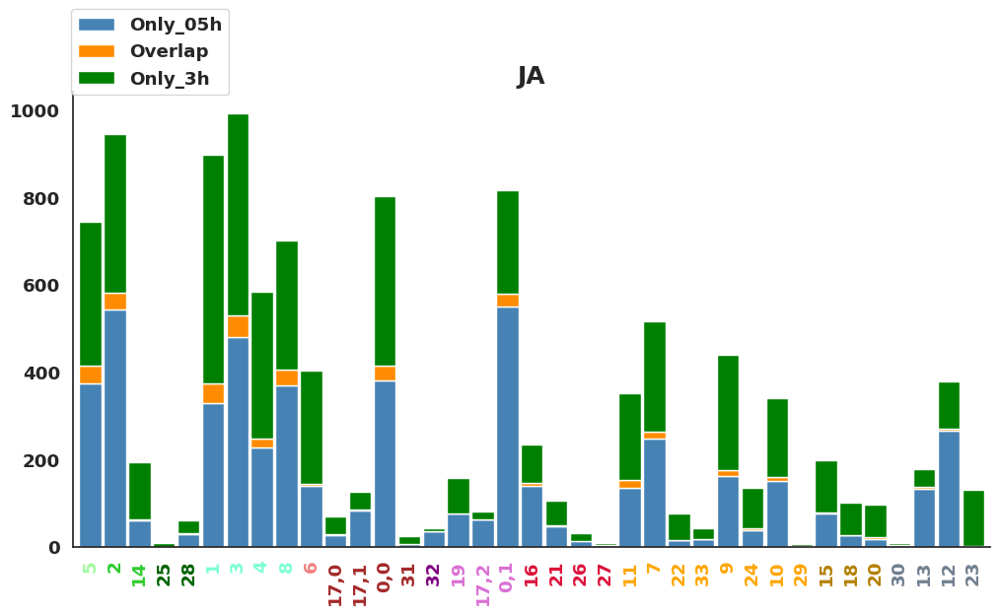

<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>


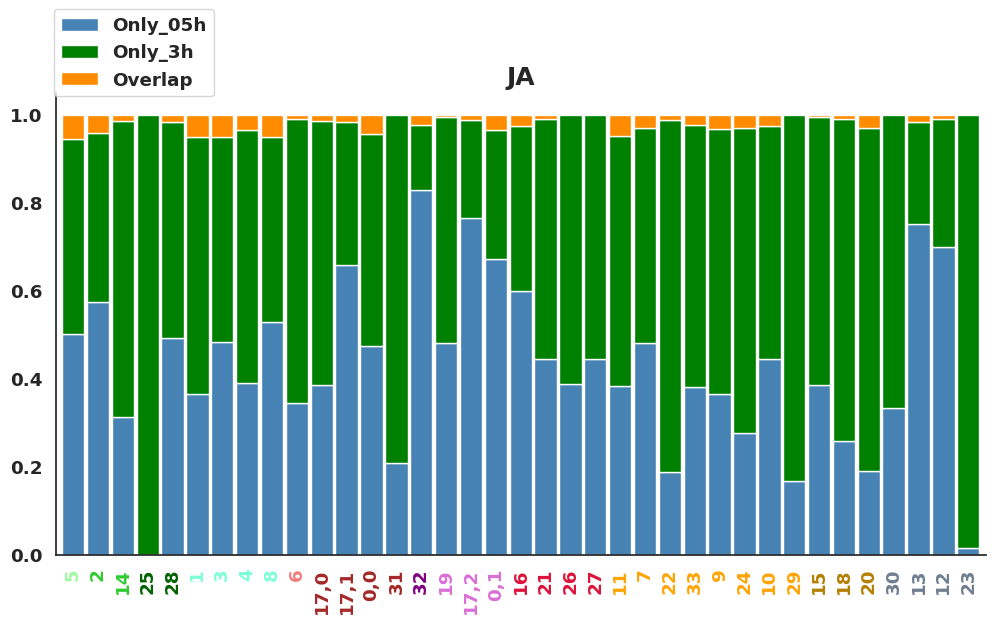

In [55]:
for i in hormone_list:
    count_up_df = deg_test(ourdeg,'Cluster','Down',i,cluster_order)

# bulk deg and all cluster deg compare

In [25]:
import pandas as pd

In [26]:
bulkdegdf = pd.read_excel('/public/home/lizw/home2/task/singlecell/singlecell_hormone/20240101/cpm_deg/compare_ONGOING/all_bulk_deg_collected.xlsx',)

In [27]:
hormone_list = ['AUX','CK','ABA','GA','SL','BR','ET','JA']

In [28]:
bulk_label_up_dict = {'ABA':'bulk_100μM_ABA_3h_Up',
                     'AUX':'bulk_1μM_IAA_6h_Up',
                     'CK':'bulk_5μM_BA_45min_root_Up',
                     'GA':'bulk_sprayed_100μM_GA3_2h_Up',
                     'JA':'bulk_spray_50 µM_MeJA_1h_5h_8h_Up',
                     'SL':'bulk_5μM_GR24 (4DO)_4h_Up',
                     'ET':'bulk_4h_C2H4_Up',
                     'BR':'bulk_BL_100nM_4h_Up'}
bulk_label_down_dict = {'ABA':'bulk_100μM_ABA_3h_Down',
                     'AUX':'bulk_1μM_IAA_6h_Down',
                     'CK':'bulk_5μM_BA_45min_root_Down',
                     'GA':'bulk_sprayed_100μM_GA3_2h_Down',
                     'JA':'bulk_spray_50 µM_MeJA_1h_5h_8h_Down',
                     'SL':'bulk_5μM_GR24 (4DO)_4h_Down',
                     'ET':'bulk_4h_C2H4_Down',
                     'BR':'bulk_BL_100nM_4h_Down'}

In [29]:
#Up compare
UPbulk_and_singledeg_df = pd.DataFrame(index=hormone_list,columns=['Only_Bulk_DEG','Only_Cluster_DEG','Overlap','Sum'])
up_overlap_dict = {}
for hormone in hormone_list:
    for direction in ['Up']:
        bulk_label = bulk_label_up_dict[hormone]
        bulk_deg = set(list(bulkdegdf[bulk_label]))
        cluster_deg = set(list(ourdeg.query('(Hormone == @hormone)&(DEG == "Up")')['index']))
        UPbulk_and_singledeg_df.loc[hormone,'Only_Bulk_DEG'] = len(bulk_deg - cluster_deg)
        UPbulk_and_singledeg_df.loc[hormone,'Only_Cluster_DEG'] = len(cluster_deg-bulk_deg)
        UPbulk_and_singledeg_df.loc[hormone,'Overlap'] = len(cluster_deg&bulk_deg)
        up_overlap_dict[hormone] = cluster_deg&bulk_deg
        UPbulk_and_singledeg_df.loc[hormone,'Sum'] = len(cluster_deg|bulk_deg)

In [30]:
UPbulk_and_singledeg_df = UPbulk_and_singledeg_df.reindex(['Only_Cluster_DEG','Overlap'],axis=1)
UPbulk_and_singledeg_df.columns = ['New found in snRNA-seq','Found in Bulk']
up_bulk_clusterdeg = UPbulk_and_singledeg_df.T/UPbulk_and_singledeg_df.sum(axis=1)

In [36]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

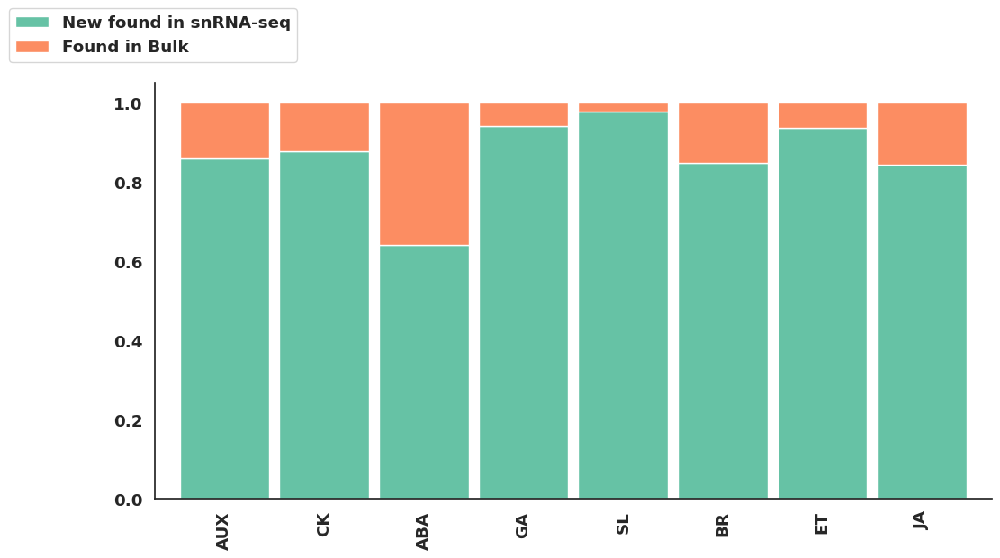

In [37]:
sns.set(font_scale=1.2,style='white',rc={'font.weight': 'bold'})
fig,ax = plt.subplots(1,figsize=(12,6))
ax.spines[['right', 'top']].set_visible(False)

orange_green_cmap = mcolors.ListedColormap(['#66c2a5','#fc8d62'])
up_bulk_clusterdeg.T.plot(kind='bar',ax=ax,width=0.9,stacked=True,cmap = orange_green_cmap)
ax.legend(bbox_to_anchor=(0.18, 1.2))

In [38]:
up_bulk_clusterdeg

,AUX,CK,ABA,GA,SL,BR,ET,JA
New found in snRNA-seq,0.859504,0.877622,0.641376,0.940814,0.977897,0.848453,0.938097,0.842832
Found in Bulk,0.140496,0.122378,0.358624,0.059186,0.022103,0.151547,0.061903,0.157168


In [39]:
#down compare
DOWNbulk_and_singledeg_df = pd.DataFrame(index=hormone_list,columns=['Only_Bulk_DEG','Only_Cluster_DEG','Overlap','Sum'])
down_overlap_dict = {}
for hormone in hormone_list:
    bulk_label = bulk_label_down_dict[hormone]
    bulk_deg = set(list(bulkdegdf[bulk_label]))
    cluster_deg = set(list(ourdeg.query('(Hormone == @hormone)&(DEG == "Down")')['index']))
    DOWNbulk_and_singledeg_df.loc[hormone,'Only_Bulk_DEG'] = len(bulk_deg - cluster_deg)
    DOWNbulk_and_singledeg_df.loc[hormone,'Only_Cluster_DEG'] = len(cluster_deg-bulk_deg)
    DOWNbulk_and_singledeg_df.loc[hormone,'Overlap'] = len(cluster_deg&bulk_deg)
    down_overlap_dict[hormone] = cluster_deg&bulk_deg
    DOWNbulk_and_singledeg_df.loc[hormone,'Sum'] = len(cluster_deg|bulk_deg)

In [40]:
DOWNbulk_and_singledeg_df = DOWNbulk_and_singledeg_df.reindex(['Only_Cluster_DEG','Overlap'],axis=1)
DOWNbulk_and_singledeg_df.columns = ['New found in snRNA-seq','Found in Bulk']
down_bulk_clusterdeg = DOWNbulk_and_singledeg_df.T/DOWNbulk_and_singledeg_df.sum(axis=1)

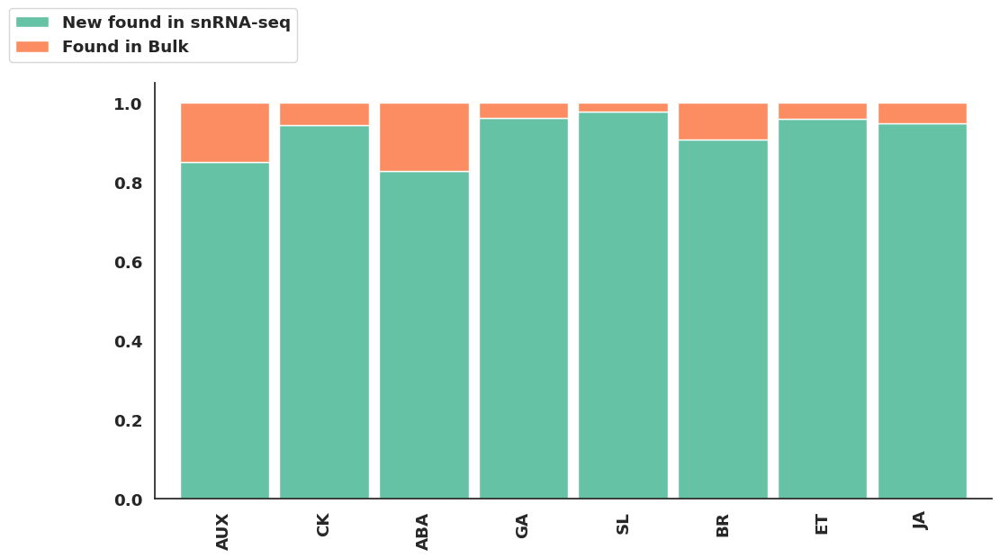

In [41]:
sns.set(font_scale=1.2,style='white',rc={'font.weight': 'bold'})
fig,ax = plt.subplots(1,figsize=(12,6))
ax.spines[['right', 'top']].set_visible(False)
down_bulk_clusterdeg.T.plot(kind='bar',ax=ax,width=0.9,stacked=True,cmap = orange_green_cmap)
ax.legend(bbox_to_anchor=(0.18, 1.2))

In [70]:
down_bulk_clusterdeg.T

,New found in snRNA-seq,Found in Bulk
AUX,0.85174,0.14826
CK,0.944364,0.055636
ABA,0.828541,0.171459
GA,0.962199,0.037801
SL,0.978442,0.021558
BR,0.907796,0.092204
ET,0.960409,0.039591
JA,0.948324,0.051676


## the cluster count distribution of overlap part

In [71]:
up_withbulk_genes = []
for i in up_overlap_dict:
    genelist = up_overlap_dict[i]
    up_subdegdf = ourdeg.query('(DEG == "Up") & (Hormone == @i) & (index in @genelist)')
    up_withbulk_genes.append(up_subdegdf)
filter_up_deg = pd.concat(up_withbulk_genes)

down_withbulk_genes = []
for i in down_overlap_dict:
    genelist = down_overlap_dict[i]
    down_subdegdf = ourdeg.query('(DEG == "Down") & (Hormone == @i) & (index in @genelist)')
    down_withbulk_genes.append(down_subdegdf)
filter_down_deg = pd.concat(down_withbulk_genes)

In [72]:
filter_cluster_count_df_up = filter_up_deg.groupby(['b','index']).count()['Cluster'].reset_index()
filter_cluster_count_df_up = filter_cluster_count_df_up.rename({'Cluster':'Cluster Count'},axis=1)
filter_cluster_count_df_down = filter_down_deg.groupby(['b','index']).count()['Cluster'].reset_index()
filter_cluster_count_df_down = filter_cluster_count_df_down.rename({'Cluster':'Cluster Count'},axis=1)

In [73]:
filter_cluster_count_df_up

,b,index,Cluster Count
0,ABA_05h,AT1G01120,1
1,ABA_05h,AT1G01240,1
2,ABA_05h,AT1G01470,6
3,ABA_05h,AT1G01480,1
4,ABA_05h,AT1G01600,1
...,...,...,...
4804,SL_3h,AT4G16680,1
4805,SL_3h,AT4G30350,3
4806,SL_3h,AT4G39070,3
4807,SL_3h,AT5G45340,2


/tmp/ipykernel_52960/2376954182.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  CUT_clustercount_dict_df = CUT_clustercount_dict_df.append(segments)
/tmp/ipykernel_52960/2376954182.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  CUT_clustercount_dict_df = CUT_clustercount_dict_df.append(segments)
/tmp/ipykernel_52960/2376954182.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  CUT_clustercount_dict_df = CUT_clustercount_dict_df.append(segments)
/tmp/ipykernel_52960/2376954182.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  CUT_clustercount_dict_df = CUT_clustercount_dict_df.append(segments)
/tmp/ipykernel_52960/2376954182.

,1,2-4,5-9,10-14,15-19,>=20
AUX_05h,0.395604,0.197802,0.164835,0.065934,0.065934,0.109890
AUX_3h,0.536082,0.257732,0.113402,0.051546,0.020619,0.020619
CK_05h,0.271605,0.259259,0.209877,0.131687,0.053498,0.074074
CK_3h,0.393548,0.270968,0.167742,0.109677,0.019355,0.038710
ABA_05h,0.271204,0.312042,0.203141,0.086911,0.041885,0.084817
ABA_3h,0.208618,0.283858,0.247606,0.099179,0.061560,0.099179
GA_05h,0.319149,0.276596,0.319149,0.063830,0.021277,0.000000
GA_3h,0.800000,0.200000,0.000000,0.000000,0.000000,0.000000
SL_05h,0.473684,0.368421,0.157895,0.000000,0.000000,0.000000
SL_3h,0.461538,0.461538,0.038462,0.038462,0.000000,0.000000


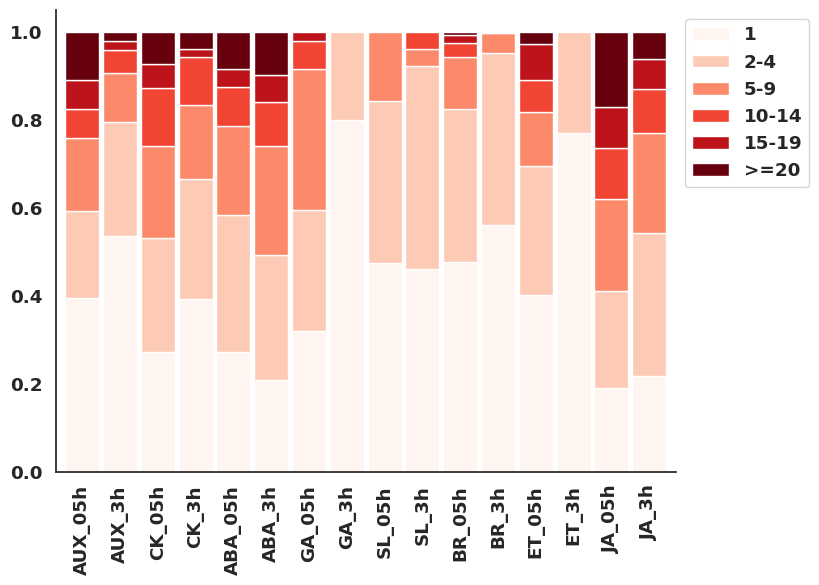

In [74]:
clustercount_bin_barplot(filter_cluster_count_df_up,
                         groupby='b',
                         groupby_order=sample_list_order,
                         bins=[1,2,5,10,15,20,39],
                         binlabels = ['1','2-4','5-9','10-14','15-19','>=20'],
                         cmap='Reds')

/tmp/ipykernel_52960/2376954182.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  CUT_clustercount_dict_df = CUT_clustercount_dict_df.append(segments)
/tmp/ipykernel_52960/2376954182.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  CUT_clustercount_dict_df = CUT_clustercount_dict_df.append(segments)
/tmp/ipykernel_52960/2376954182.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  CUT_clustercount_dict_df = CUT_clustercount_dict_df.append(segments)
/tmp/ipykernel_52960/2376954182.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  CUT_clustercount_dict_df = CUT_clustercount_dict_df.append(segments)
/tmp/ipykernel_52960/2376954182.

,1,2-4,5-9,10-14,15-19,>=20
AUX_05h,0.652174,0.347826,0.000000,0.000000,0.000000,0.000000
AUX_3h,0.756098,0.219512,0.024390,0.000000,0.000000,0.000000
CK_05h,0.608247,0.319588,0.072165,0.000000,0.000000,0.000000
CK_3h,0.586207,0.241379,0.103448,0.034483,0.034483,0.000000
ABA_05h,0.463731,0.297927,0.129534,0.054404,0.023316,0.031088
ABA_3h,0.258713,0.308311,0.202413,0.081769,0.044236,0.104558
GA_05h,0.600000,0.350000,0.050000,0.000000,0.000000,0.000000
GA_3h,0.571429,0.285714,0.095238,0.047619,0.000000,0.000000
SL_05h,0.562500,0.375000,0.062500,0.000000,0.000000,0.000000
SL_3h,0.285714,0.380952,0.285714,0.047619,0.000000,0.000000


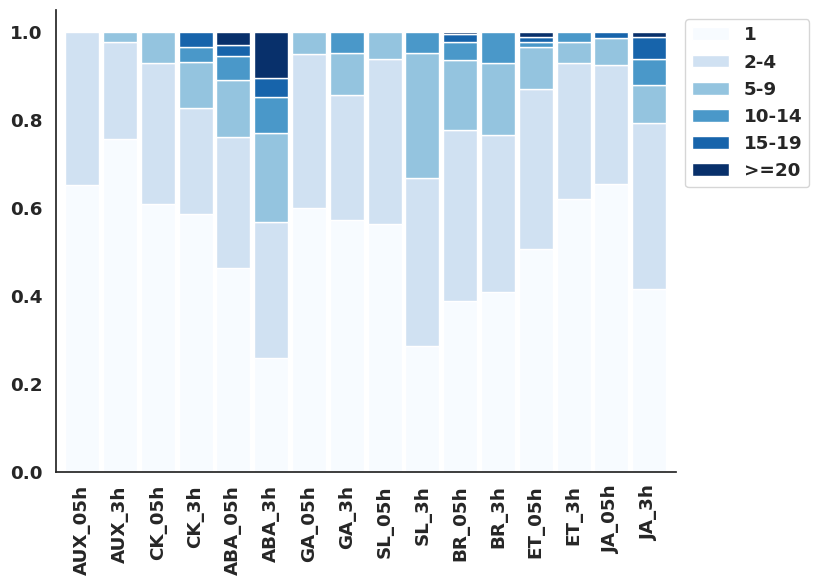

In [75]:
clustercount_bin_barplot(filter_cluster_count_df_down,
                         groupby='b',
                         groupby_order=sample_list_order,
                         bins=[1,2,5,10,15,20,39],
                         binlabels = ['1','2-4','5-9','10-14','15-19','>=20'],
                         cmap='Blues')

# compare self pesudobulk with cluster deg

In [42]:
bulkdegdf = pd.read_excel('/public/home/lizw/home2/task/singlecell/singlecell_hormone/20240101/cpm_deg/compare_ONGOING/self_pseudobulk_compare.xlsx',)

In [43]:
hormone_list = ['AUX','CK','ABA','GA','SL','BR','ET','JA']

In [44]:
bulk_label_up_dict = {
                      'AUX_05h':'snRNA-seq_5μM_IAA_0.5h_Up',
                      'AUX_3h':'snRNA-seq_5μM_IAA_3h_Up',
                      'CK_05h':'snRNA-seq_5μM_BA_0.5h_Up',
                      'CK_3h':'snRNA-seq_5μM_BA_3h_Up',
                      'ABA_05h':'snRNA-seq_100μM_ABA_0.5h_Up',
                      'ABA_3h':'snRNA-seq_100μM_ABA_3h_Up',
                      'GA_05h':'snRNA-seq_100μM_GA3_0.5h_Up',
                      'GA_3h':'snRNA-seq_100μM_GA3_3h_Up',
                      'SL_05h':'snRNA-seq_5μM_GR24 (4DO)_0.5h_Up',
                      'SL_3h':'snRNA-seq_5μM_GR24 (4DO)_3h_Up',
                      'BR_05h':'snRNA-seq_1μM_BL_0.5h_Up',
                      'BR_3h':'snRNA-seq_1μM_BL_3h_Up',
                      'ET_05h':'snRNA-seq_100μM_ACC_0.5h_Up',
                      'ET_3h':'snRNA-seq_100μM_ACC_3h_Up',
                      'JA_05h':'snRNA-seq_100μM_MeJA_0.5h_Up',
                      'JA_3h':'snRNA-seq_100μM_MeJA_3h_Up',}

bulk_label_down_dict = {'AUX_05h':'snRNA-seq_5μM_IAA_0.5h_Down',
                      'AUX_3h':'snRNA-seq_5μM_IAA_3h_Down',
                      'CK_05h':'snRNA-seq_5μM_BA_0.5h_Down',
                      'CK_3h':'snRNA-seq_5μM_BA_3h_Down',
                      'ABA_05h':'snRNA-seq_100μM_ABA_0.5h_Down',
                      'ABA_3h':'snRNA-seq_100μM_ABA_3h_Down',
                      'GA_05h':'snRNA-seq_100μM_GA3_0.5h_Down',
                      'GA_3h':'snRNA-seq_100μM_GA3_3h_Down',
                      'SL_05h':'snRNA-seq_5μM_GR24 (4DO)_0.5h_Down',
                      'SL_3h':'snRNA-seq_5μM_GR24 (4DO)_3h_Down',
                      'BR_05h':'snRNA-seq_1μM_BL_0.5h_Down',
                      'BR_3h':'snRNA-seq_1μM_BL_3h_Down',
                      'ET_05h':'snRNA-seq_100μM_ACC_0.5h_Down',
                      'ET_3h':'snRNA-seq_100μM_ACC_3h_Down',
                      'JA_05h':'snRNA-seq_100μM_MeJA_0.5h_Down',
                      'JA_3h':'snRNA-seq_100μM_MeJA_3h_Down',}

In [45]:
#Up compare
UPbulk_and_singledeg_df = pd.DataFrame(index=bulk_label_up_dict.keys(),columns=['Only_Bulk_DEG','Only_Cluster_DEG','Overlap','Sum'])
up_overlap_dict = {}
for sample in bulk_label_up_dict.keys():
    for direction in ['Up']:
        bulk_label = bulk_label_up_dict[sample]
        bulk_deg = set(list(bulkdegdf[bulk_label]))
        cluster_deg = set(list(ourdeg.query('(b == @sample)&(DEG == "Up")')['index']))
        UPbulk_and_singledeg_df.loc[sample,'Only_Bulk_DEG'] = len(bulk_deg - cluster_deg)
        UPbulk_and_singledeg_df.loc[sample,'Only_Cluster_DEG'] = len(cluster_deg-bulk_deg)
        UPbulk_and_singledeg_df.loc[sample,'Overlap'] = len(cluster_deg&bulk_deg)
        up_overlap_dict[sample] = cluster_deg&bulk_deg
        UPbulk_and_singledeg_df.loc[sample,'Sum'] = len(cluster_deg|bulk_deg)

In [46]:
UPbulk_and_singledeg_df = UPbulk_and_singledeg_df.reindex(['Only_Cluster_DEG','Overlap'],axis=1)
UPbulk_and_singledeg_df.columns = ['New found in snRNA-seq','Found in Bulk']
up_bulk_clusterdeg = UPbulk_and_singledeg_df.T/UPbulk_and_singledeg_df.sum(axis=1)

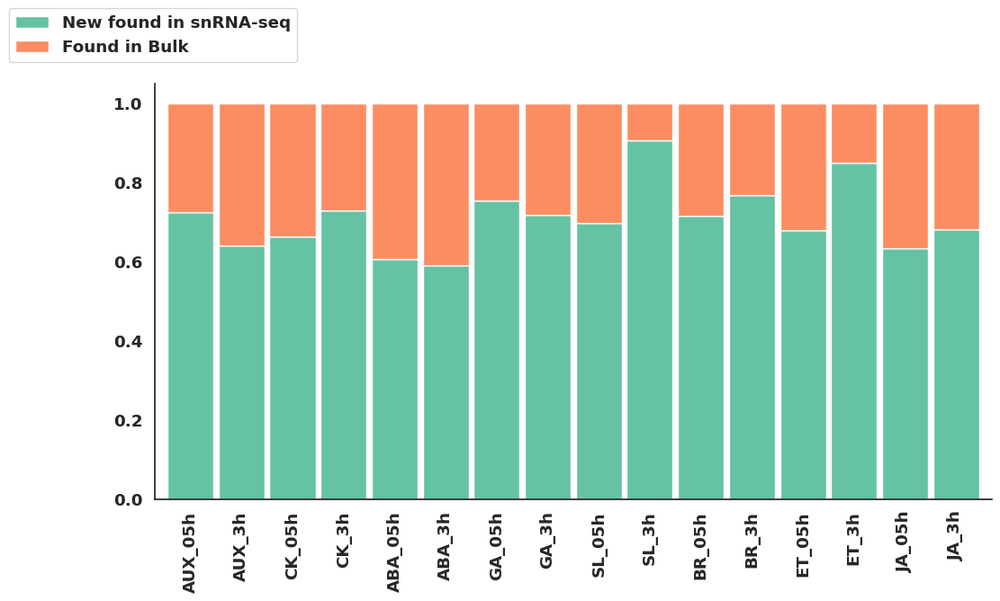

In [48]:
sns.set(font_scale=1.2,style='white',rc={'font.weight': 'bold'})
fig,ax = plt.subplots(1,figsize=(12,6))
ax.spines[['right', 'top']].set_visible(False)
up_bulk_clusterdeg.T.plot(kind='bar',ax=ax,width=0.9,stacked=True,cmap = orange_green_cmap)
ax.legend(bbox_to_anchor=(0.18, 1.2))

In [49]:
up_bulk_clusterdeg

,AUX_05h,AUX_3h,CK_05h,CK_3h,ABA_05h,ABA_3h,GA_05h,GA_3h,SL_05h,SL_3h,BR_05h,BR_3h,ET_05h,ET_3h,JA_05h,JA_3h
New found in snRNA-seq,0.723325,0.640379,0.663551,0.728363,0.606625,0.589698,0.754875,0.716535,0.69697,0.905488,0.715795,0.768166,0.6794,0.848889,0.634059,0.680032
Found in Bulk,0.276675,0.359621,0.336449,0.271637,0.393375,0.410302,0.245125,0.283465,0.30303,0.094512,0.284205,0.231834,0.3206,0.151111,0.365941,0.319968


In [50]:
#down compare
DOWNbulk_and_singledeg_df = pd.DataFrame(index=bulk_label_down_dict.keys(),columns=['Only_Bulk_DEG','Only_Cluster_DEG','Overlap','Sum'])
down_overlap_dict = {}
for sample in bulk_label_down_dict.keys():
    for direction in ['Down']:
        bulk_label = bulk_label_down_dict[sample]
        bulk_deg = set(list(bulkdegdf[bulk_label]))
        cluster_deg = set(list(ourdeg.query('(b == @sample)&(DEG == "Down")')['index']))
        DOWNbulk_and_singledeg_df.loc[sample,'Only_Bulk_DEG'] = len(bulk_deg - cluster_deg)
        DOWNbulk_and_singledeg_df.loc[sample,'Only_Cluster_DEG'] = len(cluster_deg-bulk_deg)
        DOWNbulk_and_singledeg_df.loc[sample,'Overlap'] = len(cluster_deg&bulk_deg)
        down_overlap_dict[sample] = cluster_deg&bulk_deg
        DOWNbulk_and_singledeg_df.loc[sample,'Sum'] = len(cluster_deg|bulk_deg)

In [51]:
DOWNbulk_and_singledeg_df = DOWNbulk_and_singledeg_df.reindex(['Only_Cluster_DEG','Overlap'],axis=1)
DOWNbulk_and_singledeg_df.columns = ['New found in snRNA-seq','Found in Bulk']
down_bulk_clusterdeg = DOWNbulk_and_singledeg_df.T/DOWNbulk_and_singledeg_df.sum(axis=1)

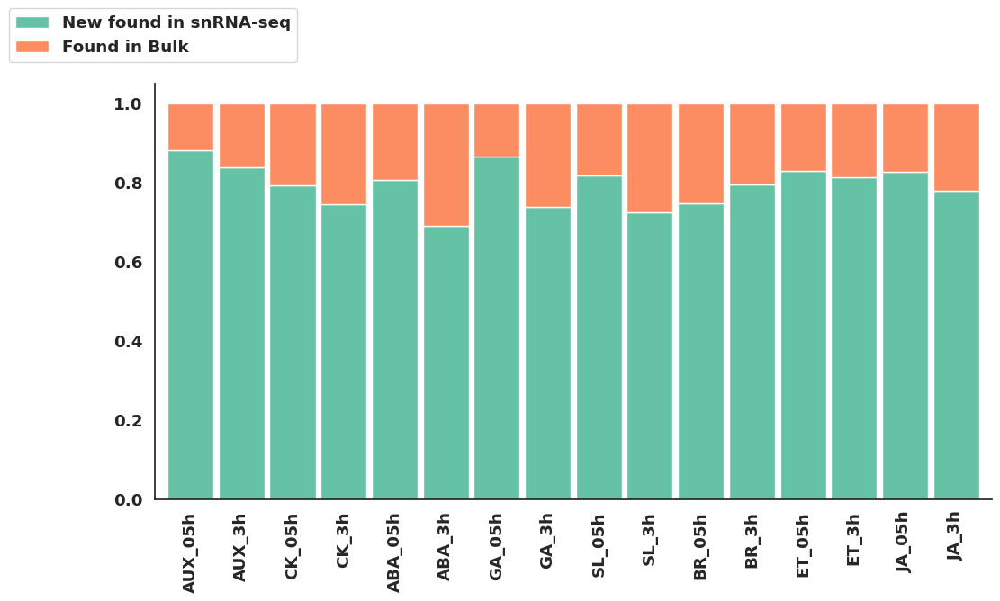

In [53]:
sns.set(font_scale=1.2,style='white',rc={'font.weight': 'bold'})
fig,ax = plt.subplots(1,figsize=(12,6))
ax.spines[['right', 'top']].set_visible(False)
down_bulk_clusterdeg.T.plot(kind='bar',ax=ax,width=0.9,stacked=True,cmap = orange_green_cmap)
ax.legend(bbox_to_anchor=(0.18, 1.2))

In [86]:
down_bulk_clusterdeg

,AUX_05h,AUX_3h,CK_05h,CK_3h,ABA_05h,ABA_3h,GA_05h,GA_3h,SL_05h,SL_3h,BR_05h,BR_3h,ET_05h,ET_3h,JA_05h,JA_3h
New found in snRNA-seq,0.880658,0.837321,0.792367,0.744898,0.807188,0.690969,0.866207,0.737705,0.817953,0.725212,0.746141,0.794521,0.829724,0.813397,0.827223,0.77931
Found in Bulk,0.119342,0.162679,0.207633,0.255102,0.192812,0.309031,0.133793,0.262295,0.182047,0.274788,0.253859,0.205479,0.170276,0.186603,0.172777,0.22069


## the cluster count distribution of overlap part

In [87]:
up_withbulk_genes = []
for i in up_overlap_dict:
    genelist = up_overlap_dict[i]
    up_subdegdf = ourdeg.query('(DEG == "Up") & (b == @i) & (index in @genelist)')
    up_withbulk_genes.append(up_subdegdf)
filter_up_deg = pd.concat(up_withbulk_genes)

down_withbulk_genes = []
for i in down_overlap_dict:
    genelist = down_overlap_dict[i]
    down_subdegdf = ourdeg.query('(DEG == "Down") & (b == @i) & (index in @genelist)')
    down_withbulk_genes.append(down_subdegdf)
filter_down_deg = pd.concat(down_withbulk_genes)

In [88]:
filter_cluster_count_df_up = filter_up_deg.groupby(['b','index']).count()['Cluster'].reset_index()
filter_cluster_count_df_up = filter_cluster_count_df_up.rename({'Cluster':'Cluster Count'},axis=1)
filter_cluster_count_df_down = filter_down_deg.groupby(['b','index']).count()['Cluster'].reset_index()
filter_cluster_count_df_down = filter_cluster_count_df_down.rename({'Cluster':'Cluster Count'},axis=1)

In [89]:
filter_cluster_count_df_up

,b,index,Cluster Count
0,ABA_05h,AT1G01010,9
1,ABA_05h,AT1G01030,11
2,ABA_05h,AT1G01470,6
3,ABA_05h,AT1G01480,1
4,ABA_05h,AT1G01520,10
...,...,...,...
7415,SL_3h,AT5G22140,1
7416,SL_3h,AT5G36180,3
7417,SL_3h,AT5G48010,6
7418,SL_3h,AT5G56970,1


/tmp/ipykernel_52960/2376954182.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  CUT_clustercount_dict_df = CUT_clustercount_dict_df.append(segments)
/tmp/ipykernel_52960/2376954182.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  CUT_clustercount_dict_df = CUT_clustercount_dict_df.append(segments)
/tmp/ipykernel_52960/2376954182.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  CUT_clustercount_dict_df = CUT_clustercount_dict_df.append(segments)
/tmp/ipykernel_52960/2376954182.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  CUT_clustercount_dict_df = CUT_clustercount_dict_df.append(segments)
/tmp/ipykernel_52960/2376954182.

,1,2-4,5-9,10-14,15-19,>=20
AUX_05h,0.286996,0.363229,0.197309,0.049327,0.040359,0.062780
AUX_3h,0.377193,0.324561,0.184211,0.070175,0.017544,0.026316
CK_05h,0.153846,0.273504,0.288462,0.141026,0.064103,0.079060
CK_3h,0.249211,0.388013,0.249211,0.075710,0.012618,0.025237
ABA_05h,0.145263,0.271579,0.297895,0.114737,0.068421,0.102105
ABA_3h,0.134307,0.222628,0.312409,0.138686,0.077372,0.114599
GA_05h,0.215909,0.329545,0.289773,0.107955,0.028409,0.028409
GA_3h,0.388889,0.583333,0.027778,0.000000,0.000000,0.000000
SL_05h,0.386842,0.507895,0.092105,0.013158,0.000000,0.000000
SL_3h,0.354839,0.483871,0.129032,0.032258,0.000000,0.000000


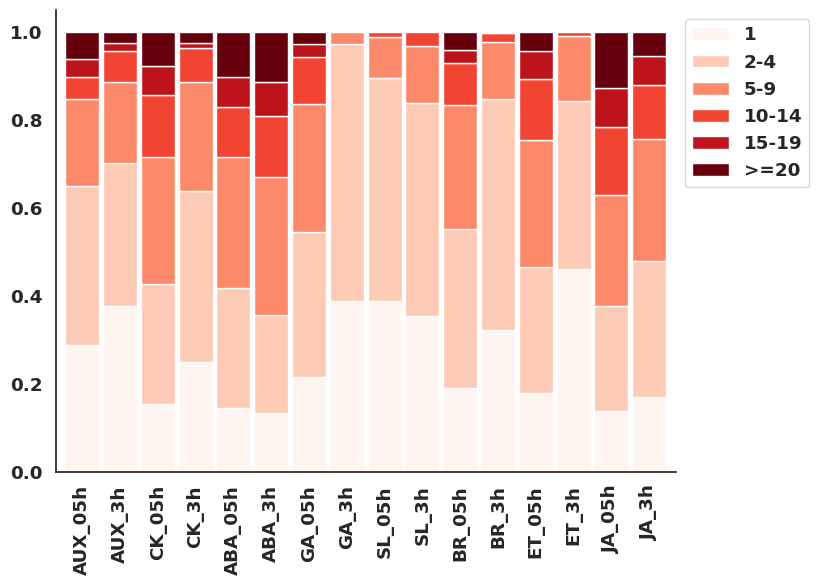

In [90]:
clustercount_bin_barplot(filter_cluster_count_df_up,
                         groupby='b',
                         groupby_order=sample_list_order,
                         bins=[1,2,5,10,15,20,39],
                         binlabels = ['1','2-4','5-9','10-14','15-19','>=20'],
                         cmap='Reds')

/tmp/ipykernel_52960/2376954182.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  CUT_clustercount_dict_df = CUT_clustercount_dict_df.append(segments)
/tmp/ipykernel_52960/2376954182.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  CUT_clustercount_dict_df = CUT_clustercount_dict_df.append(segments)
/tmp/ipykernel_52960/2376954182.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  CUT_clustercount_dict_df = CUT_clustercount_dict_df.append(segments)
/tmp/ipykernel_52960/2376954182.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  CUT_clustercount_dict_df = CUT_clustercount_dict_df.append(segments)
/tmp/ipykernel_52960/2376954182.

,1,2-4,5-9,10-14,15-19,>=20
AUX_05h,0.482759,0.396552,0.086207,0.000000,0.034483,0.000000
AUX_3h,0.647059,0.294118,0.058824,0.000000,0.000000,0.000000
CK_05h,0.327103,0.367601,0.242991,0.040498,0.021807,0.000000
CK_3h,0.234286,0.382857,0.228571,0.085714,0.034286,0.034286
ABA_05h,0.294710,0.307305,0.226700,0.080605,0.047859,0.042821
ABA_3h,0.218945,0.327078,0.213584,0.097408,0.050938,0.092046
GA_05h,0.319588,0.474227,0.164948,0.010309,0.010309,0.020619
GA_3h,0.395833,0.395833,0.125000,0.041667,0.020833,0.020833
SL_05h,0.377880,0.437788,0.142857,0.036866,0.004608,0.000000
SL_3h,0.288660,0.340206,0.288660,0.061856,0.020619,0.000000


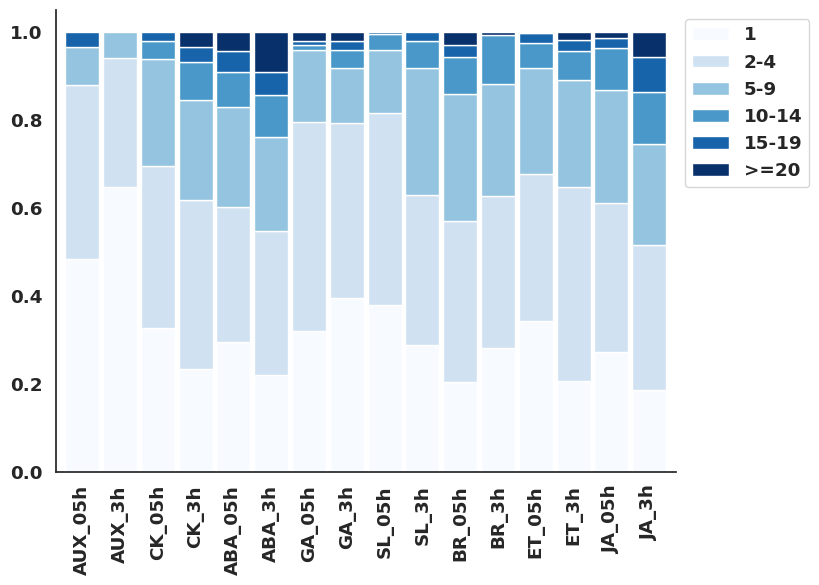

In [91]:
clustercount_bin_barplot(filter_cluster_count_df_down,
                         groupby='b',
                         groupby_order=sample_list_order,
                         bins=[1,2,5,10,15,20,39],
                         binlabels = ['1','2-4','5-9','10-14','15-19','>=20'],
                         cmap='Blues')

# compare ja Euclidean distance

In [103]:
import scanpy as sc

In [104]:
ad = sc.read_h5ad('/public/home/lizw/home2/task/singlecell/singlecell_hormone/20240101/ad_after_sub_1227_v3.h5ad')

In [112]:
ad_05h_ja = ad[ad.obs['Sample']=='JA_05h']
ad_05h_mock = ad[ad.obs['Sample']=='Mock_05h']
ad_3h_ja = ad[ad.obs['Sample']=='JA_3h']
ad_3h_mock = ad[ad.obs['Sample']=='Mock_3h']

In [116]:
import numpy as np

In [128]:
ad_05h_ja_umi = ad_05h_ja.X.log1p()
ad_05h_mock_umi = ad_05h_mock.X.log1p()

In [259]:
ad.obs.columns

Index(['Sample', 'Replicates', 'Time', 'All_label', 'Hormone',
       'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts',
       'log1p_total_counts', 'total_counts_Mito_Chlo',
       'log1p_total_counts_Mito_Chlo', 'pct_counts_Mito_Chlo', 'outlier',
       'ambientRnaFractionEstimatedBySoupx', 'Treatment', 'Cluster_prev',
       'new_anno_prev', 'Cluster', 'leiden_NN25_0.95', 'Cluster_0+',
       'Cluster_0+17+', 'Cluster_final', '__group', 'cluster5', 'cluster10',
       'cluster11', 'cluster22', 'cluster23', 'cluster12', 'cluster13',
       'cluster33', 'cluster30', 'anno_v2', 'cluster_anno_v2', 'anno_v3',
       'anno_v3_cluster', 'sample_cluster'],
      dtype='object')

In [269]:
def euclidean_distance_matrix(sample, mock,cluster):
    Sample_logumi_matrix = ad[(ad.obs['Sample']==sample) & (ad.obs['Cluster_final']==cluster)].X.log1p()
    Mock_logumi_matrix = ad[(ad.obs['Sample']==mock) & (ad.obs['Cluster_final']==cluster)].X.log1p()
    if Sample_logumi_matrix.sum() != 0:
        if Mock_logumi_matrix.sum() != 0:
            Sample_logumi_matrix_mean = Sample_logumi_matrix.mean(axis=0)
            Mock_logumi_matrix_mean = Mock_logumi_matrix.mean(axis=0)
            euid_distance = np.sqrt(np.sum((Sample_logumi_matrix_mean - Mock_logumi_matrix_mean).A.flatten() ** 2))

    else:
        euid_distance = np.nan
    return  euid_distance

In [281]:
cluster_num_order = ['5','2','14','25','28','1','3','4','8','6','17,0','17,1',
                    '0,0','31','32','19','17,2','0,1','16','21','26',
                    '27','11','7','22','33','9','24','10','29',
                    '15','18','20','30','13','12','23']
color_dict = {'#9ffb9f':['5'],
                 '#30cc30':['2','14'],
                 '#006200':['25','28'],
                 '#7dffd3':['1','3','4','8'],
                 '#f07f7f':['6'],
                 '#a42828':['17,0','17,1','0,0','31'],
                 '#7f007f':['32'],
                 '#da6fd5':['0,1','17,2','19'],
                 '#dc123a':['16','21','26','27'],
                 '#ffa502':['11','7','22','33','9','24','10','29'],
                 '#b48002':['15','18','20'],
                 '#6f7f8f':['30','13','12','23']}
color_dict_reverse = {x:y for x in cluster_num_order for y in color_dict if x in color_dict[y]}

In [282]:
euclid_df = pd.DataFrame(index=cluster_list,columns=['0.5h','3h'])
for i in cluster_num_order:
    eucl_value_05 = euclidean_distance_matrix('JA_05h', 'Mock_05h',i)
    euclid_df.loc[i,'0.5h'] = eucl_value_05
    eucl_value_3 = euclidean_distance_matrix('JA_3h', 'Mock_3h',i)
    euclid_df.loc[i,'3h'] = eucl_value_3

In [283]:
euclid_df_nor = euclid_df/euclid_df.max(axis=0)
euclid_df_nor = euclid_df_nor.reindex(cluster_num_order)

<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>
<class 'str'>


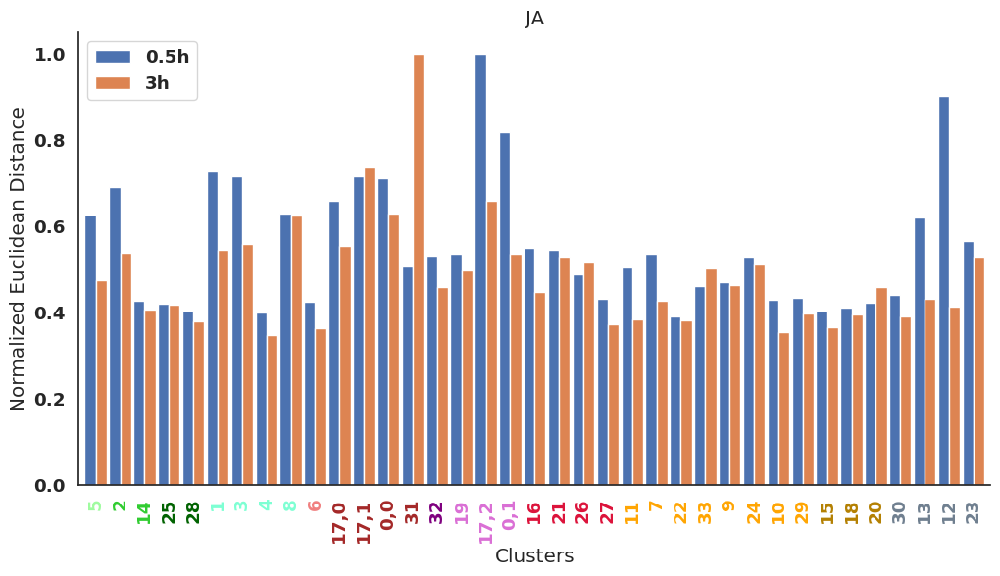

In [284]:
import seaborn as sns
sns.set(font_scale=1.2,style='white',rc={'font.weight': 'bold'})
import pandas as pd
import matplotlib.pyplot as plt

# Create a bar plot
fig,ax = plt.subplots(1,figsize=(12,6))
euclid_df_nor.plot(kind='bar',width=0.9,ax=ax)
for label in ax.get_xticklabels():
    if label.get_text() in color_dict_reverse:
        print(type(label.get_text()))
        label.set_color(color_dict_reverse[label.get_text()])

# Add percentage labels on top of the bars
ax.spines[['right', 'top']].set_visible(False)
plt.xlabel('Clusters')
plt.ylabel('Normalized Euclidean Distance' )
plt.title('JA')
plt.show()

In [285]:
cluster_order = ['5_Shoot Apical Meristem, Endodermis, Cortex',
 '2_Shoot Epidermal Cell',
 '14_Shoot Epidermal Cell',
 '25_Guard Cell',
 '28_Guard Cell',
 '1_Mesophyll Cell',
 '3_Mesophyll Cell',
 '4_Mesophyll Cell',
 '8_Mesophyll Cell',
 '6_Root Apical Meristem',
 '17,0_Root Epidermal Cell (Meristem)',
 '17,1_Root Epidermal Cell (Elongation)',
 '0,0_Atrichoblast (Maturation)',
 '31_Trichoblast (Maturation)',
 '32_Root Cap',
 '19_Root Cortex And Endodermis (Meristem)',
 '17,2_Root Cortex (Elongation)',
 '0,1_Root Cortex (Maturation)',
 '16_Root  Endodermis  (Suberization) (Elongation)',
 '21_Root Endodermis  (Suberization) (Maturation)',
 '26_Root Endodermis  (Suberization) (Maturation)',
 '27_Root Endodermis (Casparian Strip) (Maturation)',
 '11_Phleom Pole Pericycle',
 '7_Xylem Pole Pericycle',
 '22_Procambium and Immature Phleom',
 '33_Phleom (Sieve Element)',
 '9_Phleom (Companion cell)',
 '24_Phleom (Companion cell)',
 '10_Procambium and Immature Xylem',
 '29_Xylem',
 '15_Proliferating Cell (G1 and S Phase)',
 '18_Proliferating Cell (G2 Phase)',
 '20_Proliferating Cell (M Phase)',]

In [257]:
euclid_df_nor.index = 

,0.5h,3h
"5_Shoot Apical Meristem, Endodermis, Cortex",0.628386,0.47501
2_Shoot Epidermal Cell,0.691089,0.537509
14_Shoot Epidermal Cell,0.427555,0.406108
25_Guard Cell,0.421122,0.418264
28_Guard Cell,0.404639,0.378558
1_Mesophyll Cell,0.726967,0.546288
3_Mesophyll Cell,0.716941,0.558433
4_Mesophyll Cell,0.399517,0.348477
8_Mesophyll Cell,0.62864,0.62443
6_Root Apical Meristem,0.424923,0.364083


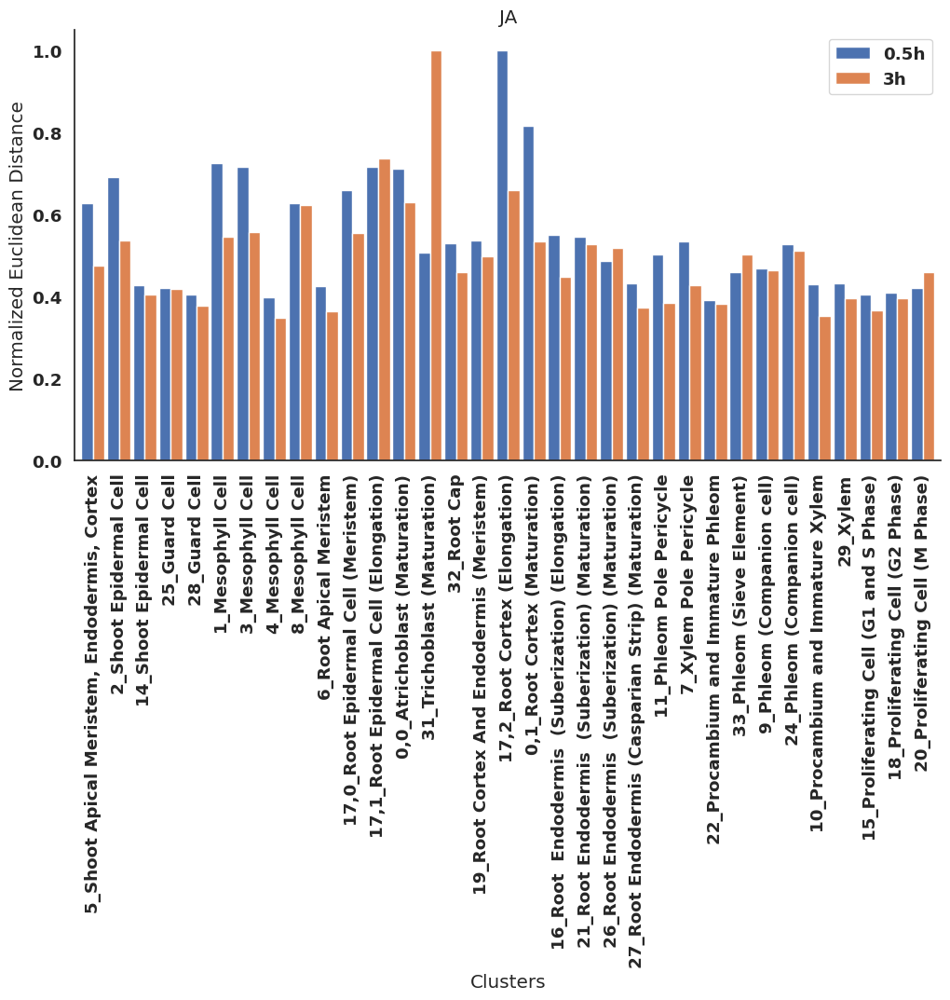

<Axes: >

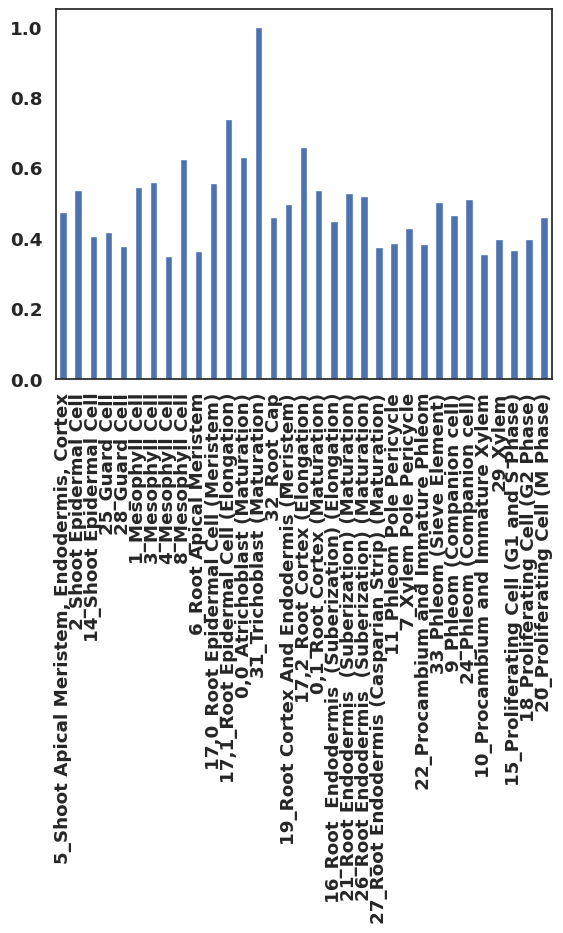

In [256]:
euclid_df_nor['3h'].plot(kind='bar')

<Axes: >

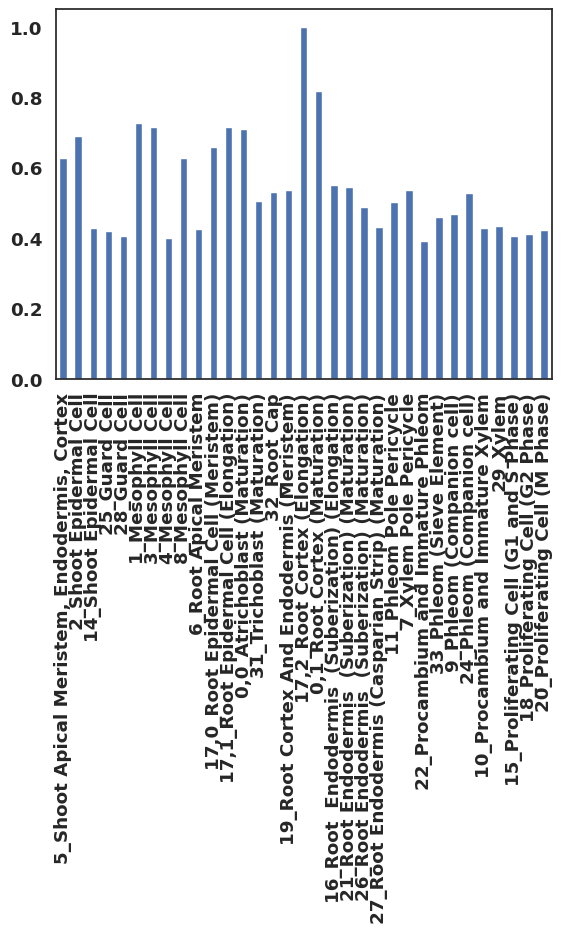

In [255]:
euclid_df_nor['0.5h'].plot(kind='bar')